## Data preparation

In [1]:
import torch, platform, os, sys
print("Python:", sys.version)
print("Platform:", platform.platform())
print("Torch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("CUDA device:", torch.cuda.get_device_name(0))
    print("CUDA capability:", torch.cuda.get_device_capability(0))
    print("Driver mem (free/total GB):", [x/1024**3 for x in torch.cuda.mem_get_info()])

import gc
torch.cuda.empty_cache()
gc.collect()

print("Memory before loading:")
print(f"GPU memory free: {(torch.cuda.get_device_properties(0).total_memory - torch.cuda.memory_reserved(0)) / 1e9:.1f} GB")

Python: 3.12.9 | packaged by conda-forge | (main, Mar  4 2025, 22:48:41) [GCC 13.3.0]
Platform: Linux-4.18.0-553.77.1.el8_10.x86_64-x86_64-with-glibc2.28
Torch: 2.5.1+cu124
CUDA available: True
CUDA device: NVIDIA A100-SXM4-80GB
CUDA capability: (8, 0)
Driver mem (free/total GB): [78.83465576171875, 79.250732421875]
Memory before loading:
GPU memory free: 85.1 GB


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from aurora import Aurora, Batch, Metadata, rollout

print("Aurora AR Analysis Setup")
print("CUDA available:", torch.cuda.is_available())

# Load Aurora model (official way)
model = Aurora(use_lora=False)  # The pretrained version does not use LoRA.
model.load_checkpoint("microsoft/aurora", "aurora-0.25-pretrained.ckpt")

model.eval()
model = model.to("cuda")
print("✅ Aurora model loaded")

Aurora AR Analysis Setup
CUDA available: True
✅ Aurora model loaded


In [3]:
# Check what data Aurora needs and what it can provide
print("Aurora model variables:")
print("Surface vars:", model.surf_vars)
print("Atmospheric vars:", model.atmos_vars)

Aurora model variables:
Surface vars: ('2t', '10u', '10v', 'msl')
Atmospheric vars: ('z', 'u', 'v', 't', 'q')


In [4]:
import xarray as xr
from pathlib import Path
import pandas as pd

# Setup data paths following official Aurora format
download_path = Path("/scratch/moyanliu/Aurora Model/data/era5_batch")

static_file = download_path / "static.nc"
# Use glob patterns to select all matching files
surf_files = sorted(download_path.glob("2022-*-*-surface-level.nc"))
atmos_files = sorted(download_path.glob("2022-*-*-atmospheric.nc"))

print("📂 Loading ERA5 data files...")
print(f"  Static: {static_file}")
print(f"📂 Found {len(surf_files)} surface files")
print(f"📂 Found {len(atmos_files)} atmospheric files")

📂 Loading ERA5 data files...
  Static: /scratch/moyanliu/Aurora Model/data/era5_batch/static.nc
📂 Found 13 surface files
📂 Found 13 atmospheric files


In [5]:
start_date = "2022-12-22"
end_date   = "2023-01-15"
dates = pd.date_range(start=start_date, end=end_date, freq="D")

# Load datasets using official Aurora format
static_vars_ds = xr.open_dataset(static_file, engine="netcdf4")
surf_files = [download_path / f"{d.strftime('%Y-%m-%d')}-surface-level.nc" for d in dates]
atmos_files = [download_path / f"{d.strftime('%Y-%m-%d')}-atmospheric.nc" for d in dates]

In [6]:
static_vars_ds = xr.open_dataset(static_file, engine="netcdf4")

# Open multiple files together
surf_vars_ds = xr.open_mfdataset(
    surf_files,
    combine="by_coords",
    engine="netcdf4"
)
atmos_vars_ds = xr.open_mfdataset(
    atmos_files,
    combine="by_coords",
    engine="netcdf4"
)

print("✅ Combined datasets successfully!")
print(f"Surface dimensions: {dict(surf_vars_ds.sizes)}")
print(f"Atmospheric dimensions: {dict(atmos_vars_ds.sizes)}")

# Store for later validation use
surf_vars_ds_full = surf_vars_ds
atmos_vars_ds_full = atmos_vars_ds

✅ Combined datasets successfully!
Surface dimensions: {'valid_time': 100, 'latitude': 721, 'longitude': 1440}
Atmospheric dimensions: {'valid_time': 100, 'pressure_level': 13, 'latitude': 721, 'longitude': 1440}


In [7]:
# Calculate IVT for Atmospheric River Detection (200-1000 hPa only)
def calculate_ivt_integrated(u_data, v_data, q_data, pressure_levels, 
                           p_top=200, p_bottom=1000):
  """
  Calculate Integrated Vapor Transport (IVT) for atmospheric river detection.
  
  Args:
      u_data: Zonal wind component
      v_data: Meridional wind component  
      q_data: Specific humidity
      pressure_levels: Pressure levels in hPa
      p_top: Top pressure level for integration (default: 200 hPa)
      p_bottom: Bottom pressure level for integration (default: 1000 hPa)
  """
  g = 9.81  # m/s²

  # Convert pressure levels to tensor if needed
  if isinstance(pressure_levels, tuple):
      pressure_levels = torch.tensor(pressure_levels, dtype=torch.float32, device=u_data.device)

  # Filter to only include levels between p_top and p_bottom
  mask = (pressure_levels >= p_top) & (pressure_levels <= p_bottom)
  level_indices = torch.where(mask)[0]

  if len(level_indices) == 0:
      raise ValueError(f"No pressure levels found between {p_top} and {p_bottom} hPa")

  pressure_levels_filtered = pressure_levels[mask]

  # Handle different input shapes and extract relevant levels
  if len(u_data.shape) == 3:  # [levels, lat, lon]
      u_data = u_data[level_indices]
      v_data = v_data[level_indices]
      q_data = q_data[level_indices]
      n_levels = u_data.shape[0]
      reshape_back = None
      dp_shape = (n_levels, 1, 1)
      sum_dim = 0

  elif len(u_data.shape) == 4:  # [batch, levels, lat, lon]
      u_data = u_data[:, level_indices]
      v_data = v_data[:, level_indices]
      q_data = q_data[:, level_indices]
      n_levels = u_data.shape[1]
      reshape_back = None
      dp_shape = (1, n_levels, 1, 1)
      sum_dim = 1

  elif len(u_data.shape) == 5:  # [batch, time, levels, lat, lon]
      u_data = u_data[:, :, level_indices]
      v_data = v_data[:, :, level_indices]
      q_data = q_data[:, :, level_indices]
      n_levels = u_data.shape[2]
      orig_shape = u_data.shape
      # Flatten batch and time for processing
      u_data = u_data.reshape(-1, *u_data.shape[2:])  # [batch*time, levels, lat, lon]
      v_data = v_data.reshape(-1, *v_data.shape[2:])
      q_data = q_data.reshape(-1, *q_data.shape[2:])
      reshape_back = orig_shape
      dp_shape = (1, n_levels, 1, 1)
      sum_dim = 1

  else:
      raise ValueError(f"Unexpected input shape: {u_data.shape}. Expected 3D, 4D, or 5D tensor")

  # Convert pressure levels to Pa
  pressure_levels_pa = pressure_levels_filtered * 100  # hPa to Pa

  # Calculate pressure layer thicknesses (dp)
  dp = torch.zeros(n_levels, device=u_data.device, dtype=u_data.dtype)

  for i in range(n_levels - 1):
      dp[i] = abs(pressure_levels_pa[i+1] - pressure_levels_pa[i])
  # Last layer: assume same thickness as previous
  dp[-1] = dp[-2] if n_levels > 1 else 50 * 100  # 50 hPa in Pa

  # Reshape dp for broadcasting
  dp = dp.view(*dp_shape)

  # Calculate moisture flux at each level
  moisture_flux_u = q_data * u_data
  moisture_flux_v = q_data * v_data

  # Integrate vertically: IVT = (1/g) * Σ(q*V*dp)
  ivt_u = torch.sum(moisture_flux_u * dp, dim=sum_dim) / g
  ivt_v = torch.sum(moisture_flux_v * dp, dim=sum_dim) / g

  # Calculate IVT magnitude
  ivt_magnitude = torch.sqrt(ivt_u**2 + ivt_v**2)

  # Reshape back if needed
  if reshape_back is not None:
      ivt_u = ivt_u.reshape(reshape_back[0], reshape_back[1], *ivt_u.shape[1:])
      ivt_v = ivt_v.reshape(reshape_back[0], reshape_back[1], *ivt_v.shape[1:])
      ivt_magnitude = ivt_magnitude.reshape(reshape_back[0], reshape_back[1], *ivt_magnitude.shape[1:])

  return ivt_u, ivt_v, ivt_magnitude

print("✅ IVT calculation function defined (200-1000 hPa)")

✅ IVT calculation function defined (200-1000 hPa)


In [8]:
# ============= CONFIGURATION SECTION =============
# Change these parameters to customize your prediction

# 1. Reference date and time (the model will use data from ref_time-6hr to ref_time)
reference_date = "2022-12-25"  # Format: "YYYY-MM-DD"
reference_hour = 00             # Hour in UTC (0-23)
num_steps =8
# =================================================
from datetime import datetime, timedelta

# Parse reference datetime
ref_datetime = pd.Timestamp(f"{reference_date} {reference_hour:02d}:00:00")
print(f"📅 Reference datetime: {ref_datetime}")
print(f"📊 Number of prediction steps: {num_steps}")
print(f"⏱️  Forecast horizon: +{num_steps*6} hours")

# Calculate what time indices we need from the dataset
# Aurora needs two consecutive timesteps: [t-6hr, t]
time_index_current = None
time_index_previous = None

# Find the indices in the loaded dataset
available_times = pd.DatetimeIndex(surf_vars_ds_full.valid_time.values)
print(f"\n📂 Available times in dataset:")
for idx, t in enumerate(available_times):
    print(f"  [{idx}] {t}")
    if t == ref_datetime:
        time_index_current = idx
    elif t == ref_datetime - timedelta(hours=6):
        time_index_previous = idx

if time_index_current is None or time_index_previous is None:
    raise ValueError(f"❌ Reference time {ref_datetime} or its -6hr not found in dataset!")

print(f"\n✅ Using time indices: [{time_index_previous}, {time_index_current}] for Aurora input")
print(f"   Input times: {available_times[time_index_previous]} → {available_times[time_index_current]}")

📅 Reference datetime: 2022-12-25 00:00:00
📊 Number of prediction steps: 8
⏱️  Forecast horizon: +48 hours

📂 Available times in dataset:
  [0] 2022-12-22 00:00:00
  [1] 2022-12-22 06:00:00
  [2] 2022-12-22 12:00:00
  [3] 2022-12-22 18:00:00
  [4] 2022-12-23 00:00:00
  [5] 2022-12-23 06:00:00
  [6] 2022-12-23 12:00:00
  [7] 2022-12-23 18:00:00
  [8] 2022-12-24 00:00:00
  [9] 2022-12-24 06:00:00
  [10] 2022-12-24 12:00:00
  [11] 2022-12-24 18:00:00
  [12] 2022-12-25 00:00:00
  [13] 2022-12-25 06:00:00
  [14] 2022-12-25 12:00:00
  [15] 2022-12-25 18:00:00
  [16] 2022-12-26 00:00:00
  [17] 2022-12-26 06:00:00
  [18] 2022-12-26 12:00:00
  [19] 2022-12-26 18:00:00
  [20] 2022-12-27 00:00:00
  [21] 2022-12-27 06:00:00
  [22] 2022-12-27 12:00:00
  [23] 2022-12-27 18:00:00
  [24] 2022-12-28 00:00:00
  [25] 2022-12-28 06:00:00
  [26] 2022-12-28 12:00:00
  [27] 2022-12-28 18:00:00
  [28] 2022-12-29 00:00:00
  [29] 2022-12-29 06:00:00
  [30] 2022-12-29 12:00:00
  [31] 2022-12-29 18:00:00
  [32] 20

In [9]:
# Create Aurora Batch with configurable reference time
print("🔄 Creating Aurora Batch with custom reference time...")

lat_crop = 720
lon_crop = 1440

# Use the calculated time indices
time_slice = slice(time_index_previous, time_index_current + 1)

batch_custom = Batch(
    surf_vars={
        "2t": torch.from_numpy(surf_vars_ds_full["t2m"].values[time_slice, :lat_crop, :lon_crop][None]),
        "10u": torch.from_numpy(surf_vars_ds_full["u10"].values[time_slice, :lat_crop, :lon_crop][None]),
        "10v": torch.from_numpy(surf_vars_ds_full["v10"].values[time_slice, :lat_crop, :lon_crop][None]),
        "msl": torch.from_numpy(surf_vars_ds_full["msl"].values[time_slice, :lat_crop, :lon_crop][None]),
    },
    static_vars={
        "z": torch.from_numpy(static_vars_ds["z"].values[0, :lat_crop, :lon_crop]),
        "slt": torch.from_numpy(static_vars_ds["slt"].values[0, :lat_crop, :lon_crop]),
        "lsm": torch.from_numpy(static_vars_ds["lsm"].values[0, :lat_crop, :lon_crop]),
    },
    atmos_vars={
        "t": torch.from_numpy(atmos_vars_ds_full["t"].values[time_slice, :, :lat_crop, :lon_crop][None]),
        "u": torch.from_numpy(atmos_vars_ds_full["u"].values[time_slice, :, :lat_crop, :lon_crop][None]),
        "v": torch.from_numpy(atmos_vars_ds_full["v"].values[time_slice, :, :lat_crop, :lon_crop][None]),
        "q": torch.from_numpy(atmos_vars_ds_full["q"].values[time_slice, :, :lat_crop, :lon_crop][None]),
        "z": torch.from_numpy(atmos_vars_ds_full["z"].values[time_slice, :, :lat_crop, :lon_crop][None]),
    },
    metadata=Metadata(
        lat=torch.from_numpy(surf_vars_ds_full.latitude.values[:lat_crop]),
        lon=torch.from_numpy(surf_vars_ds_full.longitude.values[:lon_crop]),
        time=(available_times[time_index_current].to_pydatetime(),),
        atmos_levels=tuple(int(level) for level in atmos_vars_ds_full.pressure_level.values),
    ),
)

batch_custom = batch_custom.to("cuda")
print(f"✅ Aurora Batch created!")
print(f"   Reference time: {batch_custom.metadata.time[0]}")
print(f"   Grid: {batch_custom.spatial_shape}")

🔄 Creating Aurora Batch with custom reference time...
✅ Aurora Batch created!
   Reference time: 2022-12-25 00:00:00
   Grid: torch.Size([720, 1440])


## FTLE

In [10]:
import numpy as np
import torch
import xarray as xr
from datetime import timedelta
from scipy.integrate import solve_ivp
from scipy.interpolate import RegularGridInterpolator
from pathlib import Path
import matplotlib.colors as colors
from matplotlib import cm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.geodesic import Geodesic
from matplotlib.lines import Line2D
data_path = Path("/scratch/moyanliu/Aurora Model/Perturbation")

### Preperation

In [11]:
print("=" * 70)
print("🌊 Preparing FTLE Data from Aurora Predictions")
print("=" * 70)

# ========== CONFIGURATION ==========
pressure_level = 850  # hPa
forecast_hours = 72   # 3 days
forecast_steps = forecast_hours // 6  # 12 steps

print(f"Pressure level: {pressure_level} hPa")
print(f"Forecast length: {forecast_hours} hours ({forecast_steps} steps)")
print()

# ========== RUN AURORA FORECAST ==========
print("🔮 Running Aurora Forecast...")
print(f"   Forecasting {forecast_steps} steps × 6 hours = {forecast_hours} hours")

# Move model to CUDA if needed
if next(model.parameters()).device.type == 'cpu':
    model = model.to("cuda")

# Run forecast
with torch.inference_mode():
    preds_control = [pred.to("cpu") for pred in rollout(model, batch_custom, steps=forecast_steps)]

# Move model back to CPU
model = model.to("cpu")

print(f"✅ Forecast complete! Generated {len(preds_control)} timesteps")
print()

# ========== FIND PRESSURE LEVEL INDEX ==========
pressure_levels = np.array(batch_custom.metadata.atmos_levels)
pressure_levels_hpa = pressure_levels 

level_idx = np.argmin(np.abs(pressure_levels_hpa - pressure_level))
actual_pressure = pressure_levels_hpa[level_idx]

print(f"Target: {pressure_level} hPa")
print(f"Closest available: {actual_pressure:.0f} hPa (index {level_idx})")
print()

# ========== EXTRACT COORDINATES ==========
lats = batch_custom.metadata.lat.cpu().numpy()  # [720]
lons = batch_custom.metadata.lon.cpu().numpy()  # [1440]

print(f"Grid: {len(lats)} × {len(lons)}")
print(f"Latitude: [{lats.min():.1f}°, {lats.max():.1f}°]")
print(f"Longitude: [{lons.min():.1f}°, {lons.max():.1f}°]")
print()

# ========== EXTRACT REFERENCE STATE 1 (t0) ==========
print("📍 Extracting Reference State 1 (t0 - initial condition)...")

# Reference state shape: [batch=1, time=2, level=13, lat, lon]
# We want timestep 1 (index 1) = t0
u_ref = batch_custom.atmos_vars["u"][0, 1, level_idx, :, :].cpu().numpy()  # [lat, lon]
v_ref = batch_custom.atmos_vars["v"][0, 1, level_idx, :, :].cpu().numpy()

# Initial time
t0 = batch_custom.metadata.time[0]
print(f"   Reference time (t0): {t0}")
print(f"   U shape: {u_ref.shape}")
print(f"   U range: [{u_ref.min():.2f}, {u_ref.max():.2f}] m/s")
print()

# ========== EXTRACT PREDICTIONS ==========
print(f"🔮 Extracting {forecast_steps} forecast steps...")

# Initialize lists
u_forecast = [u_ref]  # Start with reference state
v_forecast = [v_ref]
times = [t0]

# Extract from predictions
for i in range(forecast_steps):
    # Each prediction shape: [batch=1, time=1, level=13, lat, lon]
    u_pred = preds_control[i].atmos_vars["u"][0, 0, level_idx, :, :].cpu().numpy()
    v_pred = preds_control[i].atmos_vars["v"][0, 0, level_idx, :, :].cpu().numpy()

    u_forecast.append(u_pred)
    v_forecast.append(v_pred)

    # Calculate time for this forecast step
    forecast_time = t0 + timedelta(hours=(i+1)*6)
    times.append(forecast_time)

    if (i+1) % 4 == 0:  # Print every 24 hours
        print(f"   +{(i+1)*6:3d}hr: {forecast_time}")

print(f"✅ Extracted {len(u_forecast)} timesteps total")
print()

# ========== STACK INTO TIME SERIES ==========
print("📦 Stacking into time series...")

# Stack along time dimension: [time, lat, lon]
u_wind = np.stack(u_forecast, axis=0)  # [13, 720, 1440]
v_wind = np.stack(v_forecast, axis=0)

# Convert times to numpy array
times = np.array(times)

print(f"   U wind shape: {u_wind.shape}")
print(f"   V wind shape: {v_wind.shape}")
print(f"   Times shape: {times.shape}")
print()

# ========== CREATE XARRAY DATASET (OPTIONAL) ==========
print("🗂️  Creating xarray Dataset...")

ds_ftle = xr.Dataset(
    {
        'u': (['time', 'latitude', 'longitude'], u_wind),
        'v': (['time', 'latitude', 'longitude'], v_wind),
    },
    coords={
        'time': times,
        'latitude': lats,
        'longitude': lons,
        'pressure_level': actual_pressure,
    },
    attrs={
        'description': f'Wind data at {actual_pressure:.0f} hPa for FTLE calculation',
        'reference_time': str(t0),
        'forecast_hours': forecast_hours,
        'source': 'Aurora forecast',
    }
)

print(ds_ftle)
print()

# ========== SUMMARY ==========
print("=" * 70)
print("✅ FTLE Data Ready!")
print("=" * 70)
print(f"Variables available:")
print(f"  • u_wind: {u_wind.shape}  (eastward wind, m/s)")
print(f"  • v_wind: {v_wind.shape}  (northward wind, m/s)")
print(f"  • times:  {times.shape}   (datetime array)")
print(f"  • lats:   {lats.shape}    (latitude, degrees)")
print(f"  • lons:   {lons.shape}    (longitude, degrees)")
print()
print(f"Time coverage:")
print(f"  Start: {times[0]}")
print(f"  End:   {times[-1]}")
print(f"  Δt:    6 hours")
print()
print(f"Dataset: ds_ftle (xarray format)")
print("=" * 70)

🌊 Preparing FTLE Data from Aurora Predictions
Pressure level: 850 hPa
Forecast length: 72 hours (12 steps)

🔮 Running Aurora Forecast...
   Forecasting 12 steps × 6 hours = 72 hours
✅ Forecast complete! Generated 12 timesteps

Target: 850 hPa
Closest available: 850 hPa (index 2)

Grid: 720 × 1440
Latitude: [-89.8°, 90.0°]
Longitude: [0.0°, 359.8°]

📍 Extracting Reference State 1 (t0 - initial condition)...
   Reference time (t0): 2022-12-25 00:00:00
   U shape: (720, 1440)
   U range: [-41.52, 42.13] m/s

🔮 Extracting 12 forecast steps...
   + 24hr: 2022-12-26 00:00:00
   + 48hr: 2022-12-27 00:00:00
   + 72hr: 2022-12-28 00:00:00
✅ Extracted 13 timesteps total

📦 Stacking into time series...
   U wind shape: (13, 720, 1440)
   V wind shape: (13, 720, 1440)
   Times shape: (13,)

🗂️  Creating xarray Dataset...
<xarray.Dataset> Size: 108MB
Dimensions:         (time: 13, latitude: 720, longitude: 1440)
Coordinates:
  * time            (time) datetime64[ns] 104B 2022-12-25 ... 2022-12-28
 

In [15]:
pressure_level = 850
# ds_ftle already has data at 850 hPa (no need to select)

# Extract wind components
u_wind = ds_ftle['u']  # eastward wind (m/s)
v_wind = ds_ftle['v']  # northward wind (m/s)

print(f"✅ Extracted wind components at {pressure_level} hPa")
print(f"  - U-wind shape: {u_wind.shape}")
print(f"  - V-wind shape: {v_wind.shape}")
print(f"  - Time range: {ds_ftle.time.values[0]} to {ds_ftle.time.values[-1]}")

✅ Extracted wind components at 850 hPa
  - U-wind shape: (13, 720, 1440)
  - V-wind shape: (13, 720, 1440)
  - Time range: 2022-12-25T00:00:00.000000000 to 2022-12-28T00:00:00.000000000


In [16]:
class WindFieldInterpolator:
    """Interpolator for wind field data"""
    
    def __init__(self, u_wind, v_wind, times, lats, lons):

        self.u_wind = u_wind.values
        self.v_wind = v_wind.values
        self.times = times
        self.lats = lats
        self.lons = lons
        
        # Create interpolators
        self.u_interp = RegularGridInterpolator(
            (times, lats, lons), self.u_wind, 
            method='linear', bounds_error=False, fill_value=0
        )
        self.v_interp = RegularGridInterpolator(
            (times, lats, lons), self.v_wind,
            method='linear', bounds_error=False, fill_value=0
        )
        
        # Earth's mean radius (km)
        self.R_earth = 6371.0
    
    def __call__(self, t, pos):

        lon, lat = pos
        
        # Ensure longitude is in [0, 360]
        lon = lon % 360
        
        # Ensure latitude is in [-90, 90]
        lat = np.clip(lat, -90, 90)
        
        # Interpolate wind components (m/s)
        u = self.u_interp([t, lat, lon])[0]
        v = self.v_interp([t, lat, lon])[0]
        
        # Convert to degrees per hour
        # dlon/dt = u / (R * cos(lat)) * (180/π) * 3600
        # dlat/dt = v / R * (180/π) * 3600
        lat_rad = np.deg2rad(lat)
        dlon_dt = (u / (self.R_earth * 1000 * np.cos(lat_rad))) * (180/np.pi) * 3600
        dlat_dt = (v / (self.R_earth * 1000)) * (180/np.pi) * 3600
        
        return np.array([dlon_dt, dlat_dt])

print("✅ Wind field interpolator class defined")

✅ Wind field interpolator class defined


In [17]:
# For testing, use a smaller domain and coarser resolution
# Full paper: global coverage with 0.35° spacing

lon_min, lon_max = 60, 300  # 170E to 100W (going eastward)
lat_min, lat_max = 0, 70   # 0N to 70N

# Grid spacing (degrees) - matching your requirement
grid_spacing = 0.75  # 0.25° resolution

# Create particle grid
lons_grid = np.arange(lon_min, lon_max, grid_spacing)
lats_grid = np.arange(lat_min, lat_max, grid_spacing)

lon_mesh, lat_mesh = np.meshgrid(lons_grid, lats_grid)
initial_positions = np.column_stack([lon_mesh.ravel(), lat_mesh.ravel()])

print(f"✅ Particle grid initialized:")
print(f"  - Domain: {lon_min}°E to {lon_max}°E, {lat_min}°N to {lat_max}°N")
print(f"  - Grid spacing: {grid_spacing}°")
print(f"  - Number of particles: {len(initial_positions)}")
print(f"  - Grid dimensions: {len(lats_grid)} x {len(lons_grid)}")

✅ Particle grid initialized:
  - Domain: 60°E to 300°E, 0°N to 70°N
  - Grid spacing: 0.75°
  - Number of particles: 30080
  - Grid dimensions: 94 x 320


In [19]:
# Setup time parameters
# START TIME INDEX - Change this to start from a different timestep
START_TIME_IDX = 0  # Start from first timestep (reference state 1)

# Convert time to hours since the START timestep
time_ref = ds_ftle.time.values[START_TIME_IDX]  # Use 'time' not 'valid_time'
times_hours = np.array([(t - time_ref).astype('timedelta64[h]').astype(float)
                      for t in ds_ftle.time.values])

# Integration time (paper uses τ = 5 days for optimal results)
tau_days = 3.0  # Using 3 days for integration
tau_hours = tau_days * 24

# Check if we have enough data for FORWARD integration
max_forward_time = times_hours[-1]  # Hours from START_TIME_IDX to end
if tau_hours > max_forward_time:
  tau_hours = max_forward_time
  print(f"⚠️  Forward integration limited to {tau_hours} hours ({tau_hours/24:.1f} days)")

# Check if we have enough data for BACKWARD integration
max_backward_time = abs(times_hours[0])  # Hours from START_TIME_IDX to beginning
if tau_hours > max_backward_time:
  print(f"⚠️  Backward integration limited to {max_backward_time} hours ({max_backward_time/24:.1f} days)")

print(f"\n📍 Trajectory integration setup:")
print(f"  - Starting timestep: {START_TIME_IDX} ({ds_ftle.time.values[START_TIME_IDX]})")
print(f"  - Time reference: t=0 at timestep {START_TIME_IDX}")
print(f"  - Integration time τ: {tau_hours} hours ({tau_hours/24:.1f} days)")
print(f"  - Available time range: {times_hours[0]:.1f} to {times_hours[-1]:.1f} hours")
print(f"  - Can integrate forward: {max_forward_time:.1f} hours ({max_forward_time/24:.1f} days)")
print(f"  - Can integrate backward: {max_backward_time:.1f} hours ({max_backward_time/24:.1f} days)")
print(f"  - Time resolution: {np.diff(ds_ftle.time.values)[0].astype('timedelta64[h]').astype(float):.1f} hours")

⚠️  Backward integration limited to 0.0 hours (0.0 days)

📍 Trajectory integration setup:
  - Starting timestep: 0 (2022-12-25T00:00:00.000000000)
  - Time reference: t=0 at timestep 0
  - Integration time τ: 72.0 hours (3.0 days)
  - Available time range: 0.0 to 72.0 hours
  - Can integrate forward: 72.0 hours (3.0 days)
  - Can integrate backward: 0.0 hours (0.0 days)
  - Time resolution: 6.0 hours


### Calculation

In [24]:
wind_interpolator = WindFieldInterpolator(
  u_wind, v_wind,
  times_hours,
  ds_ftle.latitude.values,   # Changed from ds_850
  ds_ftle.longitude.values   # Changed from ds_850
)

# Function to integrate single trajectory
def integrate_trajectory(initial_pos, t0, t_final, wind_interp):

  try:
      # Use RK45 (4th-order Runge-Kutta)
      sol = solve_ivp(
          wind_interp,
          (t0, t_final),
          initial_pos,
          method='RK45',
          max_step=1.5,  # Paper uses 1.5 hour time step
          rtol=1e-6,
          atol=1e-8
      )

      if sol.success:
          return sol.y[:, -1]  # Return final position
      else:
          return initial_pos  # Return initial position if integration failed
  except:
      return initial_pos

print("✅ Trajectory integration functions ready")

# Integrate trajectories for all particles
print("🚀 Starting trajectory integration...")
print(f"   Integrating {len(initial_positions)} particles")

# Define save file path
save_file = data_path / f'trajectories_t{START_TIME_IDX}_tau{int(tau_hours)}h_{pressure_level}hPa.npz'

# Check if saved trajectories exist
if save_file.exists():
  print(f"📁 Loading saved trajectories from: {save_file.name}")
  loaded = np.load(save_file)
  final_positions = loaded['final_positions']
  initial_positions_loaded = loaded['initial_positions']

  # Verify dimensions match
  if final_positions.shape == initial_positions.shape:
      print(f"✅ Loaded {len(final_positions)} trajectories successfully!")
      print(f"   - Saved at: {loaded['timestamp']}")
      print(f"   - Integration time: {loaded['tau_hours']} hours")
      print(f"   - Pressure level: {loaded['pressure_level']} hPa")
  else:
      print("⚠️  Saved trajectories don't match current grid, recomputing...")
      final_positions = None
else:
  print(f"📂 No saved trajectories found, computing from scratch...")
  final_positions = None

# Compute trajectories if needed
if final_positions is None:
  final_positions = np.zeros_like(initial_positions)

  # Progress tracking
  from tqdm.auto import tqdm

  # IMPORTANT: Start from t=0 (which corresponds to START_TIME_IDX) and integrate forward
  for i, init_pos in enumerate(tqdm(initial_positions, desc="Integrating trajectories")):
      final_positions[i] = integrate_trajectory(
          init_pos,
          0.0,              # Start at t=0 (which is START_TIME_IDX in actual time)
          tau_hours,        # Integrate forward to t=tau_hours
          wind_interpolator
      )

  # Save trajectories
  print(f"\n💾 Saving trajectories to: {save_file.name}")
  from datetime import datetime
  np.savez_compressed(
      save_file,
      final_positions=final_positions,
      initial_positions=initial_positions,
      tau_hours=tau_hours,
      pressure_level=pressure_level,
      START_TIME_IDX=START_TIME_IDX,
      timestamp=datetime.now().strftime('%Y-%m-%d %H:%M:%S'),
      lons_grid=lons_grid,
      lats_grid=lats_grid,
      grid_spacing=grid_spacing
  )
  print(f"✅ Trajectories saved successfully!")

print("\n✅ Trajectory integration complete!")
print(f"  - Initial time: t=0 (timestep {START_TIME_IDX}, {ds_ftle.time.values[START_TIME_IDX]})")  # Changed
print(f"  - Final time: t={tau_hours}h (timestep {START_TIME_IDX + int(tau_hours/6)}, approx {ds_ftle.time.values[min(START_TIME_IDX + int(tau_hours/6), len(ds_ftle.time)-1)]})")  # Changed
print(f"  - Number of particles: {len(final_positions)}")

✅ Trajectory integration functions ready
🚀 Starting trajectory integration...
   Integrating 30080 particles
📂 No saved trajectories found, computing from scratch...


Integrating trajectories:   0%|          | 0/30080 [00:00<?, ?it/s]


💾 Saving trajectories to: trajectories_t0_tau72h_850hPa.npz
✅ Trajectories saved successfully!

✅ Trajectory integration complete!
  - Initial time: t=0 (timestep 0, 2022-12-25T00:00:00.000000000)
  - Final time: t=72.0h (timestep 12, approx 2022-12-28T00:00:00.000000000)
  - Number of particles: 30080


In [26]:
def compute_flow_map_gradient(initial_grid_shape, final_positions, grid_spacing_deg):

    n_lat, n_lon = initial_grid_shape
    final_lon = final_positions[:, 0].reshape(n_lat, n_lon)
    final_lat = final_positions[:, 1].reshape(n_lat, n_lon)
    
    # Initialize gradient array
    grad_phi = np.zeros((n_lat, n_lon, 2, 2))
    
    # Central differences for interior points
    for i in range(1, n_lat-1):
        for j in range(1, n_lon-1):
            # ∂(final_lon)/∂(init_lon)
            grad_phi[i, j, 0, 0] = (final_lon[i, j+1] - final_lon[i, j-1]) / (2 * grid_spacing_deg)
            
            # ∂(final_lon)/∂(init_lat)
            grad_phi[i, j, 0, 1] = (final_lon[i+1, j] - final_lon[i-1, j]) / (2 * grid_spacing_deg)
            
            # ∂(final_lat)/∂(init_lon)
            grad_phi[i, j, 1, 0] = (final_lat[i, j+1] - final_lat[i, j-1]) / (2 * grid_spacing_deg)
            
            # ∂(final_lat)/∂(init_lat)
            grad_phi[i, j, 1, 1] = (final_lat[i+1, j] - final_lat[i-1, j]) / (2 * grid_spacing_deg)
    
    # Forward/backward differences for boundary points
    # Left boundary (j=0)
    grad_phi[:, 0, 0, 0] = (final_lon[:, 1] - final_lon[:, 0]) / grid_spacing_deg
    grad_phi[:, 0, 1, 0] = (final_lat[:, 1] - final_lat[:, 0]) / grid_spacing_deg
    
    # Right boundary (j=-1)
    grad_phi[:, -1, 0, 0] = (final_lon[:, -1] - final_lon[:, -2]) / grid_spacing_deg
    grad_phi[:, -1, 1, 0] = (final_lat[:, -1] - final_lat[:, -2]) / grid_spacing_deg
    
    # Bottom boundary (i=0)
    grad_phi[0, :, 0, 1] = (final_lon[1, :] - final_lon[0, :]) / grid_spacing_deg
    grad_phi[0, :, 1, 1] = (final_lat[1, :] - final_lat[0, :]) / grid_spacing_deg
    
    # Top boundary (i=-1)
    grad_phi[-1, :, 0, 1] = (final_lon[-1, :] - final_lon[-2, :]) / grid_spacing_deg
    grad_phi[-1, :, 1, 1] = (final_lat[-1, :] - final_lat[-2, :]) / grid_spacing_deg
    
    return grad_phi

# Compute flow map gradient
grid_shape = (len(lats_grid), len(lons_grid))
grad_phi = compute_flow_map_gradient(grid_shape, final_positions, grid_spacing)

print(f"✅ Flow map gradient computed")
print(f"  - Shape: {grad_phi.shape}")

✅ Flow map gradient computed
  - Shape: (94, 320, 2, 2)


In [27]:
def compute_cauchy_green_tensor(grad_phi, latitude):

  # Metric tensor for spherical coordinates
  lat_rad = np.deg2rad(latitude)

  # Reshape for broadcasting
  n_lat, n_lon = grad_phi.shape[:2]
  lat_2d = lat_rad[:, np.newaxis]

  # Metric tensor G (diagonal for spherical coordinates)
  # G = diag([cos²(θ), 1])
  G = np.zeros((n_lat, n_lon, 2, 2))
  G[:, :, 0, 0] = np.cos(lat_2d) ** 2
  G[:, :, 1, 1] = 1.0

  # Cauchy-Green tensor: C = (∇Φ)^T · G · (∇Φ)
  C = np.zeros_like(grad_phi)
  for i in range(n_lat):
      for j in range(n_lon):
          grad_phi_T = grad_phi[i, j].T
          C[i, j] = grad_phi_T @ G[i, j] @ grad_phi[i, j]

  return C

def compute_ftle(grad_phi, latitude, tau_hours):

  n_lat, n_lon = grad_phi.shape[:2]

  # Compute Cauchy-Green tensor
  C = compute_cauchy_green_tensor(grad_phi, latitude)

  # Compute maximum eigenvalue
  ftle = np.zeros((n_lat, n_lon))

  for i in range(n_lat):
      for j in range(n_lon):
          eigenvalues = np.linalg.eigvals(C[i, j])
          max_eigenvalue = np.max(np.real(eigenvalues))

          # FTLE = (1/|τ|) * log(sqrt(λ_max))
          if max_eigenvalue > 0:
              ftle[i, j] = (1 / abs(tau_hours)) * np.log(np.sqrt(max_eigenvalue))
          else:
              ftle[i, j] = 0

  # Convert from 1/hour to 1/day
  ftle = ftle * 24

  return ftle

# Calculate FTLE
print("🧮 Computing FTLE field...")
ftle_field = compute_ftle(grad_phi, lats_grid, tau_hours)

print(f"✅ FTLE calculation complete!")
print(f"  - FTLE shape: {ftle_field.shape}")
print(f"  - FTLE range: [{np.min(ftle_field):.4f}, {np.max(ftle_field):.4f}] day⁻¹")
print(f"  - Mean FTLE: {np.mean(ftle_field):.4f} day⁻¹")

🧮 Computing FTLE field...
✅ FTLE calculation complete!
  - FTLE shape: (94, 320)
  - FTLE range: [-2.8957, 1.3132] day⁻¹
  - Mean FTLE: 0.4296 day⁻¹


In [29]:
# Define save path
data_path = Path("/scratch/moyanliu/Aurora Model/Perturbation")
save_file = data_path / 'ftle_field_850hPa.npz'

# Save FTLE field with all necessary data
print("💾 Saving FTLE field with coordinates...")

np.savez_compressed(
    save_file,

    # FTLE fields
    ftle_forward=ftle_field,      # Forward FTLE (repelling LCS)
    # ftle_backward=ftle_field_backward,    # Backward FTLE (attracting LCS)

    # Coordinate grids
    lons_grid=lons_grid,                  # Longitude array
    lats_grid=lats_grid,                  # Latitude array

    # Grid parameters
    grid_spacing=grid_spacing,            # Grid spacing in degrees

    # FTLE calculation parameters
    pressure_level=pressure_level,        # Pressure level (hPa)
    tau_hours=tau_hours,                  # Integration time (hours)
    START_TIME_IDX=START_TIME_IDX,        # Reference time index

    # Metadata
    timestamp=np.datetime64('now'),
    reference_time=ds_ftle.time.values[START_TIME_IDX],

    # Statistics for quick reference
    ftle_forward_min=np.min(ftle_field),
    ftle_forward_max=np.max(ftle_field),
    ftle_forward_mean=np.mean(ftle_field),

)

print(f"✅ FTLE field saved to: {save_file.name}")
print(f"\nSaved data:")
print(f"  - FTLE forward:  shape {ftle_field.shape}, range [{np.min(ftle_field):.4f}, {np.max(ftle_field):.4f}]")
# print(f"  - FTLE backward: shape {ftle_field_backward.shape}, range [{np.min(ftle_field_backward):.4f}, {np.max(ftle_field_backward):.4f}]")
print(f"  - Longitudes:    {len(lons_grid)} points, [{lons_grid[0]:.1f}°E to {lons_grid[-1]:.1f}°E]")
print(f"  - Latitudes:     {len(lats_grid)} points, [{lats_grid[0]:.1f}°N to {lats_grid[-1]:.1f}°N]")
print(f"  - Grid spacing:  {grid_spacing}°")
print(f"  - Pressure:      {pressure_level} hPa")
print(f"  - Integration:   {tau_hours} hours ({tau_hours/24:.1f} days)")

💾 Saving FTLE field with coordinates...
✅ FTLE field saved to: ftle_field_850hPa.npz

Saved data:
  - FTLE forward:  shape (94, 320), range [-2.8957, 1.3132]
  - Longitudes:    320 points, [60.0°E to 299.2°E]
  - Latitudes:     94 points, [0.0°N to 69.8°N]
  - Grid spacing:  0.75°
  - Pressure:      850 hPa
  - Integration:   72.0 hours (3.0 days)


### Visuliazation

In [12]:
### load the file
import numpy as np
from pathlib import Path

# Define load path
data_path = Path("/scratch/moyanliu/Aurora Model/Perturbation")
load_file = data_path / 'ftle_field_850hPa.npz'

# Load FTLE field data using context manager
print("📂 Loading FTLE field...")

with np.load(load_file) as ftle_data:
  # Extract variables
  ftle_field = ftle_data['ftle_forward']
  lons_grid = ftle_data['lons_grid']
  lats_grid = ftle_data['lats_grid']
  grid_spacing = float(ftle_data['grid_spacing'])
  pressure_level = float(ftle_data['pressure_level'])
  tau_hours = float(ftle_data['tau_hours'])
  START_TIME_IDX = int(ftle_data['START_TIME_IDX'])
  reference_time = ftle_data['reference_time']

  print(f"✅ FTLE field loaded from: {load_file.name}")
  print(f"\nLoaded data:")
  # print(f"  - FTLE forward:  shape {ftle_forward.shape}")
  print(f"  - Longitudes:    {len(lons_grid)} points")
  print(f"  - Latitudes:     {len(lats_grid)} points")
  print(f"  - Pressure:      {pressure_level} hPa")
  print(f"  - Integration:   {tau_hours} hours ({tau_hours/24:.1f} days)")

📂 Loading FTLE field...
✅ FTLE field loaded from: ftle_field_850hPa.npz

Loaded data:
  - Longitudes:    320 points
  - Latitudes:     94 points
  - Pressure:      850.0 hPa
  - Integration:   72.0 hours (3.0 days)


🌊 Plotting FTLE with Jet Stream & Pressure Contours

⚙️  Configuration:
  FTLE pressure level: 850.0 hPa
  Jet stream level: 850 hPa
  Reference timestep: 1

📊 Extracting jet stream data...
  Jet stream level: 850 hPa (index 2)
  Wind speed range: 0.0 - 50.3 m/s
📊 Extracting mean sea level pressure...
  Found 'msl' variable
  Converted from Pa to hPa
  MSLP range: 946.2 - 1049.5 hPa

🗺️  Cropping data to FTLE extent...
  Cropped shapes: (280, 958)

🎨 Creating visualization...
  Plotting FTLE field...


/tmp/ipykernel_1516419/1047885372.py:89: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('Blues')


  Plotting pressure contours...
  Plotting jet stream...

✅ Visualization Complete!

📂 Saved: ftle_jetstream_pressure.png
📊 Layers: FTLE + Jet Stream (red dashed) + Pressure Isobars (black)


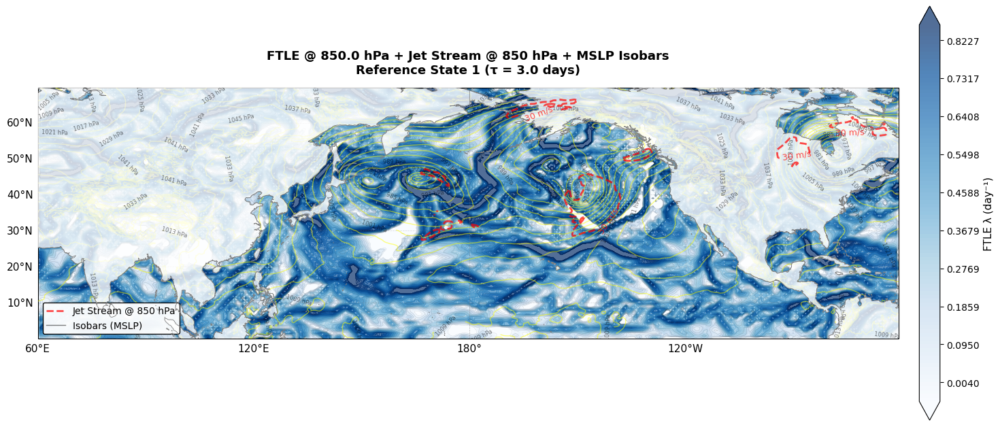

In [28]:
print("=" * 80)
print("🌊 Plotting FTLE with Jet Stream & Pressure Contours")
print("=" * 80)

# ========== CONFIGURATION ==========
reference_timestep = 1  # Reference state 1
jet_pressure_hpa = 850  # Jet stream level

print(f"\n⚙️  Configuration:")
print(f"  FTLE pressure level: {pressure_level} hPa")
print(f"  Jet stream level: {jet_pressure_hpa} hPa")
print(f"  Reference timestep: {reference_timestep}")
print()

# ========== EXTRACT JET STREAM DATA ==========
print("📊 Extracting jet stream data...")

pressure_levels_hpa = np.array(batch_custom.metadata.atmos_levels)
jet_level_idx = np.argmin(np.abs(pressure_levels_hpa - jet_pressure_hpa))
actual_jet_pressure = pressure_levels_hpa[jet_level_idx]

print(f"  Jet stream level: {actual_jet_pressure:.0f} hPa (index {jet_level_idx})")

u_jet = batch_custom.atmos_vars["u"][0].cpu().numpy()[reference_timestep, jet_level_idx, :, :]
v_jet = batch_custom.atmos_vars["v"][0].cpu().numpy()[reference_timestep, jet_level_idx, :, :]
wind_speed_jet = np.sqrt(u_jet**2 + v_jet**2)

print(f"  Wind speed range: {wind_speed_jet.min():.1f} - {wind_speed_jet.max():.1f} m/s")

# ========== EXTRACT PRESSURE DATA ==========
print("📊 Extracting mean sea level pressure...")

# Extract MSLP from surface variables
if "msl" in batch_custom.surf_vars:
  mslp_full = batch_custom.surf_vars["msl"][0].cpu().numpy()
  if mslp_full.ndim == 3:  # [time, lat, lon]
      mslp_full = mslp_full[reference_timestep]
  print(f"  Found 'msl' variable")
elif "sp" in batch_custom.surf_vars:
  mslp_full = batch_custom.surf_vars["sp"][0].cpu().numpy()
  if mslp_full.ndim == 3:
      mslp_full = mslp_full[reference_timestep]
  print(f"  Found 'sp' variable")
else:
  print(f"  ⚠️  Available: {list(batch_custom.surf_vars.keys())}")
  raise ValueError("Could not find pressure variable")

# Convert to hPa if in Pa
if mslp_full.max() > 10000:
  mslp_full = mslp_full / 100
  print(f"  Converted from Pa to hPa")

print(f"  MSLP range: {mslp_full.min():.1f} - {mslp_full.max():.1f} hPa")
print()

# ========== CROP TO FTLE EXTENT ==========
print("🗺️  Cropping data to FTLE extent...")

lats_full = batch_custom.metadata.lat.cpu().numpy()
lons_full = batch_custom.metadata.lon.cpu().numpy()

lat_min_ftle = lats_grid.min()
lat_max_ftle = lats_grid.max()
lon_min_ftle = lons_grid.min()
lon_max_ftle = lons_grid.max()

lat_mask = (lats_full >= lat_min_ftle) & (lats_full <= lat_max_ftle)
lon_mask = (lons_full >= lon_min_ftle) & (lons_full <= lon_max_ftle)

# Crop all data
wind_speed_jet_cropped = wind_speed_jet[lat_mask, :][:, lon_mask]
mslp_cropped = mslp_full[lat_mask, :][:, lon_mask]
lats_cropped = lats_full[lat_mask]
lons_cropped = lons_full[lon_mask]
LON_cropped, LAT_cropped = np.meshgrid(lons_cropped, lats_cropped)

print(f"  Cropped shapes: {mslp_cropped.shape}")
print()

# ========== CREATE FIGURE ==========
print("🎨 Creating visualization...")

fig, ax = plt.subplots(figsize=(16, 9),
                     subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})

# ========== LAYER 1: FTLE FIELD ==========
print("  Plotting FTLE field...")

cmap = cm.get_cmap('Blues')
vmin = np.percentile(ftle_field, 5)
vmax = np.percentile(ftle_field, 95)

levels_ftle = np.linspace(vmin, vmax, 100)
cf = ax.contourf(lons_grid, lats_grid, ftle_field,
              levels=levels_ftle, cmap=cmap,
              vmin=vmin, vmax=vmax, extend='both',
              alpha=0.7,
              transform=ccrs.PlateCarree(), zorder=1)

contour_levels_ftle = np.linspace(vmin, vmax, 15)
ax.contour(lons_grid, lats_grid, ftle_field,
        levels=contour_levels_ftle, colors='black',
        linewidths=0.3, alpha=0.2,
        transform=ccrs.PlateCarree(), zorder=2)

# ========== LAYER 2: PRESSURE CONTOURS (ISOBARS) ==========
print("  Plotting pressure contours...")

# Main isobars every 4 hPa
pressure_levels_main = np.arange(
  int(mslp_cropped.min()) - 100,
  int(mslp_cropped.max()) + 100,
  4
)

CS_pressure = ax.contour(LON_cropped, LAT_cropped, mslp_cropped,
                       levels=pressure_levels_main,
                       colors='yellow',
                       linewidths=1.0,
                       alpha=0.5,
                       linestyles='-',
                       transform=ccrs.PlateCarree(),
                       zorder=3)

# Add labels to pressure contours
ax.clabel(CS_pressure, inline=True, fontsize=6, fmt='%d hPa',
       inline_spacing=15, colors='black')

# ========== LAYER 3: JET STREAM ==========
print("  Plotting jet stream...")

jet_levels = [30, 80]
CS_jet = ax.contour(LON_cropped, LAT_cropped, wind_speed_jet_cropped,
                 levels=jet_levels,
                 colors='red',
                 linewidths=2.0,
                 linestyles='--',
                 alpha=0.7,
                 transform=ccrs.PlateCarree(),
                 zorder=5)

ax.clabel(CS_jet, inline=True, fontsize=9, fmt='%d m/s',
       inline_spacing=10, colors='red')

# ========== LAYER 4: MAP FEATURES ==========
ax.add_feature(cfeature.LAND, facecolor='white', edgecolor='gray',
            linewidth=0.5, zorder=4, alpha=0.8)
ax.coastlines(resolution='50m', linewidth=0.6, color='gray', zorder=6)

gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray',
               alpha=0.3, linestyle='--', zorder=7)
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 11}
gl.ylabel_style = {'size': 11}

# ========== TITLE AND LEGEND ==========
ax.set_title(f'FTLE @ {pressure_level} hPa + Jet Stream @ {actual_jet_pressure:.0f} hPa + MSLP Isobars\n' +
          f'Reference State {reference_timestep} (τ = {tau_hours/24:.1f} days)',
          fontsize=13, fontweight='bold', pad=15)

# FTLE colorbar
cbar = plt.colorbar(cf, ax=ax, orientation='vertical', pad=0.02, shrink=0.7)
cbar.set_label('FTLE λ (day⁻¹)', fontsize=11)

# Legend
legend_elements = [
  Line2D([0], [0], color='red', linewidth=2, linestyle='--', alpha=0.7,
         label=f'Jet Stream @ {actual_jet_pressure:.0f} hPa'),
  Line2D([0], [0], color='black', linewidth=1.0, alpha=0.5,
         label='Isobars (MSLP)'),
]
ax.legend(handles=legend_elements, loc='lower left', fontsize=10,
       framealpha=0.95, edgecolor='black')

plt.tight_layout()
plt.savefig('/scratch/moyanliu/Aurora Model/Perturbation/ftle_jetstream_pressure.png',
         dpi=300, bbox_inches='tight', facecolor='white')

print()
print("=" * 80)
print("✅ Visualization Complete!")
print("=" * 80)
print(f"\n📂 Saved: ftle_jetstream_pressure.png")
print(f"📊 Layers: FTLE + Jet Stream (red dashed) + Pressure Isobars (black)")
print("=" * 80)

plt.show()

/tmp/ipykernel_4158499/3168816077.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('Blues')  # Blues: white (low) to dark blue (high)


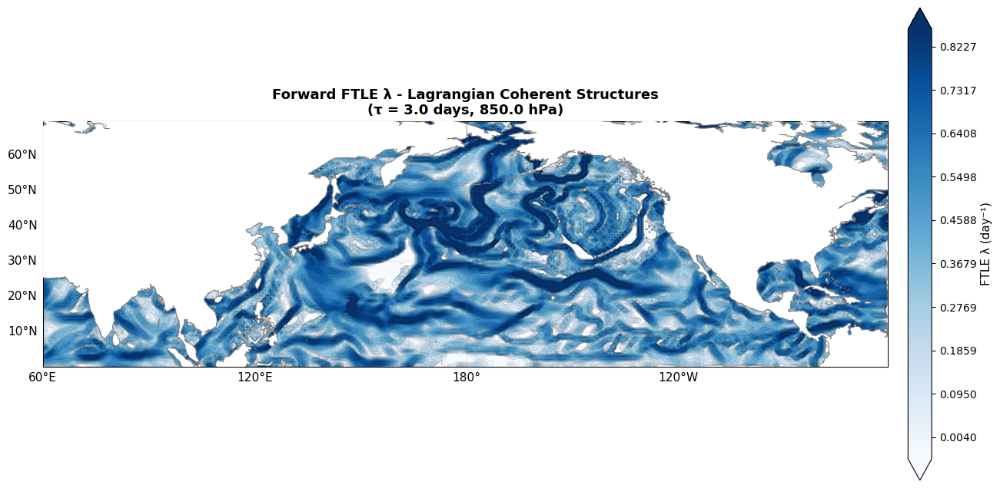

✅ Figure 1(a) style visualization created


In [67]:
# # Use finer contour levels for filamentary structure
# fig, ax = plt.subplots(figsize=(14, 8), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})

# # Create custom colormap: white (low) to dark blue (high)
# cmap = cm.get_cmap('Blues')  # Blues: white (low) to dark blue (high)

# # Normalize FTLE values for better contrast
# vmin = np.percentile(ftle_field, 5)  # Clip lower 5%
# vmax = np.percentile(ftle_field, 95)  # Clip upper 5%

# # Create filled contours with many levels for smooth filamentary structure
# levels = np.linspace(vmin, vmax, 100)
# cf = ax.contourf(lons_grid, lats_grid, ftle_field,
#                levels=levels, cmap=cmap,
#                vmin=vmin, vmax=vmax, extend='both',
#                transform=ccrs.PlateCarree())

# # Add contour lines for structure emphasis
# contour_levels = np.linspace(vmin, vmax, 15)
# ax.contour(lons_grid, lats_grid, ftle_field,
#          levels=contour_levels, colors='black',
#          linewidths=0.3, alpha=0.3,
#          transform=ccrs.PlateCarree())

# # Add land mask (continents in white/light gray)
# ax.add_feature(cfeature.LAND, facecolor='white', edgecolor='gray', linewidth=0.5, zorder=3)

# # Add coastlines
# ax.coastlines(resolution='50m', linewidth=0.5, color='gray', zorder=4)

# # Add gridlines
# gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.3, linestyle='--')
# gl.top_labels = False
# gl.right_labels = False
# gl.xlabel_style = {'size': 11}
# gl.ylabel_style = {'size': 11}

# # Title
# ax.set_title(f'Forward FTLE λ - Lagrangian Coherent Structures\n(τ = {tau_hours/24:.1f} days, {pressure_level} hPa)',
#            fontsize=13, fontweight='bold')

# # Colorbar
# cbar = plt.colorbar(cf, ax=ax, orientation='vertical', pad=0.02, shrink=0.8)
# cbar.set_label('FTLE λ (day⁻¹)', fontsize=11)

# plt.tight_layout()
# # plt.savefig(data_path / 'ftle_figure1a_style.png', dpi=300, bbox_inches='tight')
# plt.show()

# print("✅ Figure 1(a) style visualization created")

### Select points

In [29]:
# ========== STEP 1: FIND HIGH FTLE POINTS + JET STREAM EDGE ==========
print("🔍 Finding optimal seeding points (High FTLE + Jet Edge)...\n")

# FTLE threshold (top 10%)
ftle_threshold = np.percentile(ftle_field, 90)
print(f"FTLE threshold (90th percentile): {ftle_threshold:.4f}")

# Jet stream edge range
jet_min = 25  # m/s
jet_max = 40  # m/s
jet_optimal = 30  # m/s (center of range)
print(f"Jet stream edge range: {jet_min}-{jet_max} m/s (optimal: {jet_optimal} m/s)")

# Find all points above FTLE threshold
high_ftle_mask = ftle_field >= ftle_threshold

# Create 2D grids if needed
if lons_grid.ndim == 1:
  lon_2d, lat_2d = np.meshgrid(lons_grid, lats_grid)
else:
  lon_2d, lat_2d = lons_grid, lats_grid

# Get jet stream speed at FTLE grid resolution
# Need to interpolate jet stream to FTLE grid
from scipy.interpolate import RegularGridInterpolator

print("\n📊 Interpolating jet stream to FTLE grid...")
interp_jet = RegularGridInterpolator(
  (lats_cropped, lons_cropped),
  wind_speed_jet_cropped,
  method='linear',
  bounds_error=False,
  fill_value=0
)

# Sample jet stream at FTLE grid points
jet_at_ftle = np.zeros_like(ftle_field)
for i in range(ftle_field.shape[0]):
  for j in range(ftle_field.shape[1]):
      lat_point = lat_2d[i, j]
      lon_point = lon_2d[i, j]
      jet_at_ftle[i, j] = interp_jet((lat_point, lon_point))

print(f"  Jet speed at FTLE grid: {jet_at_ftle.min():.1f} - {jet_at_ftle.max():.1f} m/s")

# Jet stream edge mask
jet_edge_mask = (jet_at_ftle >= jet_min) & (jet_at_ftle <= jet_max)

# Geographic filter: Pacific region
lon_mask = (lon_2d >= 120) & (lon_2d <= 240)
lat_mask = (lat_2d >= 10) & (lat_2d <= 55)  # Fixed from 0 to 10

# Combine all masks
combined_mask = high_ftle_mask & jet_edge_mask & lon_mask & lat_mask

# Get coordinates and values
lons_high = lon_2d[combined_mask]
lats_high = lat_2d[combined_mask]
ftle_high = ftle_field[combined_mask]
jet_high = jet_at_ftle[combined_mask]

print(f"\nFound {len(lons_high)} candidate points:")
print(f"  Longitude range: {lons_high.min():.2f}° to {lons_high.max():.2f}°")
print(f"  Latitude range: {lats_high.min():.2f}° to {lats_high.max():.2f}°")
print(f"  FTLE range: {ftle_high.min():.4f} to {ftle_high.max():.4f}")
print(f"  Jet speed range: {jet_high.min():.1f} to {jet_high.max():.1f} m/s")

# ========== STEP 2: CALCULATE COMPOSITE SCORE ==========
print("\n📈 Calculating composite score...")

# Normalize FTLE (0-1 scale, higher is better)
ftle_normalized = (ftle_high - ftle_high.min()) / (ftle_high.max() - ftle_high.min())

# Jet stream proximity score (Gaussian centered at 30 m/s)
# Score is highest at 30 m/s, decreases away from it
jet_score = np.exp(-((jet_high - jet_optimal) / 5)**2)

# Combined score (equal weight, can adjust)
composite_score = ftle_normalized * jet_score

print(f"  Score range: {composite_score.min():.3f} to {composite_score.max():.3f}")

# ========== STEP 3: FILTER BY SEPARATION (avoid clustering) ==========
print("\n🔄 Filtering to avoid clustering...\n")

min_separation = 500  # km

# Sort by composite score (highest first)
sort_idx = np.argsort(composite_score)[::-1]
lons_sorted = lons_high[sort_idx]
lats_sorted = lats_high[sort_idx]
ftle_sorted = ftle_high[sort_idx]
jet_sorted = jet_high[sort_idx]
score_sorted = composite_score[sort_idx]

# Greedy selection: keep points that are far enough apart
selected_points = []

for i in range(len(lons_sorted)):
  if len(selected_points) >= 20:  # Top 20 candidates
      break

  lat_i = lats_sorted[i]
  lon_i = lons_sorted[i]

  # Check distance to already selected points
  too_close = False
  for point in selected_points:
      sel_lat, sel_lon = point['lat'], point['lon']

      # Haversine distance
      R = 6371.0
      lat1_rad = np.deg2rad(lat_i)
      lat2_rad = np.deg2rad(sel_lat)
      lon1_rad = np.deg2rad(lon_i)
      lon2_rad = np.deg2rad(sel_lon)

      dlat = lat2_rad - lat1_rad
      dlon = lon2_rad - lon1_rad

      a = np.sin(dlat/2)**2 + np.cos(lat1_rad) * np.cos(lat2_rad) * np.sin(dlon/2)**2
      c = 2 * np.arcsin(np.sqrt(a))
      distance = R * c

      if distance < min_separation:
          too_close = True
          break

  if not too_close:
      selected_points.append({
          'id': len(selected_points) + 1,
          'lat': lat_i,
          'lon': lon_i,
          'ftle': ftle_sorted[i],
          'jet_speed': jet_sorted[i],
          'score': score_sorted[i]
      })

print(f"✅ Selected {len(selected_points)} candidates with {min_separation} km separation\n")

# Print top candidates
print("=" * 80)
print("📋 Top Seeding Point Candidates")
print("=" * 80)
print(f"{'ID':<4} {'Lat':>7} {'Lon':>7} {'FTLE':>8} {'Jet':>6} {'Score':>7}")
print(f"{'':4} {'[°N]':>7} {'[°E]':>7} {'[1/day]':>8} {'[m/s]':>6} {'':>7}")
print("-" * 80)

for point in selected_points[:10]:  # Show top 10
  print(f"{point['id']:<4d} {point['lat']:>7.2f} {point['lon']:>7.2f} "
        f"{point['ftle']:>8.4f} {point['jet_speed']:>6.1f} {point['score']:>7.3f}")

print("=" * 80)


🔍 Finding optimal seeding points (High FTLE + Jet Edge)...

FTLE threshold (90th percentile): 0.7821
Jet stream edge range: 25-40 m/s (optimal: 30 m/s)

📊 Interpolating jet stream to FTLE grid...
  Jet speed at FTLE grid: 0.0 - 48.0 m/s

Found 54 candidate points:
  Longitude range: 164.25° to 223.50°
  Latitude range: 26.25° to 46.50°
  FTLE range: 0.7830 to 1.1142
  Jet speed range: 25.0 to 39.4 m/s

📈 Calculating composite score...
  Score range: 0.000 to 0.559

🔄 Filtering to avoid clustering...

✅ Selected 10 candidates with 500 km separation

📋 Top Seeding Point Candidates
ID       Lat     Lon     FTLE    Jet   Score
        [°N]    [°E]  [1/day]  [m/s]        
--------------------------------------------------------------------------------
1      41.25  167.25   1.1050   26.3   0.559
2      45.00  172.50   0.9564   32.2   0.434
3      35.25  222.00   0.9029   27.6   0.285
4      27.75  170.25   0.9066   26.2   0.207
5      32.25  216.75   0.8620   33.0   0.166
6      33.75  208.

In [30]:

# ========== STEP 4: VISUALIZE SELECTED POINTS ==========
print("\n🎨 Adding selected points to map...")

# Add to existing figure (ax should be your current plot axis)
# If you need to create new figure, do it here

# Plot all candidates (small dots)
ax.scatter(lons_high, lats_high,
        c=composite_score, cmap='Reds', s=5, alpha=0.3,
        transform=ccrs.PlateCarree(), zorder=8,
        vmin=0, vmax=1, edgecolors='none')

# Plot selected points (large markers)
for point in selected_points:
  # Main marker
  ax.plot(point['lon'], point['lat'], 'r*',
         markersize=15, markeredgecolor='yellow', markeredgewidth=2,
         transform=ccrs.PlateCarree(), zorder=10)

  # ID label
  ax.text(point['lon'], point['lat'] + 1.5, str(point['id']),
         fontsize=10, fontweight='bold', color='red',
         ha='center', va='bottom',
         transform=ccrs.PlateCarree(), zorder=11,
         bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow',
                  edgecolor='red', linewidth=1.5, alpha=0.9))

# Update legend to include seeding points
from matplotlib.lines import Line2D
existing_handles, existing_labels = ax.get_legend_handles_labels()
existing_handles.append(Line2D([0], [0], marker='*', color='w',
                            markerfacecolor='red', markersize=12,
                            markeredgecolor='yellow', markeredgewidth=2,
                            label='Seeding Candidates'))
ax.legend(handles=existing_handles, loc='lower left', fontsize=10,
       framealpha=0.95, edgecolor='black')

plt.savefig('/scratch/moyanliu/Aurora Model/Perturbation/ftle_with_seeding_points.png',
         dpi=300, bbox_inches='tight', facecolor='white')

print("\n✅ Saved: ftle_with_seeding_points.png")
print("=" * 80)



🎨 Adding selected points to map...

✅ Saved: ftle_with_seeding_points.png


<Figure size 640x480 with 0 Axes>

In [69]:
# ========== STEP 1: FIND HIGH FTLE POINTS (PACIFIC: 120-240°E, 10-55°N) ==========
print("🔍 Finding high FTLE points in Pacific region...\n")

# Set threshold (top 5%)
ftle_threshold = np.percentile(ftle_field, 90)
print(f"FTLE threshold (95th percentile): {ftle_threshold:.4f}")

# Find all points above threshold
high_ftle_mask = ftle_field >= ftle_threshold

# Create 2D grids if needed
if lons_grid.ndim == 1:
  lon_2d, lat_2d = np.meshgrid(lons_grid, lats_grid)
else:
  lon_2d, lat_2d = lons_grid, lats_grid

# Filter: 120°E to 120°W (120° to 240°)
lon_mask = (lon_2d >= 120) & (lon_2d <=240)

# Filter: 10°N to 55°N
lat_mask = (lat_2d >= 0) & (lat_2d <= 55)

# Combine all masks
combined_mask = high_ftle_mask & lon_mask & lat_mask

# Get coordinates of filtered high points
lons_high = lon_2d[combined_mask]
lats_high = lat_2d[combined_mask]
ftle_high = ftle_field[combined_mask]

print(f"Found {len(lons_high)} points in region (120-240°E, 10-55°N)")
print(f"Longitude range: {lons_high.min():.2f}° to {lons_high.max():.2f}°")
print(f"Latitude range: {lats_high.min():.2f}° to {lats_high.max():.2f}°")

🔍 Finding high FTLE points in Pacific region...

FTLE threshold (95th percentile): 0.7821
Found 902 points in region (120-240°E, 10-55°N)
Longitude range: 120.00° to 199.50°
Latitude range: 0.00° to 54.75°


In [71]:
# ========== STEP 2: FILTER BY SEPARATION (avoid clustering) ==========
print("\n🔄 Filtering to avoid clustering...\n")

min_separation = 500  # km

# Sort by FTLE (highest first)
sort_idx = np.argsort(ftle_high)[::-1]
lons_sorted = lons_high[sort_idx]
lats_sorted = lats_high[sort_idx]
ftle_sorted = ftle_high[sort_idx]

# Greedy selection: keep points that are far enough apart
selected_lons = []
selected_lats = []
selected_ftle = []

for i in range(len(lons_sorted)):
  if len(selected_lons) >= 20:  # Get ~30 candidates
      break

  lat_i = lats_sorted[i]
  lon_i = lons_sorted[i]

  # Check distance to already selected points
  too_close = False
  for sel_lat, sel_lon in zip(selected_lats, selected_lons):
      # Simple haversine distance
      R = 6371.0
      lat1_rad = np.deg2rad(lat_i)
      lat2_rad = np.deg2rad(sel_lat)
      lon1_rad = np.deg2rad(lon_i)
      lon2_rad = np.deg2rad(sel_lon)

      dlat = lat2_rad - lat1_rad
      dlon = lon2_rad - lon1_rad

      a = np.sin(dlat/2)**2 + np.cos(lat1_rad) * np.cos(lat2_rad) * np.sin(dlon/2)**2
      c = 2 * np.arcsin(np.sqrt(a))
      distance = R * c

      if distance < min_separation:
          too_close = True
          break

  if not too_close:
      selected_lons.append(lon_i)
      selected_lats.append(lat_i)
      selected_ftle.append(ftle_sorted[i])

print(f"Selected {len(selected_lons)} candidates with {min_separation} km separation")


🔄 Filtering to avoid clustering...

Selected 20 candidates with 500 km separation



📊 Showing candidates on map...



/tmp/ipykernel_4158499/3406931649.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('Blues')


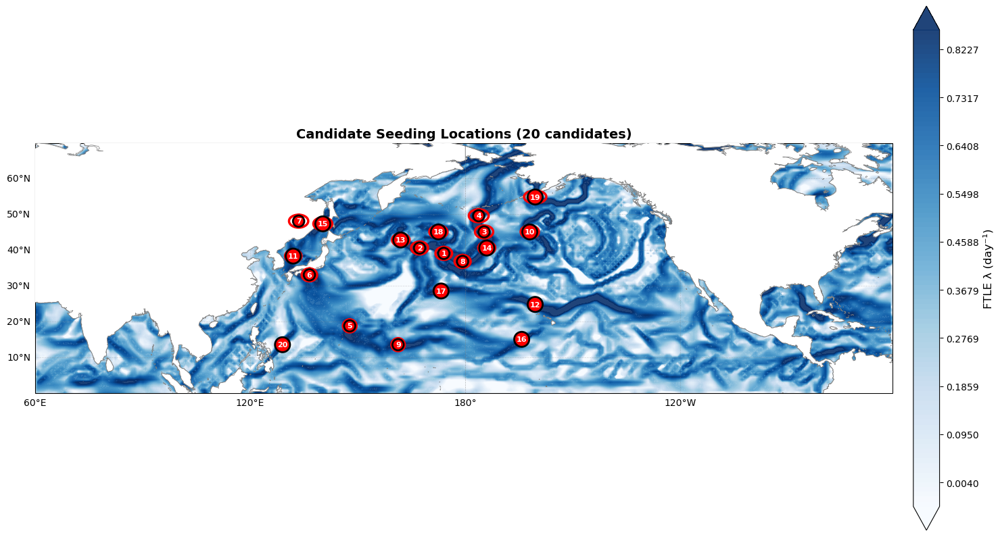


CANDIDATE LIST:
[ 1]  Lat:  39.00°  Lon:  174.00°  FTLE: 1.2615
[ 2]  Lat:  40.50°  Lon:  167.25°  FTLE: 1.1672
[ 3]  Lat:  45.00°  Lon:  185.25°  FTLE: 1.1431
[ 4]  Lat:  49.50°  Lon:  183.75°  FTLE: 1.0816
[ 5]  Lat:  18.75°  Lon:  147.75°  FTLE: 1.0733
[ 6]  Lat:  33.00°  Lon:  136.50°  FTLE: 1.0670
[ 7]  Lat:  48.00°  Lon:  133.50°  FTLE: 1.0530
[ 8]  Lat:  36.75°  Lon:  179.25°  FTLE: 1.0244
[ 9]  Lat:  13.50°  Lon:  161.25°  FTLE: 1.0090
[10]  Lat:  45.00°  Lon:  198.00°  FTLE: 0.9978
[11]  Lat:  38.25°  Lon:  132.00°  FTLE: 0.9976
[12]  Lat:  24.75°  Lon:  199.50°  FTLE: 0.9935
[13]  Lat:  42.75°  Lon:  162.00°  FTLE: 0.9932
[14]  Lat:  40.50°  Lon:  186.00°  FTLE: 0.9723
[15]  Lat:  47.25°  Lon:  140.25°  FTLE: 0.9698
[16]  Lat:  15.00°  Lon:  195.75°  FTLE: 0.9666
[17]  Lat:  28.50°  Lon:  173.25°  FTLE: 0.9580
[18]  Lat:  45.00°  Lon:  172.50°  FTLE: 0.9564
[19]  Lat:  54.75°  Lon:  199.50°  FTLE: 0.9546
[20]  Lat:  13.50°  Lon:  129.00°  FTLE: 0.9533


In [74]:
# ========== STEP 3: VISUALIZE CANDIDATES ==========
print("\n📊 Showing candidates on map...\n")

fig, ax = plt.subplots(figsize=(16, 10),
                    subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})

# FTLE background
cmap = cm.get_cmap('Blues')
vmin = np.percentile(ftle_field, 5)
vmax = np.percentile(ftle_field, 95)
levels = np.linspace(vmin, vmax, 100)

if lon_2d.ndim == 1:
  lon_plot, lat_plot = np.meshgrid(lon_2d, lat_2d)
else:
  lon_plot, lat_plot = lon_2d, lat_2d

cf = ax.contourf(lon_plot, lat_plot, ftle_field,
              levels=levels, cmap=cmap, vmin=vmin, vmax=vmax,
              extend='both', transform=ccrs.PlateCarree(), alpha=0.9)

# Add map features
ax.add_feature(cfeature.LAND, facecolor='white', edgecolor='gray', linewidth=0.5, zorder=3)
ax.coastlines(resolution='50m', linewidth=0.5, color='gray', zorder=4)

# Plot candidates with numbers
g = Geodesic()
radius_km = 200

for i in range(len(selected_lons)):
  lon = selected_lons[i]
  lat = selected_lats[i]

  # Draw circle
  poly = g.circle(lon=lon, lat=lat, radius=radius_km*1000, n_samples=180)
  xs, ys = zip(*poly)
  ax.plot(xs, ys, transform=ccrs.Geodetic(),
         color='red', linewidth=2.5, zorder=10)

  # Center point
  ax.plot(lon, lat, 'ro', markersize=5,
         markeredgecolor='black', markeredgewidth=1.5,
         transform=ccrs.PlateCarree(), zorder=11)

  # Number label
  ax.text(lon, lat, f'{i+1}',
         fontsize=8, fontweight='bold', color='white',
         ha='center', va='center',
         transform=ccrs.PlateCarree(), zorder=12,
         bbox=dict(boxstyle='circle,pad=0.3', facecolor='red',
                  edgecolor='black', linewidth=2))

# Gridlines
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.3, linestyle='--')
gl.top_labels = False
gl.right_labels = False

ax.set_title(f'Candidate Seeding Locations ({len(selected_lons)} candidates)',
          fontsize=14, fontweight='bold')

cbar = plt.colorbar(cf, ax=ax, orientation='vertical', pad=0.02, shrink=0.8)
cbar.set_label('FTLE λ (day⁻¹)', fontsize=12)

plt.tight_layout()
plt.show()

# Print list
print("\n" + "="*70)
print("CANDIDATE LIST:")
print("="*70)
for i in range(len(selected_lons)):
  print(f"[{i+1:2d}]  Lat: {selected_lats[i]:6.2f}°  Lon: {selected_lons[i]:7.2f}°  FTLE: {selected_ftle[i]:.4f}")
print("="*70)

In [108]:
# ========== STEP 4: PICK YOUR 10 ==========
# Look at the map above and choose which numbers you want

# Example: pick candidates 1, 2, 3, 4, 5, 6, 7, 9, 11, 12, 14, 16, 17, 19, 20
pick_these = [5,17,12]  # ← EDIT THIS
# pick_these = list(range(1, 21))

# Convert to seeding_locations format
seeding_locations = []
for idx in pick_these:
  i = idx - 1  # Convert to 0-based index
  seeding_locations.append({
      'lat_center': float(selected_lats[i]),
      'lon_center': float(selected_lons[i]),
      'radius_km': 250.0
  })
print(f"\n✅ Created {len(seeding_locations)} seeding locations:")
for i, loc in enumerate(seeding_locations, 1):
  print(f"{{'lat_center': {loc['lat_center']:.2f}, 'lon_center': {loc['lon_center']:.2f}, 'radius_km': {loc['radius_km']:.0f},}},")


✅ Created 3 seeding locations:
{'lat_center': 18.75, 'lon_center': 147.75, 'radius_km': 250,},
{'lat_center': 28.50, 'lon_center': 173.25, 'radius_km': 250,},
{'lat_center': 24.75, 'lon_center': 199.50, 'radius_km': 250,},


## Cloud Seeding 1 point example

In [31]:
def haversine_distance(lat1, lon1, lat2, lon2):
  """
  Calculate great-circle distance between points on Earth.
  
  Args:
      lat1, lon1: First point (can be scalars or arrays)
      lat2, lon2: Second point (can be scalars or arrays)
      All in degrees
  
  Returns:
      distance in kilometers
  """
  R = 6371.0  # Earth radius in km

  # Convert to radians
  lat1_rad = np.deg2rad(lat1)
  lat2_rad = np.deg2rad(lat2)
  lon1_rad = np.deg2rad(lon1)
  lon2_rad = np.deg2rad(lon2)

  # Haversine formula
  dlat = lat2_rad - lat1_rad
  dlon = lon2_rad - lon1_rad

  a = np.sin(dlat/2)**2 + np.cos(lat1_rad) * np.cos(lat2_rad) * np.sin(dlon/2)**2
  c = 2 * np.arcsin(np.sqrt(a))

  distance = R * c
  return distance


def create_seeding_mask(seeding_locations, lat_grid, lon_grid):
  """
  Create a combined 2D mask from multiple circular seeding regions.
  
  Args:
      seeding_locations: list of dicts with keys:
          - 'lat_center': latitude in degrees
          - 'lon_center': longitude in degrees (0-360 or -180 to 180)
          - 'radius_km': radius in kilometers
      lat_grid: 2D array [lat, lon] or 1D array [lat] (can be torch tensor or numpy)
      lon_grid: 2D array [lat, lon] or 1D array [lon] (can be torch tensor or numpy)
  
  Returns:
      mask: 2D boolean numpy array [lat, lon], True where seeding should occur
  """
  # Convert torch tensors to numpy if needed
  if torch.is_tensor(lat_grid):
      lat_grid = lat_grid.cpu().numpy()
  if torch.is_tensor(lon_grid):
      lon_grid = lon_grid.cpu().numpy()

  # If 1D arrays, create 2D grids
  if lat_grid.ndim == 1 and lon_grid.ndim == 1:
      lon_grid_2d, lat_grid_2d = np.meshgrid(lon_grid, lat_grid)
  else:
      lat_grid_2d = lat_grid
      lon_grid_2d = lon_grid

  # Initialize empty mask
  combined_mask = np.zeros_like(lat_grid_2d, dtype=bool)

  # Loop through each seeding location
  for location in seeding_locations:
      lat_center = location['lat_center']
      lon_center = location['lon_center']
      radius_km = location['radius_km']

      # Calculate distance from this center to all grid points
      distances = haversine_distance(lat_center, lon_center, lat_grid_2d, lon_grid_2d)

      # Create circular mask for this location
      circle_mask = distances <= radius_km

      # Add to combined mask (logical OR - union of all circles)
      combined_mask = combined_mask | circle_mask

  return combined_mask

In [33]:
# Your seeding locations
seeding_locations = [ 
    # {'lat_center': 39.00, 'lon_center': 174.00, 'radius_km': 300,},
    # {'lat_center': 36.75, 'lon_center': 180.00, 'radius_km': 300,},
    # {'lat_center': 37.50, 'lon_center': 177.00, 'radius_km': 200,},
    # {'lat_center': 18.75, 'lon_center': 147.75, 'radius_km': 200,},
    # {'lat_center': 13.50, 'lon_center': 161.25, 'radius_km': 200,},

    {'lat_center': 41.25, 'lon_center': 167.25, 'radius_km': 250,},
    {'lat_center': 45.00, 'lon_center': 172.50, 'radius_km': 250,},
    {'lat_center': 35.25, 'lon_center': 222.00, 'radius_km': 250,},
    {'lat_center': 27.75, 'lon_center': 170.25, 'radius_km': 250,},

]

# Get lat/lon grids from your batch
# Handle both torch tensors and numpy arrays
lat_grid = batch_custom.metadata.lat  # Can be torch tensor on CUDA
lon_grid = batch_custom.metadata.lon  # Can be torch tensor on CUDA

lats_np = batch_custom.metadata.lat.cpu().numpy()
lons_np = batch_custom.metadata.lon.cpu().numpy()

# Create combined mask from all locations
# The function now handles torch tensors automatically
seeding_mask_spatial = create_seeding_mask(
  seeding_locations,
  lat_grid,
  lon_grid
)

print(f"Mask shape: {seeding_mask_spatial.shape}")
print(f"Number of seeded grid cells: {seeding_mask_spatial.sum()}")
print(f"Percentage of domain seeded: {seeding_mask_spatial.sum() / seeding_mask_spatial.size * 100:.2f}%")

Mask shape: (720, 1440)
Number of seeded grid cells: 1274
Percentage of domain seeded: 0.12%


In [34]:
def calculate_q_sat(T, P):
    """
    Saturation specific humidity: how much water vapor air can hold at a given temperature and pressure before it becomes saturated (i.e., before condensation begins).
    Calculate saturation specific humidity using Clausius-Clapeyron relation.
    
    Args:
        T: Temperature [K], tensor of shape [lat, lon] or scalar
        P: Pressure [Pa], scalar or tensor
    
    Returns:
        q_sat: Saturation specific humidity [kg/kg]
    
    Physical basis:
        - Magnus formula for saturation vapor pressure
        - q_sat = ε × e_s / (P - (1-ε) × e_s)
        - ε = 0.622 (ratio of molecular weights)
    """
    # Magnus formula for saturation vapor pressure (hPa)
    T_celsius = T - 273.15
    e_s = 6.112 * torch.exp((17.67 * T_celsius) / (T_celsius + 243.5))  # hPa
    
    # Convert to Pa
    e_s_Pa = e_s * 100
    
    # Saturation specific humidity
    epsilon = 0.622
    q_sat = epsilon * e_s_Pa / (P - 0.378 * e_s_Pa)
    
    return q_sat

print(f"✅ Saturation calculation function defined")

✅ Saturation calculation function defined


In [35]:
# PHYSICALLY CONSISTENT Cloud Seeding Perturbation (CORRECTED)
def apply_physically_consistent_cloud_seeding(batch, seeding_mask_spatial, seeding_params):

  # ========== PHYSICAL CONSTANTS ==========
  L_f = 334000    # J/kg (latent heat of fusion)
  L_v = 2500000   # J/kg (latent heat of vaporization)
  L_d = L_v + L_f # J/kg (latent heat of DEPOSITION - vapor to ice)
  C_p = 1004      # J/(kg·K) (specific heat of air at constant pressure)
  epsilon = 0.622 # R_d / R_v (molecular weight ratio)

  # ========== PARAMETERS ==========
  layer_indices = [batch.metadata.atmos_levels.index(lev)
                   for lev in seeding_params['layers_mb']]
  pressure_levels_hPa = list(batch.metadata.atmos_levels)

  device = batch.atmos_vars["t"].device
  mask_torch = torch.from_numpy(seeding_mask_spatial).float().to(device)

  delta_T_applied = torch.zeros_like(batch.atmos_vars["t"][0, 1])
  delta_q_applied = torch.zeros_like(batch.atmos_vars["q"][0, 1])

  # Tracking for diagnostics
  diagnostics = {
      'levels': [],
      'RH_before': [],
      'RH_after': [],
      'q_frozen_mean': [],
      'q_removed_mean': [],
      'delta_T_mean': [],
      'q_precipitated_mean': [],  # Added for tracking
      'energy_released_mean': [],  # Added for tracking
      'warnings': []
  }

  for level_idx in layer_indices:
      P_hPa = pressure_levels_hPa[level_idx]

      # ========== INITIAL STATE ==========
      T_old = batch.atmos_vars["t"][0, 1, level_idx].clone()
      q_old = batch.atmos_vars["q"][0, 1, level_idx].clone()
      P_Pa = P_hPa * 100  # hPa → Pa

      # Calculate initial saturation state
      q_sat_old = calculate_q_sat(T_old, P_Pa)
      RH_old = (q_old / (q_sat_old + 1e-10)).clamp(max=1.0)

      # ========== SEEDING: ICE NUCLEATION (DEPOSITION) ==========
      # Physical process: Seeding particles provide nucleation sites
      # Water vapor deposits directly onto ice nuclei (vapor → ice)
      # Equation: q_frozen = q × η_freeze × mask
      freeze_efficiency = seeding_params.get('freeze_efficiency', 0.30)
      max_removal_fraction = seeding_params.get('max_removal_fraction', 0.80)
    
      # Calculate potential freezing
      q_frozen_potential = q_old * freeze_efficiency * mask_torch
    
      # Limit to preserve physical moisture levels
      # Physical reasoning: Can't freeze more vapor than exists!
      # Keep at least 20% of vapor to avoid unphysical dry air
      q_frozen = torch.minimum(q_frozen_potential, q_old * max_removal_fraction)
    
      # Track where moisture limitation applied
      moisture_limited = (q_frozen < q_frozen_potential).any()
      if moisture_limited and level_idx == layer_indices[0]:
          # Only warn once (first level)
          pct_limited = ((q_frozen < q_frozen_potential).sum() /
                         (mask_torch > 0).sum() * 100).item()
          diagnostics['warnings'].append(
              f"ℹ️  {pct_limited:.1f}% of seeded cells were moisture-limited "
              f"(too dry for full {freeze_efficiency*100:.0f}% efficiency)"
          )
      # ========== LATENT HEAT RELEASE ==========
      # CRITICAL: Vapor → ice is DEPOSITION, not freezing!
      # - Freezing (liquid → ice): releases L_f = 0.334 MJ/kg
      # - Deposition (vapor → ice): releases L_v + L_f = 2.834 MJ/kg
      # 
      # Physical reason: 
      # 1. Vapor → liquid would release L_v
      # 2. Liquid → ice would release L_f
      # 3. Vapor → ice releases BOTH: L_v + L_f
      #
      # Equation: ΔE = (L_v + L_f) × q_frozen
      delta_E = L_d * q_frozen  # J/kg (energy released to air)
      delta_T = delta_E / C_p   # K (temperature increase)

      # ========== MOISTURE REMOVAL ==========
      # ALL frozen vapor leaves the vapor phase
      # This is correct regardless of what happens next:
      # - Some ice may precipitate out (removed from column)
      # - Some ice may stay suspended (still not vapor)
      # - Either way, it's not counted in Aurora's "q" (vapor mixing ratio)
      #
      # Note: fallout_fraction determines precipitation amount,
      # but doesn't affect energy/temperature at THIS level
      # (the heat was already released when ice formed)
      q_removed = q_frozen  # kg/kg

      # Track precipitation for diagnostics
      fallout_fraction = seeding_params.get('fallout_fraction', 0.40)
      q_precip = q_frozen * fallout_fraction  # Amount that falls out

      # ========== APPLY CHANGES ==========
      T_new = T_old + delta_T  # Temperature INCREASES (warming from deposition)
      q_new = q_old - q_removed  # Humidity decreases

      # ========== THERMODYNAMIC CONSISTENCY CHECK ==========
      # Recalculate saturation mixing ratio at new temperature
      # Equation: q_sat = f(T_new, P)
      q_sat_new = calculate_q_sat(T_new, P_Pa)
      RH_new = q_new / (q_sat_new + 1e-10)

      # Check for unphysical states
      if (q_new < 0).any():
          min_q = q_new.min().item()
          diagnostics['warnings'].append(
              f"⚠️  Level {P_hPa:.0f} hPa: Negative q detected! Min q = {min_q:.6f} kg/kg"
          )
          # Physical interpretation: tried to freeze more vapor than available
          # Clip to zero and recalculate delta_T based on actual freezing
          q_new = q_new.clamp(min=0)
          q_removed_actual = q_old - q_new
          q_frozen_actual = q_removed_actual
          delta_T = L_d * q_frozen_actual / C_p
          T_new = T_old + delta_T
          q_sat_new = calculate_q_sat(T_new, P_Pa)
          RH_new = q_new / (q_sat_new + 1e-10)

      if (RH_new > 1.5).any():
          max_rh = RH_new.max().item()
          diagnostics['warnings'].append(
              f"⚠️  Level {P_hPa:.0f} hPa: High supersaturation! Max RH = {max_rh*100:.1f}%"
          )
          # Note: This shouldn't happen with warming, but check anyway

      if (RH_new < 0.01).any() and (RH_old.mean() > 0.1):
          min_rh = RH_new.min().item()
          diagnostics['warnings'].append(
              f"⚠️  Level {P_hPa:.0f} hPa: Created very dry air! Min RH = {min_rh*100:.1f}%"
          )

      # Additional check: Warming should partially offset RH decrease
      RH_change_ratio = (RH_new.mean() / (RH_old.mean() + 1e-10)).item()
      if RH_change_ratio < 0.2:
          diagnostics['warnings'].append(
              f"⚠️  Level {P_hPa:.0f} hPa: RH dropped to {RH_change_ratio*100:.1f}% of original. "
              f"Consider reducing freeze_efficiency."
          )

      # ========== COMMIT CHANGES (ONLY timestep 1) ==========
      batch.atmos_vars["t"][0, 1, level_idx] = T_new
      batch.atmos_vars["q"][0, 1, level_idx] = q_new

      delta_T_applied[level_idx] = delta_T
      delta_q_applied[level_idx] = -q_removed

      # ========== STORE DIAGNOSTICS ==========
      seeded_region = mask_torch > 0
      diagnostics['levels'].append(P_hPa)
      diagnostics['RH_before'].append(RH_old[seeded_region].mean().item())
      diagnostics['RH_after'].append(RH_new[seeded_region].mean().item())
      diagnostics['q_frozen_mean'].append(q_frozen[seeded_region].mean().item())
      diagnostics['q_removed_mean'].append(q_removed[seeded_region].mean().item())
      diagnostics['delta_T_mean'].append(delta_T[seeded_region].mean().item())
      diagnostics['q_precipitated_mean'].append(q_precip[seeded_region].mean().item())
      diagnostics['energy_released_mean'].append(delta_E[seeded_region].mean().item())
      # ========== VERTICAL COUPLING ==========
      # Warming in seeded level can affect adjacent levels through:
      # - Convective adjustment
      # - Radiative transfer
      # - Turbulent mixing
      if seeding_params.get('vertical_coupling', True):
          coupling_factor = seeding_params.get('coupling_factor', 0.3)
          for offset in [-1, 1]:
              adj_idx = level_idx + offset
              if 0 <= adj_idx < len(batch.metadata.atmos_levels):
                  delta_T_adj = delta_T * coupling_factor
                  batch.atmos_vars["t"][0, 1, adj_idx] += delta_T_adj  # Only timestep 1
                  delta_T_applied[adj_idx] += delta_T_adj

  return delta_T_applied, delta_q_applied, diagnostics

In [36]:
# ============= UPDATED SEEDING CONFIGURATION =============
# : 50, 100, 150, 200, 250, 300, 400, 500, 600, 700, 850, 925, and 1000 hPa
seeding_params_realistic = {
    'layers_mb': [850.0, 700.0,600,500],
    'freeze_efficiency': 0.70,           # 30% of moisture freezes
    'fallout_fraction': 0.90,            # 70% of frozen water precipitates out
    'energy_method': 'net_realistic',    # Proper energy balance
    'vertical_coupling': False,
    'coupling_factor': 0.3,
    'max_removal_fraction':0.6
}
# seeding_params_upstream = {
#     'layers_mb': [925.0, 850.0],      # Low-level moisture source
#     'freeze_efficiency': 0.70,         # High efficiency to maximize precip
#     'fallout_fraction': 0.90,          # High fallout (remove moisture)
#     'energy_method': 'net_realistic',
#     'vertical_coupling': True,
#     'coupling_factor': 0.3,            # Moderate coupling
#     'max_removal_fraction': 0.60       # Remove 60% of available moisture
# }
# Create perturbed batch (clone original to preserve control)
batch_control = batch_custom
batch_seeded = Batch(
  surf_vars={k: v.clone() for k, v in batch_custom.surf_vars.items()},
  atmos_vars={k: v.clone() for k, v in batch_custom.atmos_vars.items()},
  static_vars={k: v.clone() for k, v in batch_custom.static_vars.items()},
  metadata=batch_custom.metadata
).to("cuda")

# Apply PHYSICALLY CONSISTENT seeding perturbation
delta_T_field, delta_q_field, diagnostics = apply_physically_consistent_cloud_seeding(
  batch_seeded,
  seeding_mask_spatial,
  seeding_params_realistic
)

In [37]:
# ========== ENHANCED REPORTING WITH CORRECT PHYSICS ==========
print("\n" + "=" * 75)
print("☁️ PHYSICALLY CONSISTENT Cloud Seeding Applied")
print("=" * 75)

print("\n📋 PHYSICAL PROCESS (DEPOSITION):")
print("   When vapor deposits onto ice nuclei, it releases latent heat:")
print()
print("   1. Ice nucleation:     q_frozen = q × η_freeze × mask")
print("   2. Latent heat:        ΔE = (L_v + L_f) × q_frozen")
print("                          ΔE = 2.834 MJ/kg × q_frozen")
print("   3. Temperature:        ΔT = ΔE / C_p  [WARMING]")
print("   4. Moisture removal:   q_new = q_old - q_frozen")
print("   5. Precipitation:      q_precip = q_frozen × η_fallout")
print("   6. RH check:           RH = q_new / q_sat(T_new, P)")
print()
print("   Note: Heat released during deposition stays in the air,")
print("         even when ice precipitates out!")
print("=" * 75)

print("\n📊 DETAILED RESULTS BY PRESSURE LEVEL:")
print("-" * 75)

# Calculate constants for diagnostics
L_f = 334000
L_v = 2500000
L_d = L_v + L_f
C_p = 1004

total_energy_released = 0
total_mass_frozen = 0
total_mass_precipitated = 0

for i, level_hPa in enumerate(diagnostics['levels']):
  q_frozen = diagnostics['q_frozen_mean'][i]
  q_removed = diagnostics['q_removed_mean'][i]
  q_precip = diagnostics.get('q_precipitated_mean', [q_frozen * seeding_params_realistic['fallout_fraction']])[i]
  delta_T = diagnostics['delta_T_mean'][i]
  energy_released = diagnostics.get('energy_released_mean', [L_d * q_frozen])[i]

  RH_before = diagnostics['RH_before'][i]
  RH_after = diagnostics['RH_after'][i]
  delta_RH = RH_after - RH_before

  # Accumulate totals
  total_energy_released += energy_released
  total_mass_frozen += q_frozen
  total_mass_precipitated += q_precip

  print(f"\n🌡️  Level: {level_hPa:.0f} hPa")
  print(f"   ├─ Moisture Changes:")
  print(f"   │  ├─ q frozen:        {q_frozen*1000:6.3f} g/kg")
  print(f"   │  ├─ q removed:       {q_removed*1000:6.3f} g/kg  (leaves vapor phase)")
  print(f"   │  └─ q precipitated:  {q_precip*1000:6.3f} g/kg  (falls out)")
  print(f"   │")
  print(f"   ├─ Thermodynamic Response:")
  print(f"   │  ├─ Energy released: {energy_released:7.1f} J/kg  (deposition)")
  print(f"   │  ├─ ΔT:              {delta_T:+6.3f} K  [WARMING]")
  print(f"   │  └─ ΔT mechanism:    Vapor→ice releases {L_d/1e6:.3f} MJ/kg")
  print(f"   │")
  print(f"   └─ Relative Humidity:")
  print(f"      ├─ Before:         {RH_before*100:5.1f}%")
  print(f"      ├─ After:          {RH_after*100:5.1f}%")
  print(f"      └─ Change:         {delta_RH*100:+5.1f}%")

  # Physical interpretation for this level
  if delta_RH < 0:
      print(f"      → RH decreased (moisture removal > warming effect)")
  else:
      print(f"      → RH increased (warming effect > moisture removal)")

print("\n" + "-" * 75)

print(f"\n📈 COLUMN-INTEGRATED TOTALS:")
print(f"   Total energy released:    {total_energy_released:.1f} J/kg")
print(f"   Total vapor frozen:       {total_mass_frozen*1000:.3f} g/kg")
print(f"   Total precipitation:      {total_mass_precipitated*1000:.3f} g/kg")
print(f"   Retention fraction:       {(1 - total_mass_precipitated/(total_mass_frozen+1e-10))*100:.1f}%")

print(f"\n⚙️  SEEDING PARAMETERS:")
print(f"   Freeze efficiency (η_freeze): {seeding_params_realistic['freeze_efficiency']*100:5.1f}%")
print(f"   Fallout fraction (η_fallout): {seeding_params_realistic['fallout_fraction']*100:5.1f}%")
print(f"   Vertical coupling factor:     {seeding_params_realistic['coupling_factor']:.2f}")
print(f"   Seeding layers:               {seeding_params_realistic['layers_mb']} hPa")

# Physical constants reference
print(f"\n🔬 PHYSICAL CONSTANTS USED:")
print(f"   L_f (fusion):        {L_f/1000:6.0f} J/g   (liquid → ice)")
print(f"   L_v (vaporization):  {L_v/1000:6.0f} J/g   (vapor → liquid)")
print(f"   L_d (deposition):    {L_d/1000:6.0f} J/g   (vapor → ice) ✓ USED")
print(f"   C_p (specific heat): {C_p:6.0f} J/(kg·K)")
print(f"   Ratio L_d/C_p:       {L_d/C_p/1000:.2f} K per (g/kg)")

# Expected temperature change per g/kg frozen
print(f"\n💡 PHYSICAL INTERPRETATION:")
print(f"   For every 1 g/kg of vapor frozen:")
print(f"   → Temperature increases by {L_d/C_p/1000:.2f} K")  # Divide by 1000!
print(f"   → This warming is INDEPENDENT of precipitation!")
print(f"   → Precipitation only affects WHERE the ice goes,")
print(f"     not the energy released during phase change.")
print(f"")
print(f"   Verification: {diagnostics['q_frozen_mean'][0]*1000:.3f} g/kg frozen")
print(f"                 → ΔT = {diagnostics['q_frozen_mean'][0]*1000:.3f} × {L_d/C_p/1000:.2f}")
print(f"                 → ΔT = {diagnostics['delta_T_mean'][0]:.2f} K ✓")

# Warnings and checks
if diagnostics['warnings']:
  print(f"\n⚠️  WARNINGS:")
  for warn in diagnostics['warnings']:
      print(f"   {warn}")

  # Check if freeze efficiency is too high
  if any('very dry air' in w for w in diagnostics['warnings']):
      print(f"\n   💡 Suggestion: Reduce freeze_efficiency to prevent")
      print(f"      creating unphysically dry air (RH < 1%)")
      suggested_efficiency = seeding_params_realistic['freeze_efficiency'] * 0.5
      print(f"      Try: freeze_efficiency = {suggested_efficiency:.2f}")
else:
  print(f"\n✅ THERMODYNAMIC VALIDATION PASSED:")
  print(f"   ✓ No negative specific humidity")
  print(f"   ✓ No extreme supersaturation (RH < 150%)")
  print(f"   ✓ No unrealistic drying (RH > 1%)")
  print(f"   ✓ Temperature changes physically consistent")

# Summary of expected atmospheric response
print(f"\n🌍 EXPECTED ATMOSPHERIC RESPONSE:")
print(f"   Direct effects (seeded region):")
print(f"   ├─ Temperature:  INCREASES (+{sum(diagnostics['delta_T_mean'])/len(diagnostics['delta_T_mean']):.2f} K avg)")
print(f"   ├─ Humidity:     DECREASES (-{sum([diagnostics['q_removed_mean'][i]*1000 for i in range(len(diagnostics['levels']))])/len(diagnostics['levels']):.2f} g/kg avg)")
print(f"   ├─ RH:           DECREASES (moisture loss dominates)")
print(f"   └─ Precipitation: INCREASES (ice falls out)")
print(f"   ")
print(f"   Indirect effects (downstream):")
print(f"   ├─ Reduced moisture transport → may weaken AR")
print(f"   ├─ Local warming → altered stability")
print(f"   └─ Changed thermal gradient → modified dynamics")

print("\n" + "=" * 75)
print("✅ Perturbed batch ready for Aurora prediction")
print("=" * 75)


☁️ PHYSICALLY CONSISTENT Cloud Seeding Applied

📋 PHYSICAL PROCESS (DEPOSITION):
   When vapor deposits onto ice nuclei, it releases latent heat:

   1. Ice nucleation:     q_frozen = q × η_freeze × mask
   2. Latent heat:        ΔE = (L_v + L_f) × q_frozen
                          ΔE = 2.834 MJ/kg × q_frozen
   3. Temperature:        ΔT = ΔE / C_p  [WARMING]
   4. Moisture removal:   q_new = q_old - q_frozen
   5. Precipitation:      q_precip = q_frozen × η_fallout
   6. RH check:           RH = q_new / q_sat(T_new, P)

   Note: Heat released during deposition stays in the air,
         even when ice precipitates out!

📊 DETAILED RESULTS BY PRESSURE LEVEL:
---------------------------------------------------------------------------

🌡️  Level: 850 hPa
   ├─ Moisture Changes:
   │  ├─ q frozen:         3.648 g/kg
   │  ├─ q removed:        3.648 g/kg  (leaves vapor phase)
   │  └─ q precipitated:   3.284 g/kg  (falls out)
   │
   ├─ Thermodynamic Response:
   │  ├─ Energy released: 10

In [39]:
num_steps = 12

In [40]:
# Run both control and seeded predictions
print("🚀 Running Control and Seeded Predictions...")
print("=" * 60)

# Move model to CUDA if needed
if next(model.parameters()).device.type == 'cpu':
    model = model.to("cuda")

with torch.inference_mode():
    # Control run (original)
    print("1️⃣ Control run (no seeding)...")
    preds_control = [pred.to("cpu") for pred in rollout(model, batch_control, steps=num_steps)]
    print(f"   ✅ Control predictions: {len(preds_control)} steps")
    
    # Seeded run (with perturbation)
    print("2️⃣ Seeded run (with cloud seeding)...")
    preds_seeded = [pred.to("cpu") for pred in rollout(model, batch_seeded, steps=num_steps)]
    print(f"   ✅ Seeded predictions: {len(preds_seeded)} steps")

# Move model back to CPU
model = model.to("cpu")

print("\n✅ Both predictions completed!")
print(f"   Forecast horizon: +{num_steps*6} hours")
print(f"   Time steps: ", [f"+{(i+1)*6}hr" for i in range(num_steps)])

🚀 Running Control and Seeded Predictions...
1️⃣ Control run (no seeding)...
   ✅ Control predictions: 12 steps
2️⃣ Seeded run (with cloud seeding)...
   ✅ Seeded predictions: 12 steps

✅ Both predictions completed!
   Forecast horizon: +72 hours
   Time steps:  ['+6hr', '+12hr', '+18hr', '+24hr', '+30hr', '+36hr', '+42hr', '+48hr', '+54hr', '+60hr', '+66hr', '+72hr']


## Check

### Refernce state

In [19]:
import numpy as np

print("📍 Finding Perturbation Location...")
print("=" * 60)
pressure_levels = batch_control.metadata.atmos_levels
# Extract reference state 1 (where perturbation is)
q_control_ref = batch_control.atmos_vars["q"][0, 1].cpu().numpy()  # [level, lat, lon]
q_seeded_ref = batch_seeded.atmos_vars["q"][0, 1].cpu().numpy()
T_control_ref = batch_control.atmos_vars["t"][0, 1].cpu().numpy()
T_seeded_ref = batch_seeded.atmos_vars["t"][0, 1].cpu().numpy()

# Calculate differences
q_diff = q_seeded_ref - q_control_ref
T_diff = T_seeded_ref - T_control_ref

# Get lat/lon
lats = batch_control.metadata.lat.cpu().numpy()
lons = batch_control.metadata.lon.cpu().numpy()

# Pressure levels (convert to hPa)
pressure_levels_hpa = np.array(pressure_levels) 

print(f"Pressure levels: {pressure_levels_hpa}")
print()

# Find location of max humidity perturbation
level_idx, lat_idx, lon_idx = np.unravel_index(np.abs(q_diff).argmax(), q_diff.shape)

print("🌡️  HUMIDITY PERTURBATION:")
print(f"   Max |Δq|: {np.abs(q_diff).max()*1000:.3f} g/kg")
print(f"   Value:    {q_diff[level_idx, lat_idx, lon_idx]*1000:.3f} g/kg")
print(f"   Pressure: {pressure_levels_hpa[level_idx]:.0f} hPa")
print(f"   Latitude: {lats[lat_idx]:.2f}°")
print(f"   Longitude: {lons[lon_idx]:.2f}°")
print()

# Find location of max temperature perturbation
level_idx_T, lat_idx_T, lon_idx_T = np.unravel_index(np.abs(T_diff).argmax(), T_diff.shape)

print("🔥 TEMPERATURE PERTURBATION:")
print(f"   Max ΔT:   {T_diff.max():.3f} K")
print(f"   Pressure: {pressure_levels_hpa[level_idx_T]:.0f} hPa")
print(f"   Latitude: {lats[lat_idx_T]:.2f}°")
print(f"   Longitude: {lons[lon_idx_T]:.2f}°")
print()

# Check if location is within plot extent [60, 300, 0, 70]
extent = [60, 300, 0, 70]
lon_check = lons[lon_idx]
lat_check = lats[lat_idx]

print("📊 PLOT EXTENT CHECK:")
print(f"   Current extent: [{extent[0]}, {extent[1]}, {extent[2]}, {extent[3]}]")
print(f"   Perturbation at: Lon={lon_check:.2f}°, Lat={lat_check:.2f}°")

within_extent = (extent[0] <= lon_check <= extent[1]) and (extent[2] <= lat_check <= extent[3])
if within_extent:
    print(f"   ✅ Perturbation IS within plot extent!")
else:
    print(f"   ❌ Perturbation is OUTSIDE plot extent!")
    print(f"   💡 Suggested extent: [{lon_check-20:.0f}, {lon_check+20:.0f}, "
          f"{max(0, lat_check-10):.0f}, {lat_check+10:.0f}]")
print()

# Check spatial extent of perturbation
# Find region where |q_diff| > 0.1 g/kg (0.0001 kg/kg)
threshold = 0.0001  # kg/kg
affected_mask = np.abs(q_diff) > threshold
n_affected_points = affected_mask.sum()
total_points = q_diff.size

print("🗺️  SPATIAL EXTENT:")
print(f"   Points affected (|Δq| > 0.1 g/kg): {n_affected_points:,}")
print(f"   Total points: {total_points:,}")
print(f"   Fraction: {n_affected_points/total_points*100:.3f}%")

# Check which levels are affected
for lev_idx in range(len(pressure_levels_hpa)):
    level_affected = (np.abs(q_diff[lev_idx]) > threshold).sum()
    if level_affected > 0:
        max_at_level = np.abs(q_diff[lev_idx]).max() * 1000
        print(f"   Level {pressure_levels_hpa[lev_idx]:4.0f} hPa: "
              f"{level_affected:6,} points, max |Δq|={max_at_level:.2f} g/kg")

print("=" * 60)


📍 Finding Perturbation Location...


NameError: name 'pressure_levels' is not defined

Target pressure: 850 hPa
Selected level index: 2
Actual pressure: 850.0 hPa

Latitude range: [-89.8°, 90.0°]
Longitude range: [0.0°, 359.8°]

Extracting reference states...
Reference state shape: (2, 13, 720, 1440)
Number of reference timesteps: 2

Processing reference timestep 0...
  Flow anomaly range: [0.000000, 0.000000] m/s
  Humidity anomaly range: [0.000000e+00, 0.000000e+00] kg/kg
Processing reference timestep 1...
  Flow anomaly range: [0.000000, 0.000000] m/s
  Humidity anomaly range: [-6.760924e-03, 0.000000e+00] kg/kg


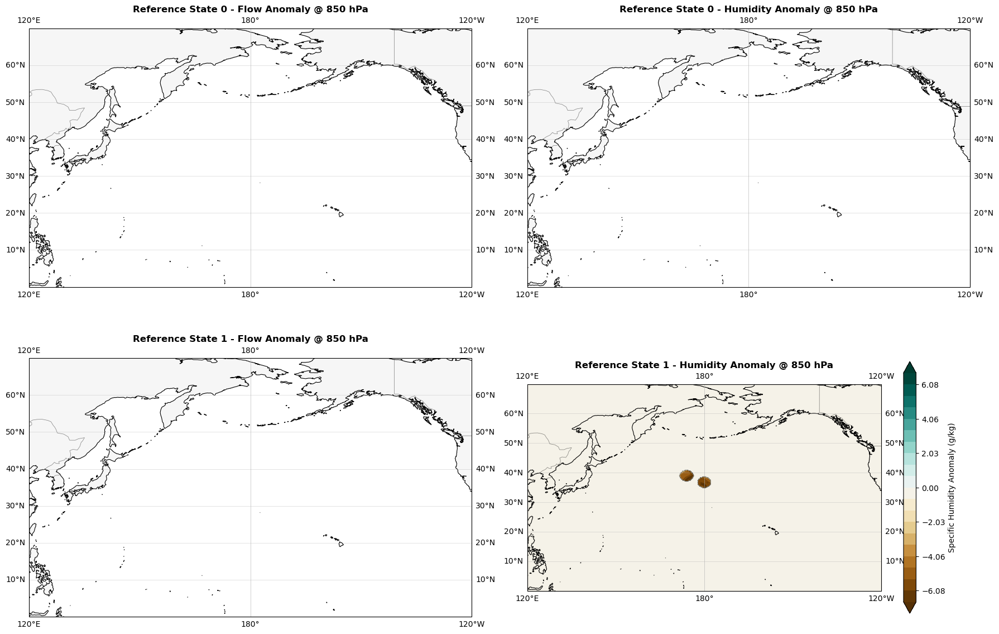

In [171]:
# ========== PRESSURE LEVEL SELECTION ==========
target_pressure_hpa = 850 # Change to desired level

# Find closest pressure level
pressure_levels_hpa = np.array(pressure_levels) 
level_idx = np.argmin(np.abs(pressure_levels_hpa - target_pressure_hpa))
actual_pressure = pressure_levels_hpa[level_idx]

print(f"Target pressure: {target_pressure_hpa} hPa")
print(f"Selected level index: {level_idx}")
print(f"Actual pressure: {actual_pressure:.1f} hPa")
print()

# Extract lat/lon coordinates
lats = batch_control.metadata.lat.cpu().numpy()
lons = batch_control.metadata.lon.cpu().numpy()
# lons_shifted = np.where(lons > 180, lons - 360, lons)

print(f"Latitude range: [{lats.min():.1f}°, {lats.max():.1f}°]")
print(f"Longitude range: [{lons.min():.1f}°, {lons.max():.1f}°]")
print()

# Extract reference states (2 timesteps for Aurora initialization)
print("Extracting reference states...")
u_control_ref = batch_control.atmos_vars["u"][0].cpu().numpy()  # [time, level, lat, lon]
v_control_ref = batch_control.atmos_vars["v"][0].cpu().numpy()
q_control_ref = batch_control.atmos_vars["q"][0].cpu().numpy()

u_seeded_ref = batch_seeded.atmos_vars["u"][0].cpu().numpy()
v_seeded_ref = batch_seeded.atmos_vars["v"][0].cpu().numpy()
q_seeded_ref = batch_seeded.atmos_vars["q"][0].cpu().numpy()

print(f"Reference state shape: {u_control_ref.shape}")
print(f"Number of reference timesteps: {u_control_ref.shape[0]}")
print()

# Create figure with 2x2 layout
projection = ccrs.PlateCarree(central_longitude=180)
fig = plt.figure(figsize=(18, 12))

# Reference timesteps (Aurora uses 2 timesteps)
n_timesteps = u_control_ref.shape[0]

for time_idx in range(n_timesteps):
    row = time_idx
    print(f"Processing reference timestep {time_idx}...")

    # Extract 2D slices at specified pressure level
    # Shape: [time, level, lat, lon] → [lat, lon]
    u_control_2d = u_control_ref[time_idx, level_idx, :, :]
    v_control_2d = v_control_ref[time_idx, level_idx, :, :]
    q_control_2d = q_control_ref[time_idx, level_idx, :, :]

    u_seeded_2d = u_seeded_ref[time_idx, level_idx, :, :]
    v_seeded_2d = v_seeded_ref[time_idx, level_idx, :, :]
    q_seeded_2d = q_seeded_ref[time_idx, level_idx, :, :]

    # Calculate anomalies (SEEDED - CONTROL)
    u_anom = u_seeded_2d - u_control_2d
    v_anom = v_seeded_2d - v_control_2d
    q_anom = q_seeded_2d - q_control_2d

    # Wind speed anomaly magnitude
    wind_speed_anom = np.sqrt(u_anom**2 + v_anom**2)

    print(f"  Flow anomaly range: [{wind_speed_anom.min():.6f}, {wind_speed_anom.max():.6f}] m/s")
    print(f"  Humidity anomaly range: [{q_anom.min():.6e}, {q_anom.max():.6e}] kg/kg")

    # Create meshgrid for plotting
    LON, LAT = np.meshgrid(lons, lats)

    # ========== LEFT: Flow Field Anomaly ==========
    ax_flow = fig.add_subplot(n_timesteps, 2, 2*row + 1, projection=projection)

    # Add map features
    ax_flow.coastlines(resolution='50m', linewidth=0.8)
    ax_flow.add_feature(cfeature.BORDERS, linewidth=0.5, alpha=0.5)
    ax_flow.add_feature(cfeature.LAND, facecolor='lightgray', alpha=0.2)
    ax_flow.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False,
                      linewidth=0.5, alpha=0.5)

    # Plot wind speed anomaly
    vmax_flow = max(abs(wind_speed_anom.min()), abs(wind_speed_anom.max()))
    if vmax_flow > 0:
        levels_flow = np.linspace(-vmax_flow, vmax_flow, 21)
        cf_flow = ax_flow.contourf(LON, LAT, wind_speed_anom, levels=levels_flow,
                                    cmap='RdBu_r', extend='both',
                                    transform=ccrs.PlateCarree())

        # Overlay wind vector anomalies
        skip = max(1, wind_speed_anom.shape[0] // 20)
        ax_flow.quiver(LON[::skip, ::skip], LAT[::skip, ::skip],
                       u_anom[::skip, ::skip], v_anom[::skip, ::skip],
                       transform=ccrs.PlateCarree(),
                       alpha=0.7, scale=200, width=0.003)

        cbar_flow = plt.colorbar(cf_flow, ax=ax_flow, orientation='vertical',
                                 pad=0.05, shrink=0.8)
        cbar_flow.set_label('Wind Speed Anomaly (m/s)', fontsize=10)

    ax_flow.set_title(f'Reference State {time_idx} - Flow Anomaly @ {actual_pressure:.0f} hPa',
                      fontsize=12, fontweight='bold')
    # Zoom to perturbation location: Lon=170.25°, Lat=34.75°
    ax_flow.set_extent([120, 240, 0, 70], crs=ccrs.PlateCarree())

    # ========== RIGHT: Humidity Anomaly ==========
    ax_humid = fig.add_subplot(n_timesteps, 2, 2*row + 2, projection=projection)

    # Add map features
    ax_humid.coastlines(resolution='50m', linewidth=0.8)
    ax_humid.add_feature(cfeature.BORDERS, linewidth=0.5, alpha=0.5)
    ax_humid.add_feature(cfeature.LAND, facecolor='lightgray', alpha=0.2)
    ax_humid.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False,
                       linewidth=0.5, alpha=0.5)

    # Plot humidity anomaly
    vmax_q = max(abs(q_anom.min()), abs(q_anom.max()))
    if vmax_q > 0:
        levels_q = np.linspace(-vmax_q, vmax_q, 21)
        cf_humid = ax_humid.contourf(LON, LAT, q_anom * 1000,  # Convert to g/kg
                                      levels=levels_q * 1000,
                                      cmap='BrBG', extend='both',
                                      transform=ccrs.PlateCarree())

        # Add contour lines
        ax_humid.contour(LON, LAT, q_anom * 1000, levels=10, colors='black',
                         linewidths=0.5, alpha=0.3, transform=ccrs.PlateCarree())

        cbar_humid = plt.colorbar(cf_humid, ax=ax_humid, orientation='vertical',
                                  pad=0.05, shrink=0.8)
        cbar_humid.set_label('Specific Humidity Anomaly (g/kg)', fontsize=10)

    ax_humid.set_title(f'Reference State {time_idx} - Humidity Anomaly @ {actual_pressure:.0f} hPa',
                       fontsize=12, fontweight='bold')
    # Zoom to perturbation location: Lon=170.25°, Lat=34.75°
    ax_humid.set_extent([120, 240, 0, 70], crs=ccrs.PlateCarree())

plt.tight_layout()

plt.show()

In [168]:
"""
Diagnose Seeding Mask Issues
Check if the spatial mask is correct and if perturbation is applied as expected
"""

# import numpy as np
# import matplotlib.pyplot as plt
# import cartopy.crs as ccrs
# import cartopy.feature as cfeature

# # Your seeding locations
# seeding_locations = [
#     {'lat_center': 39.00, 'lon_center': 174.00, 'radius_km': 200,},
#     {'lat_center': 36.75, 'lon_center': 180.00, 'radius_km': 200,},
# ]

# print("\n📍 Seeding locations:")
# for i, loc in enumerate(seeding_locations):
#     print(f"  Location {i+1}: {loc['lat_center']}°N, {loc['lon_center']}°E, radius={loc['radius_km']} km")
# print()

# # Get coordinates
# lats_np = batch_custom.metadata.lat.cpu().numpy()
# lons_np = batch_custom.metadata.lon.cpu().numpy()

# print(f"🌍 Grid information:")
# print(f"  Latitude range: [{lats_np.min():.2f}°, {lats_np.max():.2f}°]")
# print(f"  Longitude range: [{lons_np.min():.2f}°, {lons_np.max():.2f}°]")
# print(f"  Grid shape: {len(lats_np)} x {len(lons_np)}")
# print()

# # Check the seeding mask
# print(f"🎭 Seeding mask diagnostics:")
# print(f"  Mask shape: {seeding_mask_spatial.shape}")
# print(f"  Expected shape: ({len(lats_np)}, {len(lons_np)})")
# print(f"  Mask dtype: {seeding_mask_spatial.dtype}")
# print(f"  Mask device: {seeding_mask_spatial.device if hasattr(seeding_mask_spatial, 'device') else 'numpy'}")
# print(f"  Number of True points: {seeding_mask_spatial.sum()}")
# print(f"  Percentage: {seeding_mask_spatial.sum() / seeding_mask_spatial.size * 100:.4f}%")
# print()

# # Find where the mask is True
# if hasattr(seeding_mask_spatial, 'cpu'):
#     mask_np = seeding_mask_spatial.cpu().numpy()
# else:
#     mask_np = seeding_mask_spatial

# lat_indices, lon_indices = np.where(mask_np)
# if len(lat_indices) > 0:
#     print(f"📊 Mask location statistics:")
#     print(f"  Latitude indices: min={lat_indices.min()}, max={lat_indices.max()}")
#     print(f"  Longitude indices: min={lon_indices.min()}, max={lon_indices.max()}")
#     print(f"  Actual latitudes: min={lats_np[lat_indices].min():.2f}°, max={lats_np[lat_indices].max():.2f}°")
#     print(f"  Actual longitudes: min={lons_np[lon_indices].min():.2f}°, max={lons_np[lon_indices].max():.2f}°")
#     print()

# # Check if mask has weird patterns
# print(f"🔬 Checking for unexpected patterns:")
# # Count True values along each latitude
# mask_per_lat = mask_np.sum(axis=1)  # Sum along longitude
# lats_with_mask = np.where(mask_per_lat > 0)[0]
# print(f"  Latitudes with seeding: {len(lats_with_mask)} rows")
# if len(lats_with_mask) > 0:
#     print(f"  Latitude range with mask: {lats_np[lats_with_mask[0]]:.2f}° to {lats_np[lats_with_mask[-1]]:.2f}°")
#     print(f"  Points per latitude (first 5 rows with mask):")
#     for i in lats_with_mask[:5]:
#         print(f"    Lat {lats_np[i]:6.2f}°: {mask_per_lat[i]:4.0f} points")
# print()

# # Check perturbation in reference states
# print(f"🌡️  Checking perturbation in reference states:")
# print(f"  Reference state shape: {batch_seeded.atmos_vars['q'].shape}")

# # Show pressure levels
# pressure_levels = np.array(batch_custom.metadata.atmos_levels)
# print(f"  Pressure levels: {pressure_levels / 100} hPa")  # Convert Pa to hPa
# print()

# # Extract humidity for both reference timesteps
# q_control = batch_control.atmos_vars["q"][0].cpu().numpy()  # [time, level, lat, lon]
# q_seeded = batch_seeded.atmos_vars["q"][0].cpu().numpy()

# n_ref_timesteps = q_control.shape[0]
# print(f"  Number of reference timesteps: {n_ref_timesteps}")

# for time_idx in range(n_ref_timesteps):
#     q_anom_3d = q_seeded[time_idx] - q_control[time_idx]  # [level, lat, lon]

#     # Check if there's any perturbation at this timestep
#     max_anom = np.abs(q_anom_3d).max()
#     n_perturbed = (np.abs(q_anom_3d) > 1e-10).sum()

#     print(f"\n  Reference timestep {time_idx}:")
#     print(f"    Max |anomaly|: {max_anom:.6e} kg/kg")
#     print(f"    Points with anomaly > 1e-10: {n_perturbed:,}")

#     if max_anom > 1e-10:
#         # Find where perturbation exists
#         perturbed_mask_3d = np.abs(q_anom_3d) > 1e-10

#         for level_idx in range(q_anom_3d.shape[0]):
#             perturbed_mask_2d = perturbed_mask_3d[level_idx]
#             n_perturbed_level = perturbed_mask_2d.sum()

#             if n_perturbed_level > 0:
#                 lat_idx, lon_idx = np.where(perturbed_mask_2d)
#                 pressure_hpa = pressure_levels[level_idx] / 100
#                 print(f"    Level {level_idx} ({pressure_hpa:.0f} hPa): {n_perturbed_level} perturbed points")
#                 print(f"      Lat range: {lats_np[lat_idx].min():.2f}° to {lats_np[lat_idx].max():.2f}°")
#                 print(f"      Lon range: {lons_np[lon_idx].min():.2f}° to {lons_np[lon_idx].max():.2f}°")

# print()

# # ========== VISUALIZE THE MASK ==========
# print("📊 Creating mask visualization...")

# fig = plt.figure(figsize=(20, 8))

# # Panel 1: Seeding mask
# ax1 = plt.subplot(1, 2, 1, projection=ccrs.PlateCarree(central_longitude=180))

# LON, LAT = np.meshgrid(lons_np, lats_np)

# ax1.coastlines(resolution='50m', linewidth=0.8)
# ax1.add_feature(cfeature.BORDERS, linewidth=0.5, alpha=0.5)
# ax1.add_feature(cfeature.LAND, facecolor='lightgray', alpha=0.3)
# ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False,
#               linewidth=0.5, alpha=0.5)

# # Plot mask - USE ORIGINAL 0-360 COORDINATES
# im1 = ax1.pcolormesh(LON, LAT, mask_np.astype(float),
#                      cmap='Reds', vmin=0, vmax=1,
#                      transform=ccrs.PlateCarree(), shading='auto', alpha=0.9)

# # Add contour to make boundaries clear
# ax1.contour(LON, LAT, mask_np.astype(float),
#            levels=[0.5], colors='darkred', linewidths=2,
#            transform=ccrs.PlateCarree())

# # Mark seeding centers - USE ORIGINAL 0-360 COORDINATES
# for loc in seeding_locations:
#     lon_center = loc['lon_center']  # Keep in 0-360 format
#     ax1.plot(lon_center, loc['lat_center'], 'b*',
#              markersize=20, markeredgecolor='white', markeredgewidth=2,
#              transform=ccrs.PlateCarree(), zorder=10)
#     ax1.text(lon_center, loc['lat_center'] + 2,
#              f"({loc['lat_center']}°N, {lon_center}°E)",
#              ha='center', fontsize=10, fontweight='bold',
#              bbox=dict(boxstyle='round', facecolor='white', alpha=0.8),
#              transform=ccrs.PlateCarree(), zorder=11)

# ax1.set_extent([120, 240, 0, 70], crs=ccrs.PlateCarree())
# ax1.set_title('Seeding Mask (Should be circular regions)', fontsize=13, fontweight='bold')
# plt.colorbar(im1, ax=ax1, label='Mask (0=No, 1=Yes)', shrink=0.7)

# # Panel 2: Actual perturbation in reference state 1
# ax2 = plt.subplot(1, 2, 2, projection=ccrs.PlateCarree(central_longitude=180))

# ax2.coastlines(resolution='50m', linewidth=0.8)
# ax2.add_feature(cfeature.BORDERS, linewidth=0.5, alpha=0.5)
# ax2.add_feature(cfeature.LAND, facecolor='lightgray', alpha=0.3)
# ax2.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False,
#               linewidth=0.5, alpha=0.5)

# # Get humidity anomaly at the perturbed levels in reference state 1
# # Use level 2 or 3 where perturbation exists (from diagnostic output above)
# perturbed_level = 2  # Use the first perturbed level found

# if n_ref_timesteps > 1:
#     q_anom_ref1 = q_seeded[1, perturbed_level] - q_control[1, perturbed_level]  # Reference state 1
# else:
#     q_anom_ref1 = q_seeded[0, perturbed_level] - q_control[0, perturbed_level]  # Reference state 0

# print(f"\n🎨 Visualization info:")
# print(f"  Showing level {perturbed_level}")
# print(f"  Anomaly min: {q_anom_ref1.min():.6e} kg/kg = {q_anom_ref1.min()*1000:.6f} g/kg")
# print(f"  Anomaly max: {q_anom_ref1.max():.6e} kg/kg = {q_anom_ref1.max()*1000:.6f} g/kg")
# print()

# vmax = max(abs(q_anom_ref1.min()), abs(q_anom_ref1.max()))
# if vmax > 1e-15:  # Check if there's any meaningful anomaly
#     im2 = ax2.pcolormesh(LON, LAT, q_anom_ref1 * 1000,  # Convert to g/kg, USE ORIGINAL 0-360
#                          cmap='RdBu_r', vmin=-vmax*1000, vmax=vmax*1000,
#                          transform=ccrs.PlateCarree(), shading='auto', alpha=0.8)
#     plt.colorbar(im2, ax=ax2, label=f'Humidity Anomaly (g/kg) at Level {perturbed_level}', shrink=0.7)

#     # Add contours to make it more visible
#     levels = np.linspace(-vmax*1000, vmax*1000, 11)
#     ax2.contour(LON, LAT, q_anom_ref1 * 1000, levels=levels,  # USE ORIGINAL 0-360
#                 colors='black', linewidths=0.5, alpha=0.5,
#                 transform=ccrs.PlateCarree())
# else:
#     ax2.text(0.5, 0.5, 'NO ANOMALY FOUND', transform=ax2.transAxes,
#             fontsize=20, ha='center', va='center', color='red')

# ax2.set_extent([120, 240, 0, 70], crs=ccrs.PlateCarree())
# ax2.set_title('Actual Humidity Anomaly in Reference State 1', fontsize=13, fontweight='bold')

# plt.tight_layout()
# plt.savefig('/scratch/moyanliu/Aurora Model/Perturbation/mask_diagnostic.png',
#             dpi=200, bbox_inches='tight')
# print("  ✅ Saved: mask_diagnostic.png")

# print()

### WInd field and humidity

In [170]:
import matplotlib.pyplot as plt
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Configuration
print("📊 Creating Flow Field and Humidity Anomaly Plots...")
print("=" * 60)
pressure_levels = batch_control.metadata.atmos_levels

# ========== PRESSURE LEVEL SELECTION ==========
# Option 1: Select by pressure value (hPa) - will find closest match
target_pressure_hpa = 700 # Change to desired level: 1000 (surface), 850, 500, 250, etc.

# Find closest pressure level
pressure_levels_hpa = np.array(pressure_levels)
level_idx = np.argmin(np.abs(pressure_levels_hpa - target_pressure_hpa))
actual_pressure = pressure_levels_hpa[level_idx]

print(f"Target pressure: {target_pressure_hpa} hPa")
print(f"Selected level index: {level_idx}")
print(f"Actual pressure: {actual_pressure:.1f} hPa")
print(f"Available pressure levels (hPa): {pressure_levels_hpa}")
print()

# Extract lat/lon coordinates
lats = batch_control.metadata.lat.cpu().numpy()
lons = batch_control.metadata.lon.cpu().numpy()

# Convert lons from [0, 360] to [-180, 180] if needed, then shift to center on 180
# lons_shifted = np.where(lons > 180, lons - 360, lons)

print(f"Latitude range: [{lats.min():.1f}°, {lats.max():.1f}°]")
print(f"Longitude range: [{lons.min():.1f}°, {lons.max():.1f}°]")
print()

📊 Creating Flow Field and Humidity Anomaly Plots...
Target pressure: 700 hPa
Selected level index: 3
Actual pressure: 700.0 hPa
Available pressure levels (hPa): [1000  925  850  700  600  500  400  300  250  200  150  100   50]

Latitude range: [-89.8°, 90.0°]
Longitude range: [0.0°, 359.8°]



Time steps to plot: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
Corresponding hours: [6, 12, 18, 24, 30, 36, 42, 48, 54, 60, 66, 72, 78, 84, 90, 96, 102, 108, 114, 120] hours

⏱️  Processing +6hr forecast...
   Data shape: (1, 13, 720, 1440)
   Flow anomaly range: [0.000, 11.775] m/s
   Humidity anomaly range: [-5.606e-03, 1.649e-03] kg/kg
   Arrow skip: every 36 grid points (~800 arrows)


/home/moyanliu/.local/lib/python3.12/site-packages/cartopy/crs.py:547: UserWarning: Some vectors at source domain corners may not have been transformed correctly
  warnings.warn('Some vectors at source domain corners '
/home/moyanliu/.local/lib/python3.12/site-packages/cartopy/crs.py:547: UserWarning: Some vectors at source domain corners may not have been transformed correctly
  warnings.warn('Some vectors at source domain corners '


✅ Plotted +6hr

⏱️  Processing +12hr forecast...
   Data shape: (1, 13, 720, 1440)
   Flow anomaly range: [0.000, 8.770] m/s
   Humidity anomaly range: [-5.460e-03, 1.058e-03] kg/kg
   Arrow skip: every 36 grid points (~800 arrows)
✅ Plotted +12hr

⏱️  Processing +18hr forecast...
   Data shape: (1, 13, 720, 1440)
   Flow anomaly range: [0.000, 7.437] m/s
   Humidity anomaly range: [-6.150e-03, 1.652e-03] kg/kg
   Arrow skip: every 36 grid points (~800 arrows)
✅ Plotted +18hr

⏱️  Processing +24hr forecast...
   Data shape: (1, 13, 720, 1440)
   Flow anomaly range: [0.000, 6.106] m/s
   Humidity anomaly range: [-4.946e-03, 2.296e-03] kg/kg
   Arrow skip: every 36 grid points (~800 arrows)
✅ Plotted +24hr

⏱️  Processing +30hr forecast...
   Data shape: (1, 13, 720, 1440)
   Flow anomaly range: [0.000, 6.840] m/s
   Humidity anomaly range: [-4.585e-03, 3.420e-03] kg/kg
   Arrow skip: every 36 grid points (~800 arrows)
✅ Plotted +30hr

⏱️  Processing +36hr forecast...
   Data shape: (1, 

/home/moyanliu/.local/lib/python3.12/site-packages/cartopy/crs.py:547: UserWarning: Some vectors at source domain corners may not have been transformed correctly
  warnings.warn('Some vectors at source domain corners '
/home/moyanliu/.local/lib/python3.12/site-packages/cartopy/crs.py:547: UserWarning: Some vectors at source domain corners may not have been transformed correctly
  warnings.warn('Some vectors at source domain corners '


✅ Plotted +48hr

⏱️  Processing +54hr forecast...
   Data shape: (1, 13, 720, 1440)
   Flow anomaly range: [0.000, 7.982] m/s
   Humidity anomaly range: [-6.241e-03, 3.880e-03] kg/kg
   Arrow skip: every 36 grid points (~800 arrows)
✅ Plotted +54hr

⏱️  Processing +60hr forecast...
   Data shape: (1, 13, 720, 1440)
   Flow anomaly range: [0.000, 9.509] m/s
   Humidity anomaly range: [-5.210e-03, 5.722e-03] kg/kg
   Arrow skip: every 36 grid points (~800 arrows)
✅ Plotted +60hr

⏱️  Processing +66hr forecast...
   Data shape: (1, 13, 720, 1440)
   Flow anomaly range: [0.000, 8.284] m/s
   Humidity anomaly range: [-4.894e-03, 5.184e-03] kg/kg
   Arrow skip: every 36 grid points (~800 arrows)
✅ Plotted +66hr

⏱️  Processing +72hr forecast...
   Data shape: (1, 13, 720, 1440)
   Flow anomaly range: [0.000, 7.885] m/s
   Humidity anomaly range: [-4.145e-03, 3.892e-03] kg/kg
   Arrow skip: every 36 grid points (~800 arrows)
✅ Plotted +72hr

⏱️  Processing +78hr forecast...
   Data shape: (1,

/home/moyanliu/.local/lib/python3.12/site-packages/cartopy/crs.py:547: UserWarning: Some vectors at source domain corners may not have been transformed correctly
  warnings.warn('Some vectors at source domain corners '
/home/moyanliu/.local/lib/python3.12/site-packages/cartopy/crs.py:547: UserWarning: Some vectors at source domain corners may not have been transformed correctly
  warnings.warn('Some vectors at source domain corners '


✅ Plotted +78hr

⏱️  Processing +84hr forecast...
   Data shape: (1, 13, 720, 1440)
   Flow anomaly range: [0.000, 9.694] m/s
   Humidity anomaly range: [-3.292e-03, 3.568e-03] kg/kg
   Arrow skip: every 36 grid points (~800 arrows)


/home/moyanliu/.local/lib/python3.12/site-packages/cartopy/crs.py:547: UserWarning: Some vectors at source domain corners may not have been transformed correctly
  warnings.warn('Some vectors at source domain corners '
/home/moyanliu/.local/lib/python3.12/site-packages/cartopy/crs.py:547: UserWarning: Some vectors at source domain corners may not have been transformed correctly
  warnings.warn('Some vectors at source domain corners '


✅ Plotted +84hr

⏱️  Processing +90hr forecast...
   Data shape: (1, 13, 720, 1440)
   Flow anomaly range: [0.000, 19.627] m/s
   Humidity anomaly range: [-2.988e-03, 3.741e-03] kg/kg
   Arrow skip: every 36 grid points (~800 arrows)


/home/moyanliu/.local/lib/python3.12/site-packages/cartopy/crs.py:547: UserWarning: Some vectors at source domain corners may not have been transformed correctly
  warnings.warn('Some vectors at source domain corners '
/home/moyanliu/.local/lib/python3.12/site-packages/cartopy/crs.py:547: UserWarning: Some vectors at source domain corners may not have been transformed correctly
  warnings.warn('Some vectors at source domain corners '


✅ Plotted +90hr

⏱️  Processing +96hr forecast...
   Data shape: (1, 13, 720, 1440)
   Flow anomaly range: [0.000, 19.418] m/s
   Humidity anomaly range: [-3.924e-03, 3.448e-03] kg/kg
   Arrow skip: every 36 grid points (~800 arrows)
✅ Plotted +96hr

⏱️  Processing +102hr forecast...
   Data shape: (1, 13, 720, 1440)
   Flow anomaly range: [0.000, 22.148] m/s
   Humidity anomaly range: [-3.663e-03, 2.889e-03] kg/kg
   Arrow skip: every 36 grid points (~800 arrows)
✅ Plotted +102hr

⏱️  Processing +108hr forecast...
   Data shape: (1, 13, 720, 1440)
   Flow anomaly range: [0.000, 18.466] m/s
   Humidity anomaly range: [-3.889e-03, 2.746e-03] kg/kg
   Arrow skip: every 36 grid points (~800 arrows)
✅ Plotted +108hr

⏱️  Processing +114hr forecast...
   Data shape: (1, 13, 720, 1440)
   Flow anomaly range: [0.000, 15.067] m/s
   Humidity anomaly range: [-4.012e-03, 3.241e-03] kg/kg
   Arrow skip: every 36 grid points (~800 arrows)
✅ Plotted +114hr

⏱️  Processing +120hr forecast...
   Data

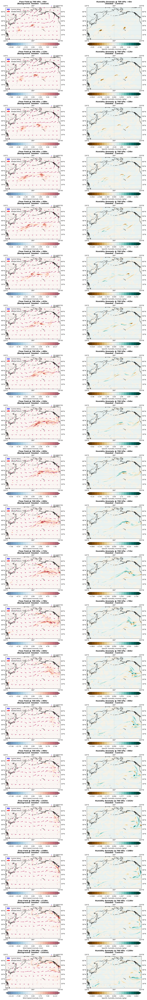

In [171]:
# time_steps_to_plot = [6] 
time_steps_to_plot = list(range(0, 20)) 
# time_steps_to_plot = list(range(num_steps))

# Validate time steps
time_steps_to_plot = [t for t in time_steps_to_plot if t < num_steps]
print(f"Time steps to plot: {time_steps_to_plot}")
print(f"Corresponding hours: {[(i+1)*6 for i in time_steps_to_plot]} hours")


arrow_density = 20  # higher more arrows

# SETUP FIGURE

n_rows = len(time_steps_to_plot)
projection = ccrs.PlateCarree(central_longitude=180)

fig = plt.figure(figsize=(18, 6 * n_rows))
axes = []

for i in range(n_rows):
  ax_flow = fig.add_subplot(n_rows, 2, 2*i + 1, projection=projection)
  ax_humid = fig.add_subplot(n_rows, 2, 2*i + 2, projection=projection)
  axes.append([ax_flow, ax_humid])

axes = np.array(axes)

# PLOT EACH TIME STEP

for row_idx, step_idx in enumerate(time_steps_to_plot):
  hours = (step_idx + 1) * 6
  print(f"\n⏱️  Processing +{hours}hr forecast...")

  # Extract variables for CONTROL scenario
  # Shape: [time=1, level=13, lat=720, lon=1440]
  u_control = preds_control[step_idx].atmos_vars["u"][0].cpu().numpy()
  v_control = preds_control[step_idx].atmos_vars["v"][0].cpu().numpy()
  q_control = preds_control[step_idx].atmos_vars["q"][0].cpu().numpy()

  # Extract variables for SEEDED scenario
  u_seeded = preds_seeded[step_idx].atmos_vars["u"][0].cpu().numpy()
  v_seeded = preds_seeded[step_idx].atmos_vars["v"][0].cpu().numpy()
  q_seeded = preds_seeded[step_idx].atmos_vars["q"][0].cpu().numpy()

  print(f"   Data shape: {u_control.shape}")  # Should be (1, 13, 720, 1440)

  # Extract 2D slice: shape [time=0, level=level_idx, :, :]
  # This gives us [lat, lon] = [720, 1440]
  u_control_2d = u_control[0, level_idx, :, :]
  v_control_2d = v_control[0, level_idx, :, :]
  q_control_2d = q_control[0, level_idx, :, :]

  u_seeded_2d = u_seeded[0, level_idx, :, :]
  v_seeded_2d = v_seeded[0, level_idx, :, :]
  q_seeded_2d = q_seeded[0, level_idx, :, :]

  # Calculate anomalies (SEEDED - CONTROL)
  u_anom = u_seeded_2d - u_control_2d
  v_anom = v_seeded_2d - v_control_2d
  q_anom = q_seeded_2d - q_control_2d

  # Calculate wind speeds
  wind_speed_control = np.sqrt(u_control_2d**2 + v_control_2d**2)
  wind_speed_seeded = np.sqrt(u_seeded_2d**2 + v_seeded_2d**2)
  wind_speed_anom = np.sqrt(u_anom**2 + v_anom**2)

  print(f"   Flow anomaly range: [{wind_speed_anom.min():.3f}, {wind_speed_anom.max():.3f}] m/s")
  print(f"   Humidity anomaly range: [{q_anom.min():.3e}, {q_anom.max():.3e}] kg/kg")

  # Create meshgrid
  LON, LAT = np.meshgrid(lons, lats)

  # ========== FLOW FIELD PLOT ==========
  ax_flow = axes[row_idx, 0]

  # Add map features
  ax_flow.coastlines(resolution='50m', linewidth=0.8)
  ax_flow.add_feature(cfeature.BORDERS, linewidth=0.5, alpha=0.5)
  ax_flow.add_feature(cfeature.LAND, facecolor='lightgray', alpha=0.2)
  ax_flow.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False,
                    linewidth=0.5, alpha=0.5)

  # Plot wind speed anomaly as background
  vmax_flow = max(abs(wind_speed_anom.min()), abs(wind_speed_anom.max()))
  if vmax_flow > 0:
      levels_flow = np.linspace(-vmax_flow, vmax_flow, 21)
      cf_flow = ax_flow.contourf(LON, LAT, wind_speed_anom,
                                  levels=levels_flow,
                                  cmap='RdBu_r',
                                  extend='both',
                                  transform=ccrs.PlateCarree(),
                                  alpha=0.6)

      cbar_flow = plt.colorbar(cf_flow, ax=ax_flow,
                               orientation='horizontal',
                               pad=0.08, shrink=0.8)
      cbar_flow.set_label('Wind Speed Anomaly (m/s)', fontsize=10)

  # Calculate skip value based on arrow_density parameter
  skip = max(1, wind_speed_control.shape[0] // arrow_density)
  print(f"   Arrow skip: every {skip} grid points (~{(wind_speed_control.shape[0]//skip) * (wind_speed_control.shape[1]//skip)} arrows)")

  # Control wind vectors (blue)
  Q_control = ax_flow.quiver(LON[::skip, ::skip], LAT[::skip, ::skip],
                             u_control_2d[::skip, ::skip],
                             v_control_2d[::skip, ::skip],
                             transform=ccrs.PlateCarree(),
                             color='blue', alpha=0.7,
                             scale=500,
                             width=0.003,  # Slightly thinner for dense plots
                             headwidth=4,
                             headlength=5,
                             zorder=10,
                             label='Control Wind')

  # Seeded wind vectors (red)
  Q_seeded = ax_flow.quiver(LON[::skip, ::skip], LAT[::skip, ::skip],
                            u_seeded_2d[::skip, ::skip],
                            v_seeded_2d[::skip, ::skip],
                            transform=ccrs.PlateCarree(),
                            color='red', alpha=0.7,
                            scale=500,
                            width=0.003,  # Slightly thinner for dense plots
                            headwidth=4,
                            headlength=5,
                            zorder=11,
                            label='Seeded Wind')

  # Quiver keys (scale reference)
  ax_flow.quiverkey(Q_control, X=0.85, Y=1.05, U=10,
                    label='10 m/s', labelpos='E',
                    coordinates='axes',
                    color='blue', fontproperties={'size': 10})
  ax_flow.quiverkey(Q_seeded, X=0.85, Y=1.02, U=10,
                    label='10 m/s', labelpos='E',
                    coordinates='axes',
                    color='red', fontproperties={'size': 10})

  ax_flow.legend(loc='upper left', fontsize=10, framealpha=0.9)
  ax_flow.set_title(
      f'Flow Field @ {actual_pressure:.0f} hPa: +{hours}hr\n'
      f'(Background: Seeded - Control)',
      fontsize=12, fontweight='bold'
  )
  ax_flow.set_extent([120, 240, 0, 70], crs=ccrs.PlateCarree())

  # ========== HUMIDITY ANOMALY PLOT ==========
  ax_humid = axes[row_idx, 1]

  # Add map features
  ax_humid.coastlines(resolution='50m', linewidth=0.8)
  ax_humid.add_feature(cfeature.BORDERS, linewidth=0.5, alpha=0.5)
  ax_humid.add_feature(cfeature.LAND, facecolor='lightgray', alpha=0.2)
  ax_humid.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False,
                     linewidth=0.5, alpha=0.5)

  # Plot humidity anomaly (convert to g/kg)
  vmax_q = max(abs(q_anom.min()), abs(q_anom.max()))
  if vmax_q > 0:
      levels_q = np.linspace(-vmax_q, vmax_q, 21)
      cf_humid = ax_humid.contourf(LON, LAT, q_anom * 1000,
                                    levels=levels_q * 1000,
                                    cmap='BrBG',
                                    extend='both',
                                    transform=ccrs.PlateCarree())

      cbar_humid = plt.colorbar(cf_humid, ax=ax_humid,
                                orientation='horizontal',
                                pad=0.08, shrink=0.8)
      cbar_humid.set_label('Specific Humidity Anomaly (g/kg)', fontsize=10)

  ax_humid.set_title(
      f'Humidity Anomaly @ {actual_pressure:.0f} hPa: +{hours}hr\n'
      f'(Seeded - Control)',
      fontsize=12, fontweight='bold'
  )
  ax_humid.set_extent([120, 240, 0, 70], crs=ccrs.PlateCarree())

  print(f"✅ Plotted +{hours}hr")

## Testing 

### Settings

In [135]:
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

In [136]:
# ===================== CONFIG =====================
TARGET_HPA            = 700                    # Wind & geopotential level (hPa)
EXTENT                = [100, 260, 0, 70]     # 0..360 lon Pacific window; for -180..180 use [-160, -100, 0, 70]
CENT_LON              = 180

# Appearance
CMAP                  = "turbo"               # Changed from "cividis" to match screenshot (blue→cyan→green→yellow→red)
FILL_ALPHA            = 0.75
Z_CONTOUR_SPACING_GPM = 120                   # gpm spacing for z700 contours
Z_CONTOUR_COLOR       = "black"               # Changed from "0.2" to make contours visible
Z_CONTOUR_LW          = 1.2                   # Increased from 0.7 to make contours thicker
Z_CONTOUR_ALPHA       = 0.8                   # Increased from 0.35 to make contours more visible
LABEL_Z               = True                  # Changed from False to show contour labels

# Vectors
QUIVER_STEP           = 25                     # Subsample density (BIGGER = FEWER arrows, changed from 18)
ARROWS_NORMALIZE      = True                   # Unit arrows (direction only)
QUIVER_SCALE          = 35                     # Used when ARROWS_NORMALIZE=False
QUIVER_WIDTH          = 0.003                  # Thinner shafts (reduced from 0.004)
HEAD_KW               = dict(headwidth=2.0, headlength=2.5, headaxislength=2.0)  # Smaller heads for clearer direction

# Thresholds
SPEED_PCTL_FILL       = 80                     # Color only >= this pct of wind speed
SPEED_PCTL_ARROWS     = 0                      # Draw arrows everywhere (0 pct); raise if you want filtering
DIFF_DIR_THRESH       = 5.0                   # degrees; red if |Δdir| >= this
DIFF_SPD_THRESH       = 1.0                    # m/s; red also if |Δspeed| >= this

# Seed/perturbation marker (star). If you already have `seeding_location`, this will be auto-used.
SHOW_SEED_STAR        = True
SEED_STAR_LONLAT      = None                   # (lon, lat). Leave None to auto-read seeding_location dict.
SEED_STAR_STYLE       = dict(marker='*', markersize=14, color='gold', markeredgewidth=1.2, markeredgecolor='k')

In [137]:
# ===================== HELPERS =====================

def _to_np(x):
    return x.detach().cpu().numpy() if hasattr(x, "detach") else np.asarray(x)


def wind_speed(u, v):
    return np.sqrt(u*u + v*v)


def _coerce_latlon(arr, lat_len, lon_len):
    arr = np.squeeze(arr)
    while arr.ndim > 2:
        arr = np.take(arr, 0, axis=0)
    if arr.shape == (lon_len, lat_len):
        arr = arr.T
    if arr.shape != (lat_len, lon_len):
        raise RuntimeError(f"Array not [lat,lon], got {arr.shape}")
    return arr


def extract_uv_level(pred, lev_idx, lat_len, lon_len, levels):
    u = _to_np(pred.atmos_vars["u"]) ; v = _to_np(pred.atmos_vars["v"]) 
    lev_len = int(levels.size)
    if u.ndim >= 3 and lev_len:
        lev_axis = next((i for i, s in enumerate(u.shape) if s == lev_len), None)
        if lev_axis is not None:
            li = min(lev_idx, u.shape[lev_axis]-1)
            u = np.take(u, li, axis=lev_axis)
            v = np.take(v, li, axis=lev_axis)
    return _coerce_latlon(u, lat_len, lon_len), _coerce_latlon(v, lat_len, lon_len)


def extract_z_level(pred, lev_idx, lat_len, lon_len, levels):
    z = _to_np(pred.atmos_vars["z"]) 
    lev_len = int(levels.size)
    z = np.squeeze(z)
    if z.ndim >= 3 and lev_len:
        lev_axis = next((i for i, s in enumerate(z.shape) if s == lev_len), None)
        if lev_axis is not None:
            li = min(lev_idx, z.shape[lev_axis]-1)
            z = np.take(z, li, axis=lev_axis)
    z = _coerce_latlon(z, lat_len, lon_len)
    return z / 9.80665  # m^2/s^2 → gpm


def circ_diff_deg(a, b):
    """Smallest signed angular difference a-b in degrees in [-180, 180)."""
    return (a - b + 180.0) % 360.0 - 180.0


def setup_map(ax, extent, data_crs, show_left=True, show_bottom=True):
    ax.add_feature(cfeature.LAND, facecolor='lightgray', alpha=0.4, zorder=1)
    ax.add_feature(cfeature.OCEAN, facecolor='lightblue', alpha=0.25, zorder=0)
    ax.add_feature(cfeature.COASTLINE, linewidth=1.0, edgecolor='black', zorder=10)
    ax.add_feature(cfeature.BORDERS, linewidth=0.6, edgecolor='gray', alpha=0.5, zorder=10)
    ax.set_extent(extent, crs=data_crs)
    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False; gl.right_labels = False
    gl.left_labels = show_left; gl.bottom_labels = show_bottom
    return ax


def add_z_contours_and_HL(ax, z_gpm, lat_vals, lon_vals, data_crs, extent,
                          spacing_gpm=Z_CONTOUR_SPACING_GPM, color=Z_CONTOUR_COLOR,
                          lw=Z_CONTOUR_LW, alpha=Z_CONTOUR_ALPHA, label=LABEL_Z):
    Lon, Lat = np.meshgrid(lon_vals, lat_vals)
    zmin, zmax = np.nanmin(z_gpm), np.nanmax(z_gpm)
    start = np.floor(zmin/spacing_gpm)*spacing_gpm
    stop  = np.ceil(zmax/spacing_gpm)*spacing_gpm
    levels = np.arange(start, stop + 1e-6, spacing_gpm)
    
    # Draw contours with HIGHER zorder (8) to be visible over filled contours (zorder=2)
    cs = ax.contour(Lon, Lat, z_gpm, levels=levels, colors=color, linewidths=lw,
                    linestyles='-', transform=data_crs, alpha=alpha, zorder=8)
    if label:
        ax.clabel(cs, fmt="%.0f", fontsize=8, inline=True)

    # Add H/L markers
    lon_min, lon_max, lat_min, lat_max = extent
    in_lon = (lon_vals >= lon_min) & (lon_vals <= lon_max)
    in_lat = (lat_vals >= lat_min) & (lat_vals <= lat_max)
    if not in_lon.any() or not in_lat.any():
        return
    z_sub = z_gpm[np.ix_(in_lat, in_lon)]
    if np.all(~np.isfinite(z_sub)):
        return
    jmin, imin = np.unravel_index(np.nanargmin(z_sub), z_sub.shape)
    jmax, imax = np.unravel_index(np.nanargmax(z_sub), z_sub.shape)
    lat_L = lat_vals[in_lat][jmin]; lon_L = lon_vals[in_lon][imin]
    lat_H = lat_vals[in_lat][jmax]; lon_H = lon_vals[in_lon][imax]
    
    # Draw H/L with white background boxes for better visibility
    ax.text(lon_L, lat_L, "L", transform=data_crs, ha='center', va='center',
            fontsize=18, fontweight='bold', color='royalblue', zorder=11,
            bbox=dict(boxstyle='circle', facecolor='white', edgecolor='royalblue', alpha=0.8))
    ax.text(lon_H, lat_H, "H", transform=data_crs, ha='center', va='center',
            fontsize=18, fontweight='bold', color='darkred', zorder=11,
            bbox=dict(boxstyle='circle', facecolor='white', edgecolor='darkred', alpha=0.8))


def maybe_plot_seed_star(ax, data_crs):
    if not SHOW_SEED_STAR:
        return
    lonlat = None
    try:
        if SEED_STAR_LONLAT is not None:
            lonlat = SEED_STAR_LONLAT
        elif 'seeding_location' in globals() and isinstance(seeding_location, dict):
            lonlat = (seeding_location.get('lon_center'), seeding_location.get('lat_center'))
    except Exception:
        lonlat = None
    if lonlat is None or None in lonlat:
        return
    ax.plot(lonlat[0], lonlat[1], transform=data_crs, **SEED_STAR_STYLE, zorder=12)

### Two column plots

In [138]:
# ===================== MAIN PLOT =====================

def plot_wind_two_col_700(preds_control, preds_seeded, batch_control,
                           target_hpa=TARGET_HPA, extent=EXTENT,
                           quiver_step=QUIVER_STEP):
    lat = _to_np(batch_control.metadata.lat)
    lon = _to_np(batch_control.metadata.lon)
    levels = _to_np(batch_control.metadata.atmos_levels).astype(float)

    if extent[0] < -180 and float(lon.min()) >= 0:
        extent = [((extent[0]+360)%360), ((extent[1]+360)%360), extent[2], extent[3]]

    lat_len, lon_len = len(lat), len(lon)
    lev_idx = int(np.abs(levels - float(target_hpa)).argmin()) if levels.size else 0
    actual_level = levels[lev_idx] if levels.size else target_hpa

    # Collect fields
    Uc, Vc, Us, Vs, Zc, Zs = [], [], [], [], [], []
    for p in preds_control:
        u, v = extract_uv_level(p, lev_idx, lat_len, lon_len, levels)
        Uc.append(u); Vc.append(v)
        Zc.append(extract_z_level(p, lev_idx, lat_len, lon_len, levels))
    for p in preds_seeded:
        u, v = extract_uv_level(p, lev_idx, lat_len, lon_len, levels)
        Us.append(u); Vs.append(v)
        Zs.append(extract_z_level(p, lev_idx, lat_len, lon_len, levels))

    Uc = np.stack(Uc); Vc = np.stack(Vc)
    Us = np.stack(Us); Vs = np.stack(Vs)
    Zc = np.stack(Zc); Zs = np.stack(Zs)

    SPDc = wind_speed(Uc, Vc)
    SPDs = wind_speed(Us, Vs)

    # Percentiles for fills/legend
    all_spd = np.concatenate([SPDc.ravel(), SPDs.ravel()])
    p_fill = np.nanpercentile(all_spd, SPEED_PCTL_FILL)
    p99 = np.nanpercentile(all_spd, 99)

    SPDc_fill = np.where(SPDc >= p_fill, SPDc, np.nan)
    SPDs_fill = np.where(SPDs >= p_fill, SPDs, np.nan)
    levels_spd = np.linspace(p_fill, p99, 15)

    # Unit or scaled arrows
    eps = 1e-9
    if ARROWS_NORMALIZE:
        Uc_plot, Vc_plot = Uc/(SPDc+eps), Vc/(SPDc+eps)
        Us_plot, Vs_plot = Us/(SPDs+eps), Vs/(SPDs+eps)
    else:
        Uc_plot, Vc_plot = Uc, Vc
        Us_plot, Vs_plot = Us, Vs

    # Direction differences (for seeded coloring)
    dir_c = (np.degrees(np.arctan2(Vc, Uc)) + 360.0) % 360.0
    dir_s = (np.degrees(np.arctan2(Vs, Us)) + 360.0) % 360.0
    ddir  = (dir_s - dir_c + 180.0) % 360.0 - 180.0
    dspd  = SPDs - SPDc

    Lon, Lat = np.meshgrid(lon, lat)
    proj = ccrs.PlateCarree(central_longitude=CENT_LON)
    data_crs = ccrs.PlateCarree()

    T = SPDc.shape[0]
    fig, axes = plt.subplots(T, 2, figsize=(18, max(4.6*T, 6)), subplot_kw={'projection': proj})
    if T == 1: axes = np.array([axes])

    for i in range(T):
        hours = (i+1)*6
        step = max(1, int(quiver_step))
        slc = (slice(None, None, step), slice(None, None, step))

        # Arrow masks (everywhere by default; keep a small floor at very calm flow)
        mask_all = np.isfinite(SPDc[i]) & np.isfinite(SPDs[i])
        mask_c = mask_all.copy()
        mask_s = mask_all.copy()

        # Difference mask for seeded (red)
        diff_mask = (np.abs(ddir[i]) >= DIFF_DIR_THRESH) | (np.abs(dspd[i]) >= DIFF_SPD_THRESH)

        # ===== CALCULATE STATISTICS (OPTION B) =====
        # Only for pixels that meet the difference criteria at sampled locations
        red_arrow_indices = diff_mask[slc]
        n_red_arrows = np.sum(red_arrow_indices)

        if n_red_arrows > 0:
            # Get direction changes for red arrows
            ddir_red = np.abs(ddir[i][slc][red_arrow_indices])
            dspd_red = dspd[i][slc][red_arrow_indices]

            dir_min = np.nanmin(ddir_red)
            dir_max = np.nanmax(ddir_red)
            dir_median = np.nanmedian(ddir_red)
            spd_mean = np.nanmean(dspd_red)

            stats_text = (f"Red arrows (n={n_red_arrows}): "
                         f"Δdir {dir_min:.1f}°-{dir_max:.1f}° (median {dir_median:.1f}°), "
                         f"mean Δspeed {spd_mean:+.2f} m/s")
        else:
            stats_text = "No significant wind changes detected"

        # ---- Left: CONTROL ----
        axL = setup_map(axes[i,0], extent, data_crs, show_left=(i==0), show_bottom=(i==T-1))
        imL = axL.contourf(Lon, Lat, SPDc_fill[i], levels=levels_spd, cmap=CMAP,
                           extend='max', transform=data_crs, alpha=FILL_ALPHA, zorder=2)
        axL.quiver(Lon[slc][mask_c[slc]], Lat[slc][mask_c[slc]],
                   Uc_plot[i][slc][mask_c[slc]], Vc_plot[i][slc][mask_c[slc]],
                   transform=data_crs, width=QUIVER_WIDTH,
                   scale=None if ARROWS_NORMALIZE else QUIVER_SCALE,
                   alpha=0.9, zorder=5, color='k', **HEAD_KW)
        add_z_contours_and_HL(axL, Zc[i], lat, lon, data_crs, extent)
        maybe_plot_seed_star(axL, data_crs)
        axL.set_title(f"Control | {actual_level:.0f} hPa | +{hours}h", fontsize=12, fontweight='bold')

        # ---- Right: SEEDED ----
        axR = setup_map(axes[i,1], extent, data_crs, show_left=False, show_bottom=(i==T-1))
        imR = axR.contourf(Lon, Lat, SPDs_fill[i], levels=levels_spd, cmap=CMAP,
                           extend='max', transform=data_crs, alpha=FILL_ALPHA, zorder=2)
        # non-different arrows (black)
        nd_mask = mask_s & ~diff_mask
        axR.quiver(Lon[slc][nd_mask[slc]], Lat[slc][nd_mask[slc]],
                   Us_plot[i][slc][nd_mask[slc]], Vs_plot[i][slc][nd_mask[slc]],
                   transform=data_crs, width=QUIVER_WIDTH,
                   scale=None if ARROWS_NORMALIZE else QUIVER_SCALE,
                   alpha=0.7, zorder=5, color='k', **HEAD_KW)
        # different arrows (RED)
        df_mask = mask_s & diff_mask
        axR.quiver(Lon[slc][df_mask[slc]], Lat[slc][df_mask[slc]],
                   Us_plot[i][slc][df_mask[slc]], Vs_plot[i][slc][df_mask[slc]],
                   transform=data_crs, width=QUIVER_WIDTH*1.2,
                   scale=None if ARROWS_NORMALIZE else QUIVER_SCALE,
                   alpha=1.0, zorder=6, color='crimson', **HEAD_KW)
        add_z_contours_and_HL(axR, Zs[i], lat, lon, data_crs, extent)
        maybe_plot_seed_star(axR, data_crs)
        
        # Title with statistics (OPTION B)
        axR.set_title(f"Seeded | {actual_level:.0f} hPa | +{hours}h\n{stats_text}",
                     fontsize=11, fontweight='bold')

    # Shared colorbar
    cax = fig.add_axes([0.15, 0.04, 0.7, 0.018])
    cb  = fig.colorbar(ScalarMappable(norm=Normalize(vmin=np.nanmin(levels_spd), vmax=np.nanmax(levels_spd)), cmap=CMAP),
                       cax=cax, orientation='horizontal', extend='max')
    cb.set_label('Wind Speed (m/s) — ≥80th percentile', fontsize=11, fontweight='bold')

    plt.suptitle(f'{actual_level:.0f}-hPa: Speed (color) + Direction (arrows) + Geopotential (contours)\nControl vs Seeded',
                 fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout(rect=[0, 0.06, 1, 0.99])
    return fig

/tmp/ipykernel_4048918/2686973835.py:147: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.06, 1, 0.99])


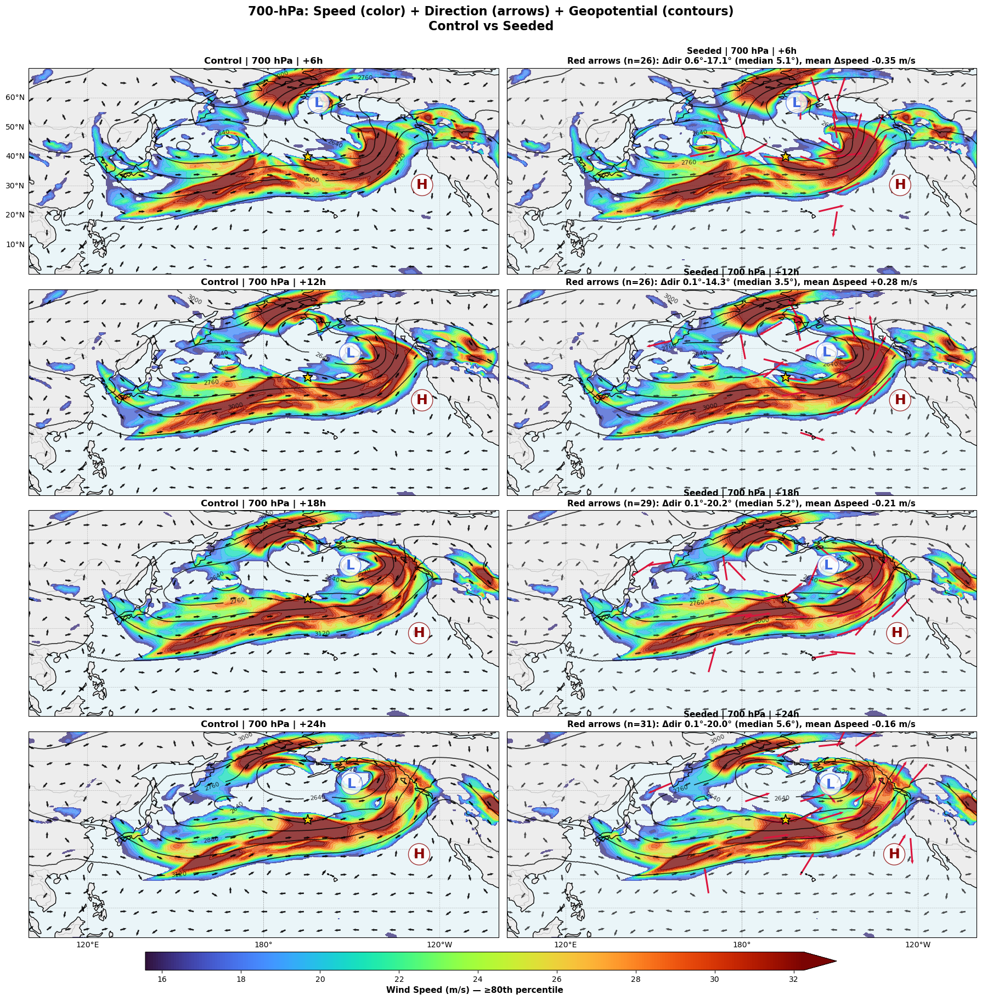

✅ Two-column 700-hPa wind panels with seed star & diff-highlighting complete!


In [139]:
# ===================== USAGE =====================
if __name__ == "__main__":
    fig = plot_wind_two_col_700(
        preds_control, preds_seeded, batch_control,
        target_hpa=TARGET_HPA, extent=EXTENT, quiver_step=QUIVER_STEP
    )
    plt.show()
    print("✅ Two-column 700-hPa wind panels with seed star & diff-highlighting complete!")

### Anomaly plot

In [123]:
# ===================== NEW: WIND ANOMALY WITH DUAL ARROWS =====================

def plot_wind_anomaly_with_dual_arrows(preds_control, preds_seeded, batch_control,
                                       target_hpa=700, extent=[100, 260, 0, 70],
                                       quiver_step=25, change_threshold_dir=5.0, 
                                       change_threshold_spd=1.0):
    """
    Plot wind speed anomaly with dual arrows showing direction changes.
    
    Shows:
    1. Wind speed anomaly (Seeded - Control) as colored contours
    2. At locations with significant changes, draw TWO arrows:
       - Blue arrow = Control direction
       - Red arrow = Seeded direction
    
    Args:
        preds_control: Control predictions
        preds_seeded: Seeded predictions
        batch_control: Batch with metadata
        target_hpa: Pressure level (hPa)
        extent: Map extent [lon_min, lon_max, lat_min, lat_max]
        quiver_step: Arrow subsampling
        change_threshold_dir: Direction change threshold (degrees)
        change_threshold_spd: Speed change threshold (m/s)
    """
    # Extract metadata
    lat = _to_np(batch_control.metadata.lat)
    lon = _to_np(batch_control.metadata.lon)
    levels = _to_np(batch_control.metadata.atmos_levels).astype(float)
    
    if extent[0] < -180 and float(lon.min()) >= 0:
        extent = [((extent[0]+360)%360), ((extent[1]+360)%360), extent[2], extent[3]]
    
    lat_len, lon_len = len(lat), len(lon)
    lev_idx = int(np.abs(levels - float(target_hpa)).argmin())
    actual_level = levels[lev_idx]
    
    # Extract wind fields
    Uc, Vc, Us, Vs, Zc, Zs = [], [], [], [], [], []
    for p in preds_control:
        u, v = extract_uv_level(p, lev_idx, lat_len, lon_len, levels)
        Uc.append(u); Vc.append(v)
        Zc.append(extract_z_level(p, lev_idx, lat_len, lon_len, levels))
    for p in preds_seeded:
        u, v = extract_uv_level(p, lev_idx, lat_len, lon_len, levels)
        Us.append(u); Vs.append(v)
        Zs.append(extract_z_level(p, lev_idx, lat_len, lon_len, levels))
    
    Uc = np.stack(Uc); Vc = np.stack(Vc)
    Us = np.stack(Us); Vs = np.stack(Vs)
    Zc = np.stack(Zc); Zs = np.stack(Zs)
    
    # Calculate speeds and anomalies
    SPDc = wind_speed(Uc, Vc)
    SPDs = wind_speed(Us, Vs)
    dSPD = SPDs - SPDc  # Speed anomaly
    
    # Direction changes
    dir_c = (np.degrees(np.arctan2(Vc, Uc)) + 360.0) % 360.0
    dir_s = (np.degrees(np.arctan2(Vs, Us)) + 360.0) % 360.0
    ddir = (dir_s - dir_c + 180.0) % 360.0 - 180.0
    
    # Normalize for direction arrows
    eps = 1e-9
    Uc_norm = Uc / (SPDc + eps)
    Vc_norm = Vc / (SPDc + eps)
    Us_norm = Us / (SPDs + eps)
    Vs_norm = Vs / (SPDs + eps)
    
    Lon, Lat = np.meshgrid(lon, lat)
    proj = ccrs.PlateCarree(central_longitude=180)
    data_crs = ccrs.PlateCarree()
    
    T = dSPD.shape[0]
    fig, axes = plt.subplots(T, 1, figsize=(14, max(5*T, 6)), 
                             subplot_kw={'projection': proj})
    if T == 1:
        axes = np.array([axes])
    
    # Symmetric color scale for speed anomaly
    amax_spd = max(np.nanmax(np.abs(dSPD)), 0.5)
    levels_spd = np.linspace(-amax_spd, amax_spd, 21)
    
    for i in range(T):
        hours = (i+1)*6
        ax = axes[i]
        
        # Setup map
        ax.add_feature(cfeature.LAND, facecolor='lightgray', alpha=0.4, zorder=1)
        ax.add_feature(cfeature.OCEAN, facecolor='lightblue', alpha=0.25, zorder=0)
        ax.add_feature(cfeature.COASTLINE, linewidth=1.0, edgecolor='black', zorder=10)
        ax.add_feature(cfeature.BORDERS, linewidth=0.6, edgecolor='gray', alpha=0.5, zorder=10)
        ax.set_extent(extent, crs=data_crs)
        
        gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
        gl.top_labels = False; gl.right_labels = False
        gl.left_labels = (i == 0); gl.bottom_labels = (i == T-1)
        
        # 1. WIND SPEED ANOMALY (colored contours)
        im = ax.contourf(Lon, Lat, dSPD[i], levels=levels_spd, cmap='RdBu_r',
                        extend='both', transform=data_crs, alpha=0.85, zorder=2)
        
        # 2. GEOPOTENTIAL CONTOURS
        add_z_contours_and_HL(ax, Zs[i], lat, lon, data_crs, extent)
        
        # 3. DUAL ARROWS where there's significant change
        step = max(1, int(quiver_step))
        slc = (slice(None, None, step), slice(None, None, step))
        
        # Identify locations with significant changes
        change_mask = (np.abs(ddir[i]) >= change_threshold_dir) | \
                     (np.abs(dSPD[i]) >= change_threshold_spd)
        
        change_mask_sampled = change_mask[slc]
        n_changes = np.sum(change_mask_sampled)
        
        if n_changes > 0:
            # Get coordinates where there are changes
            lon_changed = Lon[slc][change_mask_sampled]
            lat_changed = Lat[slc][change_mask_sampled]
            
            # Get wind components at changed locations
            uc_changed = Uc_norm[i][slc][change_mask_sampled]
            vc_changed = Vc_norm[i][slc][change_mask_sampled]
            us_changed = Us_norm[i][slc][change_mask_sampled]
            vs_changed = Vs_norm[i][slc][change_mask_sampled]
            
            # Small offset to separate the two arrows (0.3 degrees)
            offset = 0.3
            
            # Draw CONTROL arrows (BLUE) - slightly offset to the left
            ax.quiver(lon_changed - offset, lat_changed, uc_changed, vc_changed,
                     transform=data_crs, color='royalblue', width=0.004,
                     scale=None, alpha=0.9, zorder=6,
                     headwidth=2.5, headlength=3.0, headaxislength=2.5,
                     label='Control')
            
            # Draw SEEDED arrows (RED) - slightly offset to the right  
            ax.quiver(lon_changed + offset, lat_changed, us_changed, vs_changed,
                     transform=data_crs, color='crimson', width=0.004,
                     scale=None, alpha=0.9, zorder=7,
                     headwidth=2.5, headlength=3.0, headaxislength=2.5,
                     label='Seeded')
            
            # Calculate statistics for changed locations
            ddir_changed = np.abs(ddir[i][slc][change_mask_sampled])
            dspd_changed = dSPD[i][slc][change_mask_sampled]
            
            dir_median = np.nanmedian(ddir_changed)
            dir_max = np.nanmax(ddir_changed)
            spd_mean = np.nanmean(dspd_changed)
            
            stats_text = (f"Changes detected: n={n_changes} | "
                         f"Δdir: median {dir_median:.1f}°, max {dir_max:.1f}° | "
                         f"Δspeed: mean {spd_mean:+.2f} m/s")
        else:
            stats_text = "No significant wind changes detected"
        
        # Seeding marker
        maybe_plot_seed_star(ax, data_crs)
        
        # Title
        ax.set_title(f"{actual_level:.0f} hPa Wind Speed Anomaly + Direction Change | +{hours}h\n{stats_text}",
                    fontsize=12, fontweight='bold')
        
        # Legend (only first panel)
        if i == 0 and n_changes > 0:
            from matplotlib.lines import Line2D
            legend_elements = [
                Line2D([0], [0], color='royalblue', linewidth=3, label='Control direction'),
                Line2D([0], [0], color='crimson', linewidth=3, label='Seeded direction'),
                Line2D([0], [0], marker='*', color='gold', linewidth=0, 
                      markersize=12, markeredgecolor='k', label='Seeding point')
            ]
            ax.legend(handles=legend_elements, loc='upper right', fontsize=10, 
                     framealpha=0.9)
    
    # Colorbar
    cax = fig.add_axes([0.15, 0.03, 0.7, 0.015])
    cb = fig.colorbar(ScalarMappable(norm=Normalize(vmin=-amax_spd, vmax=amax_spd), 
                                     cmap='RdBu_r'),
                     cax=cax, orientation='horizontal', extend='both')
    cb.set_label('Wind Speed Anomaly [m/s] (Seeded − Control)', 
                fontsize=11, fontweight='bold')
    
    plt.suptitle(f'Cloud Seeding Impact: Wind Speed Anomaly + Dual Direction Arrows\n'
                f'Blue=Control, Red=Seeded (shown only where |Δdir|≥{change_threshold_dir}° or |Δspeed|≥{change_threshold_spd} m/s)',
                fontsize=14, fontweight='bold', y=0.995)
    plt.tight_layout(rect=[0, 0.05, 1, 0.99])
    
    return fig

🎨 Creating dual-arrow wind anomaly visualization...


/tmp/ipykernel_4048918/3758540534.py:189: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.99])
/tmp/ipykernel_4048918/758872270.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


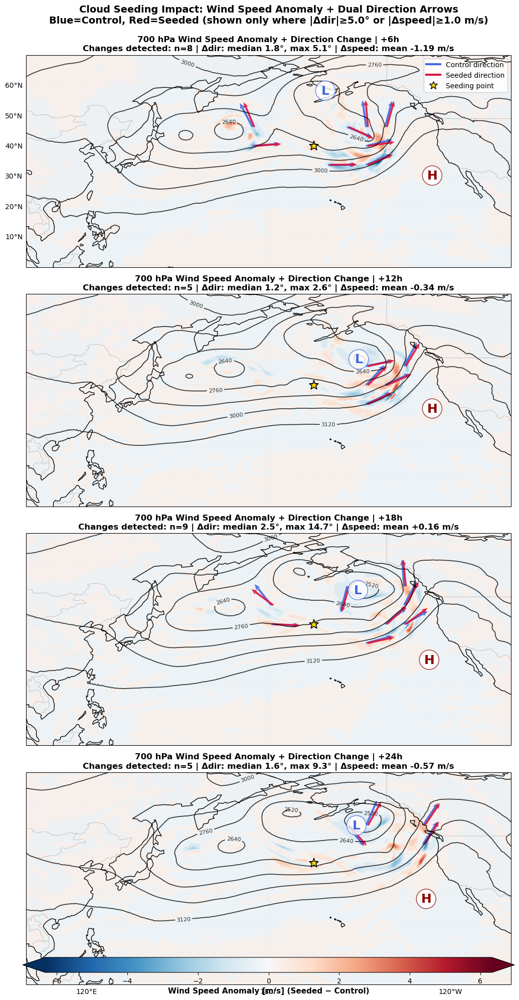


✅ Dual-arrow wind anomaly visualization complete!
   Blue arrows = Control wind direction
   Red arrows = Seeded wind direction
   Arrows appear where |Δdir| ≥ 5° or |Δspeed| ≥ 1 m/s


In [124]:
# ===================== EXECUTE DUAL-ARROW VISUALIZATION =====================
# Plot wind speed anomaly with dual arrows showing direction changes
# Blue arrows = Control wind direction
# Red arrows = Seeded wind direction

print("🎨 Creating dual-arrow wind anomaly visualization...")
print("=" * 80)

fig_dual = plot_wind_anomaly_with_dual_arrows(
    preds_control, preds_seeded, batch_control,
    target_hpa=TARGET_HPA, 
    extent=EXTENT,
    quiver_step=QUIVER_STEP,
    change_threshold_dir=5.0,   # Show arrows where direction change ≥ 5°
    change_threshold_spd=1.0    # or wind speed change ≥ 1 m/s
)

plt.tight_layout()
plt.show()

print("\n✅ Dual-arrow wind anomaly visualization complete!")
print("   Blue arrows = Control wind direction")
print("   Red arrows = Seeded wind direction")
print("   Arrows appear where |Δdir| ≥ 5° or |Δspeed| ≥ 1 m/s")

### Testing the perturabtion for model

In [125]:
# Get metadata
lat_vals = _to_np(batch_control.metadata.lat)
lon_vals = _to_np(batch_control.metadata.lon)
levels = _to_np(batch_control.metadata.atmos_levels)
lat_len, lon_len = len(lat_vals), len(lon_vals)

# Find 700 hPa level
lev_idx = np.argmin(np.abs(levels - TARGET_HPA))
print(f"Pressure level: {int(levels[lev_idx])} hPa (index {lev_idx})")

# Extract temperature from first timestep (+6hr)
step = 0  # First timestep

# Control temperature
t_ctrl = _to_np(preds_control[step].atmos_vars["t"])
print(f"Control t shape: {t_ctrl.shape}")

# Seeded temperature  
t_seed = _to_np(preds_seeded[step].atmos_vars["t"])
print(f"Seeded t shape: {t_seed.shape}")

# Extract the 700 hPa level
lev_len = int(levels.size)
if t_ctrl.ndim >= 3 and lev_len:
  lev_axis = next((i for i, s in enumerate(t_ctrl.shape) if s == lev_len), None)
  if lev_axis is not None:
      t_ctrl = np.take(t_ctrl, lev_idx, axis=lev_axis)
      t_seed = np.take(t_seed, lev_idx, axis=lev_axis)

# Coerce to (lat, lon)
t_ctrl = _coerce_latlon(t_ctrl, lat_len, lon_len)
t_seed = _coerce_latlon(t_seed, lat_len, lon_len)

print(f"After extraction - Control shape: {t_ctrl.shape}, Seeded shape: {t_seed.shape}")

# Calculate difference
t_diff = t_seed - t_ctrl

print(f"\n📊 Temperature Statistics:")
print(f"Control - min: {np.min(t_ctrl):.2f} K, max: {np.max(t_ctrl):.2f} K, mean: {np.mean(t_ctrl):.2f} K")
print(f"Seeded  - min: {np.min(t_seed):.2f} K, max: {np.max(t_seed):.2f} K, mean: {np.mean(t_seed):.2f} K")
print(f"Difference (Seeded-Control):")
print(f"  min: {np.min(t_diff):.6f} K")
print(f"  max: {np.max(t_diff):.6f} K")
print(f"  mean: {np.mean(t_diff):.6f} K")
print(f"  std: {np.std(t_diff):.6f} K")
print(f"  98th percentile of |diff|: {np.percentile(np.abs(t_diff), 98):.6f} K")

Pressure level: 700 hPa (index 3)
Control t shape: (1, 1, 13, 720, 1440)
Seeded t shape: (1, 1, 13, 720, 1440)
After extraction - Control shape: (720, 1440), Seeded shape: (720, 1440)

📊 Temperature Statistics:
Control - min: 229.34 K, max: 287.70 K, mean: 267.07 K
Seeded  - min: 229.34 K, max: 287.71 K, mean: 267.08 K
Difference (Seeded-Control):
  min: -1.193939 K
  max: 2.703705 K
  mean: 0.006266 K
  std: 0.083791 K
  98th percentile of |diff|: 0.031128 K



🎨 Using color range: ±0.031128 K


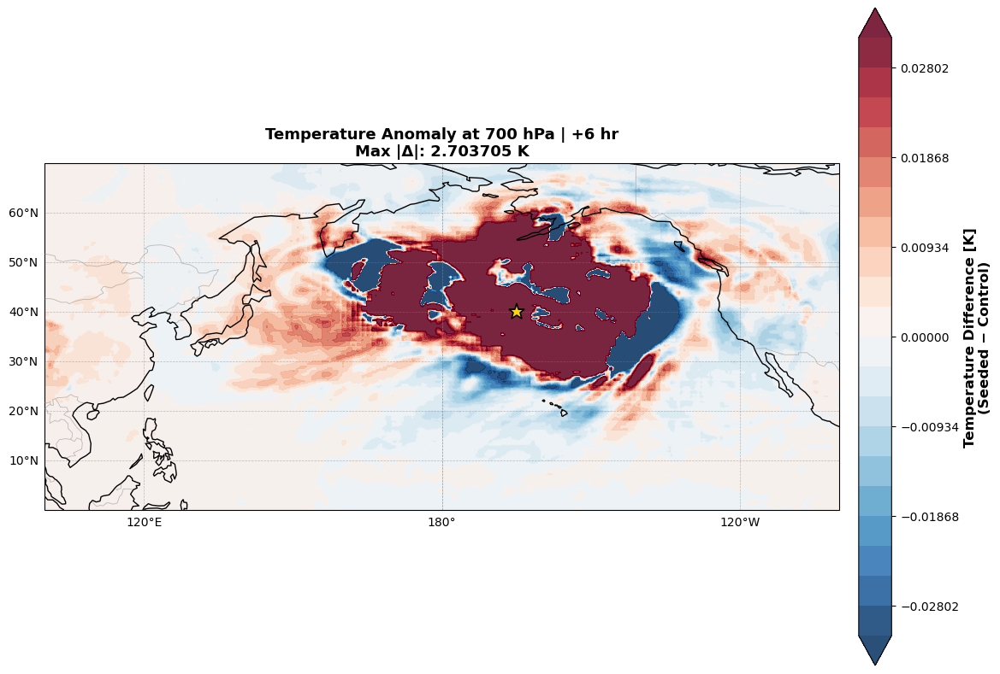


✅ Temperature difference plot complete!


In [126]:
# Plot
fig, ax = plt.subplots(1, 1, figsize=(12, 8),
                     subplot_kw={'projection': ccrs.PlateCarree(central_longitude=CENT_LON)})

data_crs = ccrs.PlateCarree()
setup_map(ax, EXTENT, data_crs)

# Create meshgrid
Lon, Lat = np.meshgrid(lon_vals, lat_vals)

# Determine color limits
vmax = np.percentile(np.abs(t_diff), 98)
vmax = max(vmax, 1e-6)  # Ensure non-zero

print(f"\n🎨 Using color range: ±{vmax:.6f} K")

# Plot
cf = ax.contourf(Lon, Lat, t_diff,
               levels=np.linspace(-vmax, vmax, 21),
               cmap='RdBu_r', extend='both',
               transform=data_crs, alpha=0.85)

# Add colorbar
cbar = plt.colorbar(cf, ax=ax, orientation='vertical', pad=0.02)
cbar.set_label('Temperature Difference [K]\n(Seeded − Control)', fontsize=12, fontweight='bold')

# Add seeding star
maybe_plot_seed_star(ax, data_crs)

# Title
ax.set_title(f'Temperature Anomaly at {int(levels[lev_idx])} hPa | +6 hr\nMax |Δ|: {np.max(np.abs(t_diff)):.6f} K',
           fontsize=13, fontweight='bold')

plt.tight_layout()
plt.show()

print("\n✅ Temperature difference plot complete!")

🔍 Creating combined Temperature + Geopotential Height anomaly plot...
📊 Temperature color scale: ±0.0106 K
📊 Geopotential contour interval: ±0.18 gpm

+ 6 hr: T max |Δ|: 0.9772 K | Z max |Δ|: 2.65 gpm
+12 hr: T max |Δ|: 0.6868 K | Z max |Δ|: 3.04 gpm
+18 hr: T max |Δ|: 0.6874 K | Z max |Δ|: 3.19 gpm
+24 hr: T max |Δ|: 0.7433 K | Z max |Δ|: 4.32 gpm


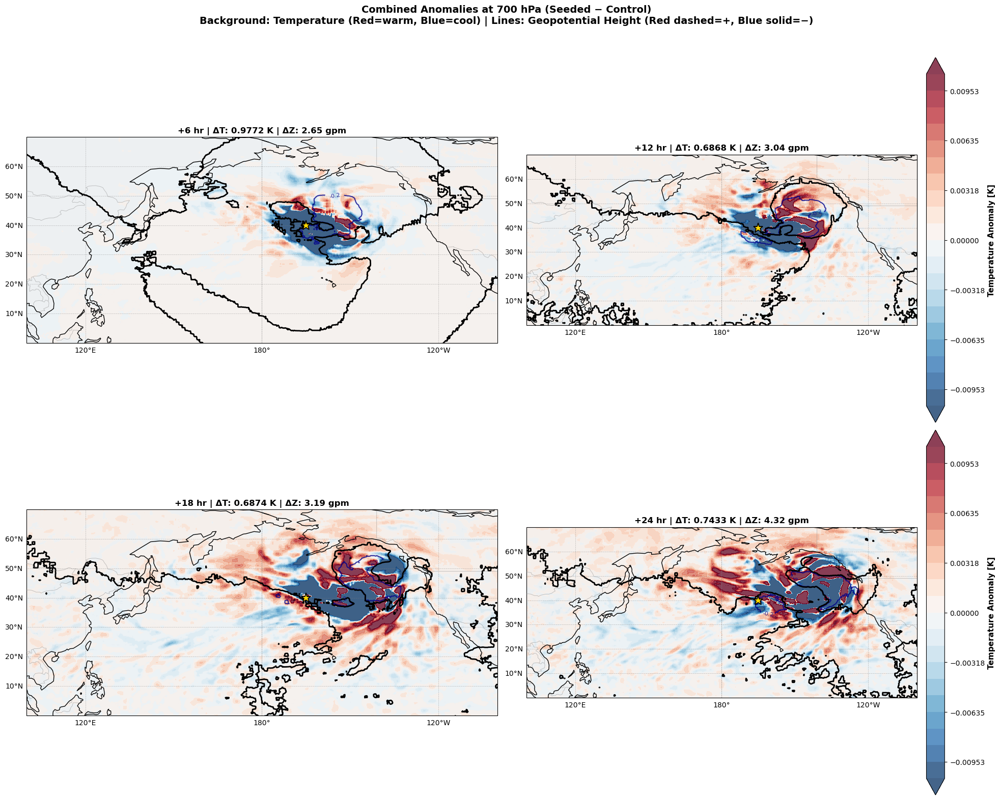


📊 INTERPRETATION:
   Background colors = Temperature anomaly:
      🔴 Red: Warming from cloud seeding
      🔵 Blue: Cooling from cloud seeding

   Contour lines = Geopotential height anomaly:
      --- Red dashed: Positive (higher pressure/anticyclonic)
      ___ Blue solid: Negative (lower pressure/cyclonic)
      ___ Black thick: Zero line

✅ Combined anomaly plot complete!


In [104]:
# ===================== COMBINED TEMPERATURE + GEOPOTENTIAL HEIGHT ANOMALY =====================
# Temperature as filled colors, geopotential height as contour lines

TARGET_LEVEL = 500  # ← Change this! (500, 700, 850, etc.)

print(f"🔍 Creating combined anomaly plot at {TARGET_LEVEL} hPa...")
print("=" * 80)

# Get metadata
lat_vals = _to_np(batch_control.metadata.lat)
lon_vals = _to_np(batch_control.metadata.lon)
levels = _to_np(batch_control.metadata.atmos_levels)
lat_len, lon_len = len(lat_vals), len(lon_vals)

lev_idx = np.argmin(np.abs(levels - TARGET_LEVEL))
actual_level = int(levels[lev_idx])

print(f"Using pressure level: {actual_level} hPa (index {lev_idx})\n")

# Create 2x2 plot for 4 timesteps
fig, axes = plt.subplots(2, 2, figsize=(20, 16),
                       subplot_kw={'projection': ccrs.PlateCarree(central_longitude=CENT_LON)})

data_crs = ccrs.PlateCarree()
Lon, Lat = np.meshgrid(lon_vals, lat_vals)

# Collect all data for consistent color scales
all_t_diffs = []
all_z_diffs = []

for step in range(4):
  # Extract temperature
  t_ctrl = _to_np(preds_control[step].atmos_vars["t"])
  t_seed = _to_np(preds_seeded[step].atmos_vars["t"])

  # Extract geopotential height
  z_ctrl = _to_np(preds_control[step].atmos_vars["z"])
  z_seed = _to_np(preds_seeded[step].atmos_vars["z"])

  # Find level axis
  lev_len = int(levels.size)
  lev_axis = next((i for i, s in enumerate(t_ctrl.shape) if s == lev_len), None)

  if lev_axis is not None:
      t_ctrl_lev = _coerce_latlon(np.take(t_ctrl, lev_idx, axis=lev_axis), lat_len, lon_len)
      t_seed_lev = _coerce_latlon(np.take(t_seed, lev_idx, axis=lev_axis), lat_len, lon_len)
      z_ctrl_lev = _coerce_latlon(np.take(z_ctrl, lev_idx, axis=lev_axis), lat_len, lon_len)
      z_seed_lev = _coerce_latlon(np.take(z_seed, lev_idx, axis=lev_axis), lat_len, lon_len)
  else:
      t_ctrl_lev = _coerce_latlon(t_ctrl, lat_len, lon_len)
      t_seed_lev = _coerce_latlon(t_seed, lat_len, lon_len)
      z_ctrl_lev = _coerce_latlon(z_ctrl, lat_len, lon_len)
      z_seed_lev = _coerce_latlon(z_seed, lat_len, lon_len)

  # Calculate differences
  t_diff = t_seed_lev - t_ctrl_lev
  z_diff = (z_seed_lev - z_ctrl_lev) / 9.80665  # Convert to gpm

  all_t_diffs.append(t_diff)
  all_z_diffs.append(z_diff)

# Get global color scales
vmax_t = np.max([np.percentile(np.abs(d), 99) for d in all_t_diffs])
vmax_t = max(vmax_t, 0.01)

vmax_z = np.max([np.percentile(np.abs(d), 99) for d in all_z_diffs])
vmax_z = max(vmax_z, 0.1)

print(f"📊 Temperature color scale: ±{vmax_t:.4f} K")
print(f"📊 Geopotential contour interval: ±{vmax_z:.2f} gpm\n")

# Plot each timestep
for step in range(4):
  hours = (step + 1) * 6
  ax = axes[step // 2, step % 2]

  setup_map(ax, EXTENT, data_crs)

  t_diff = all_t_diffs[step]
  z_diff = all_z_diffs[step]

  # Statistics
  max_t = np.max(np.abs(t_diff))
  max_z = np.max(np.abs(z_diff))

  print(f"+{hours:2d} hr: T max |Δ|: {max_t:.4f} K | Z max |Δ|: {max_z:.2f} gpm")

  # Plot TEMPERATURE as filled contours (background)
  cf = ax.contourf(Lon, Lat, t_diff,
                   levels=np.linspace(-vmax_t, vmax_t, 21),
                   cmap='RdBu_r', extend='both',
                   transform=data_crs, alpha=0.75, zorder=1)

  # Plot GEOPOTENTIAL HEIGHT as contour lines (overlay)
  # Create contour levels
  z_levels = np.arange(-vmax_z, vmax_z + 0.1, max(vmax_z/10, 0.5))
  z_levels = z_levels[z_levels != 0]  # Remove zero

  if len(z_levels[z_levels > 0]) > 0:
      # Positive anomalies (red dashed lines)
      cs_pos = ax.contour(Lon, Lat, z_diff,
                          levels=z_levels[z_levels > 0],
                          colors='darkred', linewidths=1.5, linestyles='--',
                          transform=data_crs, zorder=5, alpha=0.8)
      ax.clabel(cs_pos, fmt='%.1f', fontsize=8, inline=True)

  if len(z_levels[z_levels < 0]) > 0:
      # Negative anomalies (blue solid lines)
      cs_neg = ax.contour(Lon, Lat, z_diff,
                          levels=z_levels[z_levels < 0],
                          colors='darkblue', linewidths=1.5, linestyles='-',
                          transform=data_crs, zorder=5, alpha=0.8)
      ax.clabel(cs_neg, fmt='%.1f', fontsize=8, inline=True)

  # Zero line (thick black)
  if np.any(z_diff > 0) and np.any(z_diff < 0):
      cs_zero = ax.contour(Lon, Lat, z_diff, levels=[0],
                           colors='black', linewidths=2.0,
                           transform=data_crs, zorder=6)

  # Seeding location
  maybe_plot_seed_star(ax, data_crs)

  ax.set_title(f'+{hours} hr | ΔT: {max_t:.4f} K | ΔZ: {max_z:.2f} gpm',
               fontsize=12, fontweight='bold')

  # Colorbar for temperature
  if step == 1:  # Top right
      cbar = plt.colorbar(cf, ax=ax, pad=0.02)
      cbar.set_label('Temperature Anomaly [K]', fontsize=11, fontweight='bold')
  if step == 3:  # Bottom right
      cbar = plt.colorbar(cf, ax=ax, pad=0.02)
      cbar.set_label('Temperature Anomaly [K]', fontsize=11, fontweight='bold')

plt.suptitle(f'Combined Anomalies at {actual_level} hPa (Seeded − Control)\n' +
           'Background: Temperature (Red=warm, Blue=cool) | Lines: Geopotential Height (Red dashed=+, Blue solid=−)',
           fontsize=14, fontweight='bold', y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

print("\n" + "=" * 80)
print("📊 INTERPRETATION:")
print("   Background colors = Temperature anomaly:")
print("      🔴 Red: Warming from cloud seeding")
print("      🔵 Blue: Cooling from cloud seeding")
print("")
print("   Contour lines = Geopotential height anomaly:")
print("      --- Red dashed: Positive (higher pressure/anticyclonic)")
print("      ___ Blue solid: Negative (lower pressure/cyclonic)")
print("      ___ Black thick: Zero line")
print("=" * 80)

print(f"\n✅ Combined anomaly plot at {actual_level} hPa complete!")

### WInd gradient

In [220]:
# ========== EXTRACT WIND FIELDS FROM PREDICTIONS ==========
print("📊 Extracting wind fields for gradient analysis...")

# Choose which time step to analyze (e.g., step 3 = +24 hours)
time_step = 3  # Adjust this to look at different forecast times

# Extract predictions
pred_control = preds_control[time_step]
pred_seeded = preds_seeded[time_step]

# Get all pressure levels
pressure_levels = list(batch_control.metadata.atmos_levels)
print(f"Available pressure levels: {pressure_levels}")

# Find indices for key levels
level_850_idx = pressure_levels.index(850.0)
level_700_idx = pressure_levels.index(700.0)
level_500_idx = pressure_levels.index(500.0)

# Extract winds at these levels from atmos_vars
# Format: atmos_vars['u'][batch, time, level, lat, lon]
# Control
u_850_ctrl = pred_control.atmos_vars['u'][0, 0, level_850_idx].numpy()
v_850_ctrl = pred_control.atmos_vars['v'][0, 0, level_850_idx].numpy()
u_700_ctrl = pred_control.atmos_vars['u'][0, 0, level_700_idx].numpy()
v_700_ctrl = pred_control.atmos_vars['v'][0, 0, level_700_idx].numpy()
u_500_ctrl = pred_control.atmos_vars['u'][0, 0, level_500_idx].numpy()
v_500_ctrl = pred_control.atmos_vars['v'][0, 0, level_500_idx].numpy()

# Seeded
u_850_seed = pred_seeded.atmos_vars['u'][0, 0, level_850_idx].numpy()
v_850_seed = pred_seeded.atmos_vars['v'][0, 0, level_850_idx].numpy()
u_700_seed = pred_seeded.atmos_vars['u'][0, 0, level_700_idx].numpy()
v_700_seed = pred_seeded.atmos_vars['v'][0, 0, level_700_idx].numpy()
u_500_seed = pred_seeded.atmos_vars['u'][0, 0, level_500_idx].numpy()
v_500_seed = pred_seeded.atmos_vars['v'][0, 0, level_500_idx].numpy()

print(f"✅ Wind fields extracted for +{(time_step+1)*6} hours forecast")
print(f"   u_850 shape: {u_850_ctrl.shape}")
print(f"   Wind speed range (850 hPa): {np.sqrt(u_850_ctrl**2 + v_850_ctrl**2).min():.1f} to {np.sqrt(u_850_ctrl**2 + v_850_ctrl**2).max():.1f} m/s")

📊 Extracting wind fields for gradient analysis...
Available pressure levels: [1000, 925, 850, 700, 600, 500, 400, 300, 250, 200, 150, 100, 50]
✅ Wind fields extracted for +24 hours forecast
   u_850 shape: (720, 1440)
   Wind speed range (850 hPa): 0.0 to 44.3 m/s


In [222]:
# ========== 1. VERTICAL WIND SHEAR COMPARISON ==========
print("\n📐 Computing vertical wind shear (850-500 hPa)...")

# Calculate vertical shear magnitude for both scenarios
# Shear = sqrt[(u_upper - u_lower)² + (v_upper - v_lower)²] / Δp

delta_p = 500.0 - 850.0  # hPa (negative because pressure decreases upward)

# Control shear
du_dz_ctrl = (u_500_ctrl - u_850_ctrl) / delta_p
dv_dz_ctrl = (v_500_ctrl - v_850_ctrl) / delta_p
vertical_shear_ctrl = np.sqrt(du_dz_ctrl**2 + dv_dz_ctrl**2) * 100  # Scale for visibility

# Seeded shear
du_dz_seed = (u_500_seed - u_850_seed) / delta_p
dv_dz_seed = (v_500_seed - v_850_seed) / delta_p
vertical_shear_seed = np.sqrt(du_dz_seed**2 + dv_dz_seed**2) * 100

# Anomaly (Seeded - Control)
vertical_shear_anomaly = vertical_shear_seed - vertical_shear_ctrl

print(f"✅ Vertical shear computed")
print(f"   Control mean: {np.nanmean(vertical_shear_ctrl):.4f}")
print(f"   Seeded mean: {np.nanmean(vertical_shear_seed):.4f}")
print(f"   Max anomaly: {np.nanmax(np.abs(vertical_shear_anomaly)):.4f}")

# ========== 2. HORIZONTAL DIVERGENCE COMPARISON ==========
print("\n🌀 Computing horizontal divergence at 850 hPa...")

# Need to calculate ∂u/∂x + ∂v/∂y on a sphere
# Grid spacing in degrees
if lons_np.ndim == 1:
  lon_2d, lat_2d = np.meshgrid(lons_np, lats_np)
else:
  lon_2d, lat_2d = lons_np, lats_np

# Grid spacing
dlon = np.mean(np.diff(lons_np if lons_np.ndim == 1 else lons_np[0, :]))  # degrees
dlat = np.mean(np.diff(lats_np if lats_np.ndim == 1 else lats_np[:, 0]))  # degrees

# Convert to meters (account for spherical geometry)
R_earth = 6.371e6  # meters
dx = R_earth * np.deg2rad(dlon) * np.cos(np.deg2rad(lat_2d))  # varies with latitude
dy = R_earth * np.deg2rad(dlat) * np.ones_like(lat_2d)  # constant

# Calculate gradients using numpy.gradient
# Control
du_dx_ctrl = np.gradient(u_850_ctrl, axis=1) / dx
dv_dy_ctrl = np.gradient(v_850_ctrl, axis=0) / dy
divergence_ctrl = du_dx_ctrl + dv_dy_ctrl

# Seeded
du_dx_seed = np.gradient(u_850_seed, axis=1) / dx
dv_dy_seed = np.gradient(v_850_seed, axis=0) / dy
divergence_seed = du_dx_seed + dv_dy_seed

# Anomaly
divergence_anomaly = divergence_seed - divergence_ctrl

# Scale to 10^-5 s^-1 for typical meteorological units
divergence_ctrl *= 1e5
divergence_seed *= 1e5
divergence_anomaly *= 1e5

print(f"✅ Divergence computed")
print(f"   Control mean: {np.nanmean(divergence_ctrl):.4f} × 10⁻⁵ s⁻¹")
print(f"   Seeded mean: {np.nanmean(divergence_seed):.4f} × 10⁻⁵ s⁻¹")
print(f"   Max anomaly: {np.nanmax(np.abs(divergence_anomaly)):.4f} × 10⁻⁵ s⁻¹")


📐 Computing vertical wind shear (850-500 hPa)...
✅ Vertical shear computed
   Control mean: 2.9171
   Seeded mean: 2.9170
   Max anomaly: 0.6741

🌀 Computing horizontal divergence at 850 hPa...
✅ Divergence computed
   Control mean: -3443571500.9470 × 10⁻⁵ s⁻¹
   Seeded mean: -3476365811.7298 × 10⁻⁵ s⁻¹
   Max anomaly: 54993607208638.5703 × 10⁻⁵ s⁻¹


In [223]:
# ========== 3. HORIZONTAL WIND SHEAR MAGNITUDE ==========
print("\n💨 Computing horizontal wind shear magnitude at 850 hPa...")

# Shear magnitude = sqrt[(∂u/∂x)² + (∂u/∂y)² + (∂v/∂x)² + (∂v/∂y)²]

# Control
du_dy_ctrl = np.gradient(u_850_ctrl, axis=0) / dy
dv_dx_ctrl = np.gradient(v_850_ctrl, axis=1) / dx

horiz_shear_ctrl = np.sqrt(du_dx_ctrl**2 + du_dy_ctrl**2 +
                          dv_dx_ctrl**2 + dv_dy_ctrl**2)

# Seeded
du_dy_seed = np.gradient(u_850_seed, axis=0) / dy
dv_dx_seed = np.gradient(v_850_seed, axis=1) / dx

horiz_shear_seed = np.sqrt(du_dx_seed**2 + du_dy_seed**2 +
                          dv_dx_seed**2 + dv_dy_seed**2)

# Anomaly
horiz_shear_anomaly = horiz_shear_seed - horiz_shear_ctrl

# Scale
horiz_shear_ctrl *= 1e5
horiz_shear_seed *= 1e5
horiz_shear_anomaly *= 1e5

print(f"✅ Horizontal shear computed")
print(f"   Control mean: {np.nanmean(horiz_shear_ctrl):.4f} × 10⁻⁵ s⁻¹")
print(f"   Seeded mean: {np.nanmean(horiz_shear_seed):.4f} × 10⁻⁵ s⁻¹")
print(f"   Max anomaly: {np.nanmax(np.abs(horiz_shear_anomaly)):.4f} × 10⁻⁵ s⁻¹")


💨 Computing horizontal wind shear magnitude at 850 hPa...
✅ Horizontal shear computed
   Control mean: 1808829421707.0652 × 10⁻⁵ s⁻¹
   Seeded mean: 1809059049359.1140 × 10⁻⁵ s⁻¹
   Max anomaly: 64465339022386.5547 × 10⁻⁵ s⁻¹



🎨 Creating wind gradient anomaly visualization...


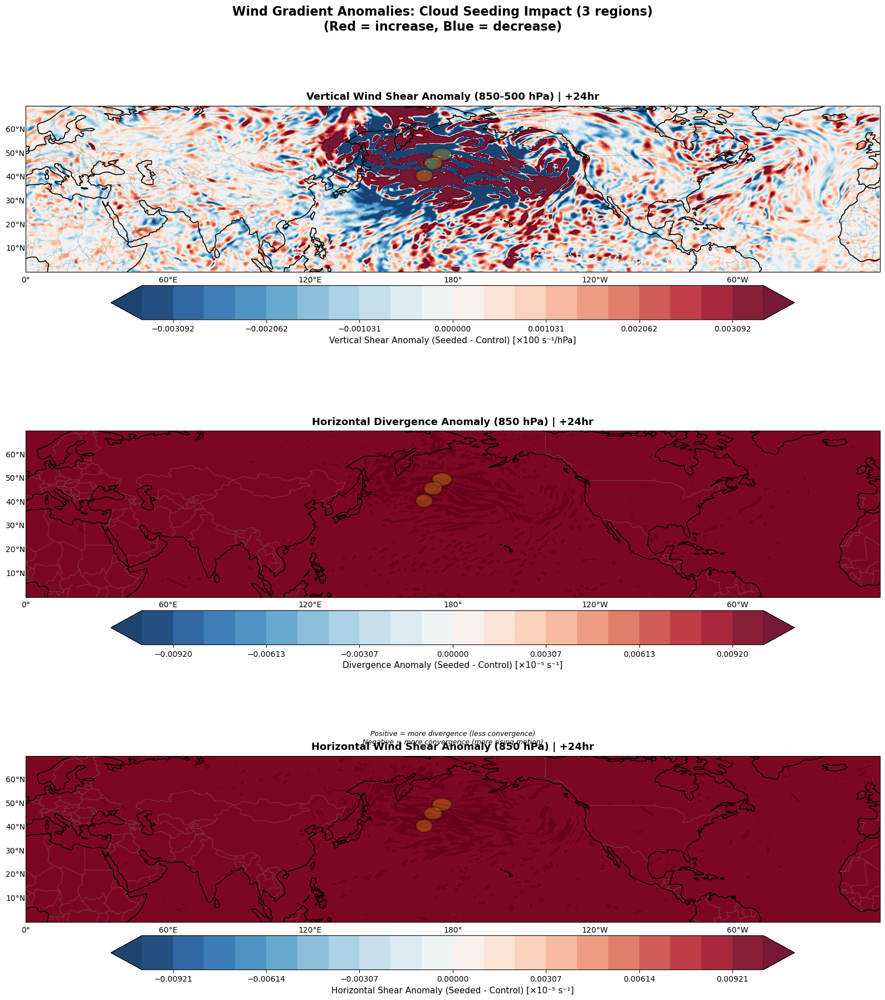

✅ Wind gradient anomaly visualization complete!


In [224]:
# ========== 4. VISUALIZE ALL WIND GRADIENT ANOMALIES ==========
print("\n🎨 Creating wind gradient anomaly visualization...")

from matplotlib import cm
from cartopy.geodesic import Geodesic
from matplotlib.patches import Polygon

proj = ccrs.PlateCarree(central_longitude=180)
data_crs = ccrs.PlateCarree()
extent = [-180, 180, 0, 70]

fig, axes = plt.subplots(3, 1, figsize=(16, 18),
                       subplot_kw={'projection': proj})

# Prepare lon/lat grids for plotting
if lons_np.ndim == 1:
  lon_plot, lat_plot = np.meshgrid(lons_np, lats_np)
else:
  lon_plot, lat_plot = lons_np, lats_np

# Common setup for all subplots
def setup_map(ax, title):
  ax.add_feature(cfeature.LAND, facecolor='lightgray', alpha=0.4, zorder=1)
  ax.add_feature(cfeature.OCEAN, facecolor='lightblue', alpha=0.25, zorder=0)
  ax.add_feature(cfeature.COASTLINE, linewidth=1.2, edgecolor='black', zorder=4)
  ax.add_feature(cfeature.BORDERS, linewidth=0.6, edgecolor='gray', alpha=0.5, zorder=4)
  ax.set_extent(extent, crs=data_crs)

  gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
  gl.top_labels = False
  gl.right_labels = False
  gl.xlabel_style = {'size': 10}
  gl.ylabel_style = {'size': 10}

  ax.set_title(title, fontsize=13, fontweight='bold', pad=8)

# Helper to add seeding locations
def add_seeding_circles(ax):
  g = Geodesic()
  for location in seeding_locations:
      poly = g.circle(lon=location['lon_center'], lat=location['lat_center'],
                     radius=location['radius_km']*1000, n_samples=180)
      xs, ys = zip(*poly)
      polygon = Polygon(list(zip(xs, ys)), transform=ccrs.Geodetic(),
                       facecolor='gold', edgecolor='black', linewidth=2.5,
                       alpha=0.25, zorder=6)
      ax.add_patch(polygon)

# ========== SUBPLOT 1: VERTICAL SHEAR ANOMALY ==========
ax = axes[0]
setup_map(ax, f'Vertical Wind Shear Anomaly (850-500 hPa) | +{(time_step+1)*6}hr')

vmax = np.nanpercentile(np.abs(vertical_shear_anomaly), 95)
levels = np.linspace(-vmax, vmax, 21)

cf1 = ax.contourf(lon_plot, lat_plot, vertical_shear_anomaly,
                levels=levels, cmap='RdBu_r', extend='both',
                transform=data_crs, alpha=0.9, zorder=2)

add_seeding_circles(ax)

cbar1 = plt.colorbar(cf1, ax=ax, orientation='horizontal', pad=0.05, shrink=0.8)
cbar1.set_label('Vertical Shear Anomaly (Seeded - Control) [×100 s⁻¹/hPa]', fontsize=11)

# ========== SUBPLOT 2: DIVERGENCE ANOMALY ==========
ax = axes[1]
setup_map(ax, f'Horizontal Divergence Anomaly (850 hPa) | +{(time_step+1)*6}hr')

vmax = np.nanpercentile(np.abs(divergence_anomaly), 95)
levels = np.linspace(-vmax, vmax, 21)

cf2 = ax.contourf(lon_plot, lat_plot, divergence_anomaly,
                levels=levels, cmap='RdBu_r', extend='both',
                transform=data_crs, alpha=0.9, zorder=2)

add_seeding_circles(ax)

cbar2 = plt.colorbar(cf2, ax=ax, orientation='horizontal', pad=0.05, shrink=0.8)
cbar2.set_label('Divergence Anomaly (Seeded - Control) [×10⁻⁵ s⁻¹]', fontsize=11)
cbar2.ax.text(0.5, -2.5, 'Positive = more divergence (less convergence)\nNegative = more convergence (more rising motion)',
            ha='center', va='top', fontsize=9, style='italic', transform=cbar2.ax.transAxes)

# ========== SUBPLOT 3: HORIZONTAL SHEAR ANOMALY ==========
ax = axes[2]
setup_map(ax, f'Horizontal Wind Shear Anomaly (850 hPa) | +{(time_step+1)*6}hr')

vmax = np.nanpercentile(np.abs(horiz_shear_anomaly), 95)
levels = np.linspace(-vmax, vmax, 21)

cf3 = ax.contourf(lon_plot, lat_plot, horiz_shear_anomaly,
                levels=levels, cmap='RdBu_r', extend='both',
                transform=data_crs, alpha=0.9, zorder=2)

add_seeding_circles(ax)

cbar3 = plt.colorbar(cf3, ax=ax, orientation='horizontal', pad=0.05, shrink=0.8)
cbar3.set_label('Horizontal Shear Anomaly (Seeded - Control) [×10⁻⁵ s⁻¹]', fontsize=11)

plt.suptitle(f'Wind Gradient Anomalies: Cloud Seeding Impact ({len(seeding_locations)} regions)\n' +
           '(Red = increase, Blue = decrease)',
           fontsize=16, fontweight='bold', y=0.995)

plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.show()

print("✅ Wind gradient anomaly visualization complete!")


📈 Creating time series at first seeding location...
Nearest grid point: Lat=49.50°, Lon=175.50°


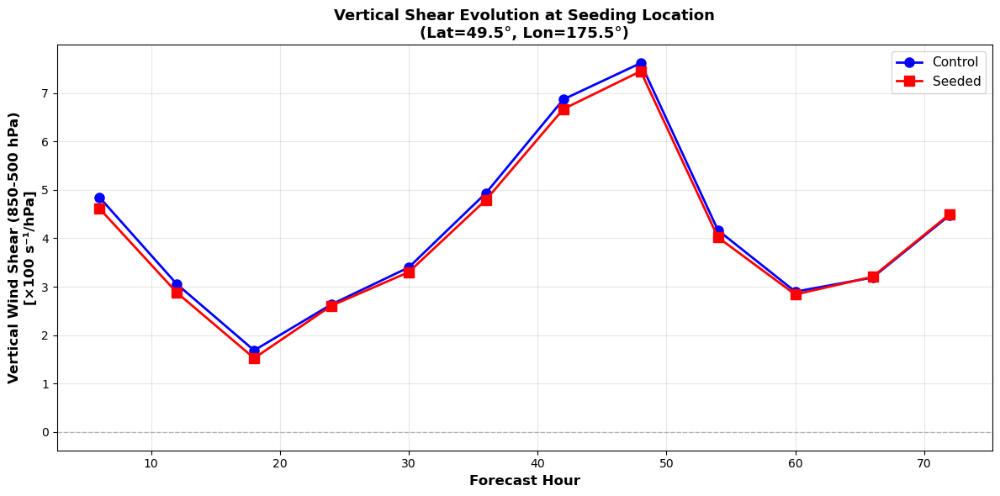

✅ Time series complete!


In [225]:
# ========== 5. OPTIONAL: TIME SERIES AT SEEDING LOCATION ==========
print("\n📈 Creating time series at first seeding location...")

# Pick first seeding location
seed_lat = seeding_locations[0]['lat_center']
seed_lon = seeding_locations[0]['lon_center']

# Find nearest grid point
if lons_np.ndim == 1:
  lat_idx = np.argmin(np.abs(lats_np - seed_lat))
  lon_idx = np.argmin(np.abs(lons_np - seed_lon))
else:
  distances = np.sqrt((lat_2d - seed_lat)**2 + (lon_2d - seed_lon)**2)
  lat_idx, lon_idx = np.unravel_index(np.argmin(distances), distances.shape)

print(f"Nearest grid point: Lat={lats_np[lat_idx] if lats_np.ndim==1 else lat_2d[lat_idx,lon_idx]:.2f}°, "
    f"Lon={lons_np[lon_idx] if lons_np.ndim==1 else lon_2d[lat_idx,lon_idx]:.2f}°")

# Extract time series for all forecast steps
time_hours = [(i+1)*6 for i in range(len(preds_control))]

# Find level indices once
level_850_idx = pressure_levels.index(850.0)
level_500_idx = pressure_levels.index(500.0)

# Storage
vert_shear_ctrl_ts = []
vert_shear_seed_ts = []

for step in range(len(preds_control)):
  # Extract winds from atmos_vars
  u850_c = preds_control[step].atmos_vars['u'][0, 0, level_850_idx].numpy()
  v850_c = preds_control[step].atmos_vars['v'][0, 0, level_850_idx].numpy()
  u500_c = preds_control[step].atmos_vars['u'][0, 0, level_500_idx].numpy()
  v500_c = preds_control[step].atmos_vars['v'][0, 0, level_500_idx].numpy()

  u850_s = preds_seeded[step].atmos_vars['u'][0, 0, level_850_idx].numpy()
  v850_s = preds_seeded[step].atmos_vars['v'][0, 0, level_850_idx].numpy()
  u500_s = preds_seeded[step].atmos_vars['u'][0, 0, level_500_idx].numpy()
  v500_s = preds_seeded[step].atmos_vars['v'][0, 0, level_500_idx].numpy()

  # Vertical shear at this point
  du_c = (u500_c[lat_idx, lon_idx] - u850_c[lat_idx, lon_idx]) / (500-850)
  dv_c = (v500_c[lat_idx, lon_idx] - v850_c[lat_idx, lon_idx]) / (500-850)
  shear_c = np.sqrt(du_c**2 + dv_c**2) * 100

  du_s = (u500_s[lat_idx, lon_idx] - u850_s[lat_idx, lon_idx]) / (500-850)
  dv_s = (v500_s[lat_idx, lon_idx] - v850_s[lat_idx, lon_idx]) / (500-850)
  shear_s = np.sqrt(du_s**2 + dv_s**2) * 100

  vert_shear_ctrl_ts.append(shear_c)
  vert_shear_seed_ts.append(shear_s)

# Plot time series
fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(time_hours, vert_shear_ctrl_ts, 'b-o', linewidth=2, markersize=8, label='Control')
ax.plot(time_hours, vert_shear_seed_ts, 'r-s', linewidth=2, markersize=8, label='Seeded')

ax.axhline(0, color='gray', linestyle='--', linewidth=1, alpha=0.5)
ax.set_xlabel('Forecast Hour', fontsize=12, fontweight='bold')
ax.set_ylabel('Vertical Wind Shear (850-500 hPa)\n[×100 s⁻¹/hPa]', fontsize=12, fontweight='bold')
ax.set_title(f'Vertical Shear Evolution at Seeding Location\n(Lat={seed_lat:.1f}°, Lon={seed_lon:.1f}°)',
          fontsize=13, fontweight='bold')
ax.legend(fontsize=11, loc='best')
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("✅ Time series complete!")

In [228]:
  # Check if there's a systematic offset
  print(f"Control mean: {np.nanmean(horiz_shear_ctrl):.10f}")
  print(f"Seeded mean: {np.nanmean(horiz_shear_seed):.10f}")
  print(f"Anomaly mean: {np.nanmean(horiz_shear_anomaly):.10f}")
  print(f"Anomaly std: {np.nanstd(horiz_shear_anomaly):.10f}")

  # Check if anomaly is significant compared to background
  relative_change = np.nanmean(horiz_shear_anomaly) / np.nanmean(horiz_shear_ctrl) * 100
  print(f"Relative change: {relative_change:.2f}%")

Control mean: 1808829421707.0651855469
Seeded mean: 1809059049359.1140136719
Anomaly mean: 229627652.0483676493
Anomaly std: 472995554739.9885253906
Relative change: 0.01%


## IVT Map

In [41]:
# Calculate IVT for both control and seeded predictions
print("🌊 Calculating IVT for trajectory tracking...")

pressure_levels = batch_control.metadata.atmos_levels

# Control IVT
ivt_control = []
for i, pred in enumerate(preds_control):
    u = pred.atmos_vars["u"][:, 0]
    v = pred.atmos_vars["v"][:, 0]
    q = pred.atmos_vars["q"][:, 0]
    _, _, ivt_mag = calculate_ivt_integrated(u, v, q, pressure_levels)
    ivt_control.append(ivt_mag[0].numpy())

# Seeded IVT
ivt_seeded = []
for i, pred in enumerate(preds_seeded):
    u = pred.atmos_vars["u"][:, 0]
    v = pred.atmos_vars["v"][:, 0]
    q = pred.atmos_vars["q"][:, 0]
    _, _, ivt_mag = calculate_ivt_integrated(u, v, q, pressure_levels)
    ivt_seeded.append(ivt_mag[0].numpy())

# Calculate IVT differences
ivt_diff = [seeded - control for seeded, control in zip(ivt_seeded, ivt_control)]

print(f"✅ IVT calculated for {len(ivt_control)} time steps")
print(f"\n📊 IVT Difference Stats (Seeded - Control):")
for i, diff in enumerate(ivt_diff):
    hours = (i+1)*6
    max_diff = np.abs(diff).max()
    mean_diff = diff.mean()
    print(f"   +{hours:2d}hr: Max |Δ|={max_diff:6.1f}, Mean Δ={mean_diff:+6.1f} kg/(m·s)")

🌊 Calculating IVT for trajectory tracking...
✅ IVT calculated for 12 time steps

📊 IVT Difference Stats (Seeded - Control):
   + 6hr: Max |Δ|= 355.4, Mean Δ=  -0.1 kg/(m·s)
   +12hr: Max |Δ|= 292.4, Mean Δ=  -0.1 kg/(m·s)
   +18hr: Max |Δ|= 213.0, Mean Δ=  -0.1 kg/(m·s)
   +24hr: Max |Δ|= 252.9, Mean Δ=  -0.1 kg/(m·s)
   +30hr: Max |Δ|= 236.1, Mean Δ=  -0.1 kg/(m·s)
   +36hr: Max |Δ|= 197.1, Mean Δ=  -0.1 kg/(m·s)
   +42hr: Max |Δ|= 212.1, Mean Δ=  -0.0 kg/(m·s)
   +48hr: Max |Δ|= 237.3, Mean Δ=  -0.0 kg/(m·s)
   +54hr: Max |Δ|= 268.9, Mean Δ=  -0.0 kg/(m·s)
   +60hr: Max |Δ|= 224.1, Mean Δ=  -0.0 kg/(m·s)
   +66hr: Max |Δ|= 149.6, Mean Δ=  -0.0 kg/(m·s)
   +72hr: Max |Δ|= 159.1, Mean Δ=  -0.0 kg/(m·s)


📊 Creating IVT anomaly maps (Seeded − Control)...


/tmp/ipykernel_1516419/929113872.py:115: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.99])


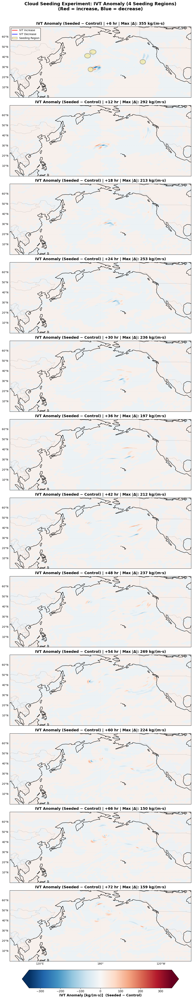

✅ IVT anomaly visualization complete!


In [42]:
print("📊 Creating IVT anomaly maps (Seeded − Control)...")

# ---------- Setup ----------
proj = ccrs.PlateCarree(central_longitude=180)
data_crs = ccrs.PlateCarree()
extent = [90, 270, 0, 70]  # NH focus

lon_grid, lat_grid = np.meshgrid(lons_np, lats_np)

# NaN-safe copies
ivt_diff = [np.array(a, dtype=float) for a in ivt_diff]
n_steps = len(ivt_diff)

# ---------- Shared symmetric color scale across ALL steps ----------
amax = np.nanmax([np.nanmax(np.abs(x)) for x in ivt_diff])
# avoid degenerate scale
amax = 1.0 if not np.isfinite(amax) or amax == 0 else amax
levels = np.linspace(-amax, amax, 21)

fig, axes = plt.subplots(
  n_steps, 1,
  figsize=(12, max(4.5*n_steps, 5)),
  subplot_kw={'projection': proj}
)

if n_steps == 1:
  axes = np.array([axes])

# ---------- Helper: geodesic filled circle ----------
def plot_geodesic_filled_circle(ax, lon, lat, radius_km, n=180, **kwargs):
  """Plot a filled geodesic circle"""
  from cartopy.geodesic import Geodesic
  from matplotlib.patches import Polygon
  g = Geodesic()
  poly = g.circle(lon=lon, lat=lat, radius=radius_km*1000.0, n_samples=n)
  xs, ys = zip(*poly)
  # Create filled polygon
  polygon = Polygon(list(zip(xs, ys)), transform=ccrs.Geodetic(), **kwargs)
  ax.add_patch(polygon)
  return polygon

for idx in range(n_steps):
  hours = (idx+1)*6
  ax = axes[idx]

  # Base map
  ax.add_feature(cfeature.LAND, facecolor='lightgray', alpha=0.4, zorder=1)
  ax.add_feature(cfeature.OCEAN, facecolor='lightblue', alpha=0.25, zorder=0)
  ax.add_feature(cfeature.COASTLINE, linewidth=1.2, edgecolor='black', zorder=4)
  ax.add_feature(cfeature.BORDERS, linewidth=0.6, edgecolor='gray', alpha=0.5, zorder=4)
  ax.set_extent(extent, crs=data_crs)

  gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
  gl.top_labels = False
  gl.right_labels = False
  gl.bottom_labels = (idx == n_steps - 1)
  gl.left_labels = True
  gl.xlabel_style = {'size': 10}
  gl.ylabel_style = {'size': 10}

  # Anomaly fill (Seeded − Control)
  diff = ivt_diff[idx]
  im = ax.contourf(
      lon_grid, lat_grid, diff,
      levels=levels, cmap='RdBu_r', extend='both',
      transform=data_crs, alpha=0.9, zorder=2
  )

  # ========== PLOT ALL SEEDING LOCATIONS (only first row) ==========
  if idx == 0:
      # Loop through all seeding locations - just circles
      for i, location in enumerate(seeding_locations):
          # Plot filled circle with transparency
          plot_geodesic_filled_circle(
              ax,
              location['lon_center'],
              location['lat_center'],
              location['radius_km'],
              n=180,
              facecolor='gold',      # Yellow/gold color
              edgecolor='black',     # Black outline
              linewidth=2.5,
              alpha=0.25,            # 25% opacity - see data behind
              zorder=6
          )

      # Legend
      from matplotlib.lines import Line2D
      from matplotlib.patches import Patch
      legend_elements = [
          Line2D([0], [0], color='red', linewidth=2, linestyle='-', label='IVT Increase'),
          Line2D([0], [0], color='blue', linewidth=2, linestyle='-', label='IVT Decrease'),
          Patch(facecolor='gold', edgecolor='black', linewidth=2, alpha=0.25, label='Seeding Region')
      ]
      ax.legend(handles=legend_elements, loc='upper left', fontsize=10,
               framealpha=0.95, edgecolor='black', fancybox=True)

  max_abs = np.nanmax(np.abs(diff))
  ax.set_title(f'IVT Anomaly (Seeded − Control) | +{hours} hr | Max |Δ|: {max_abs:.0f} kg/(m·s)',
               fontsize=14, fontweight='bold', pad=8)

# Shared colorbar (symmetric)
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
sm = ScalarMappable(norm=Normalize(vmin=-amax, vmax=amax), cmap='RdBu_r')
sm.set_array([])

cbar_ax = fig.add_axes([0.15, 0.02, 0.7, 0.018])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal', extend='both')
cbar.set_label('IVT Anomaly [kg/(m·s)]  (Seeded − Control)', fontsize=13, fontweight='bold')
cbar.ax.tick_params(labelsize=11)

plt.suptitle(f'Cloud Seeding Experiment: IVT Anomaly ({len(seeding_locations)} Seeding Regions)\n(Red = increase, Blue = decrease)',
           fontsize=17, fontweight='bold', y=0.995)
plt.tight_layout(rect=[0, 0.04, 1, 0.99])
plt.show()

print("✅ IVT anomaly visualization complete!")

In [ ]:
# print("📊 Creating IVT comparison maps (Control | Seeded)...")

from matplotlib import cm
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

# ---------- Setup ----------
proj = ccrs.PlateCarree(central_longitude=180)
data_crs = ccrs.PlateCarree()
extent = [60, 300, 0, 70]  # NH focus

lon_grid, lat_grid = np.meshgrid(lons_np, lats_np)

n_steps = len(ivt_control)

# ---------- Helper: geodesic filled circle ----------
def plot_geodesic_filled_circle(ax, lon, lat, radius_km, n=180, **kwargs):
  """Plot a filled geodesic circle"""
  from cartopy.geodesic import Geodesic
  from matplotlib.patches import Polygon
  g = Geodesic()
  poly = g.circle(lon=lon, lat=lat, radius=radius_km*1000.0, n_samples=n)
  xs, ys = zip(*poly)
  polygon = Polygon(list(zip(xs, ys)), transform=ccrs.Geodetic(), **kwargs)
  ax.add_patch(polygon)
  return polygon

def setup_map(ax, title, extent):
  """Setup map features"""
  ax.add_feature(cfeature.LAND, facecolor='lightgray', alpha=0.4, zorder=1)
  ax.add_feature(cfeature.OCEAN, facecolor='lightblue', alpha=0.25, zorder=0)
  ax.add_feature(cfeature.COASTLINE, linewidth=1.2, edgecolor='black', zorder=4)
  ax.add_feature(cfeature.BORDERS, linewidth=0.6, edgecolor='gray', alpha=0.5, zorder=4)
  ax.set_extent(extent, crs=data_crs)

  gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
  gl.top_labels = False
  gl.right_labels = False
  gl.xlabel_style = {'size': 10}
  gl.ylabel_style = {'size': 10}

  ax.set_title(title, fontsize=13, fontweight='bold', pad=8)

def add_seeding_circles(ax):
  """Add seeding location markers"""
  for location in seeding_locations:
      plot_geodesic_filled_circle(
          ax, location['lon_center'], location['lat_center'],
          location['radius_km'], n=180,
          facecolor='gold', edgecolor='black', linewidth=2.5,
          alpha=0.25, zorder=6
      )

# ---------- Create figure with 2 columns per time step ----------
fig = plt.figure(figsize=(16, 5.5 * n_steps))

# Color scale - use same scale for both control and seeded
ivt_vmax = max(np.nanpercentile(ivt_control[-1], 98),
             np.nanpercentile(ivt_seeded[-1], 98))
ivt_levels = np.linspace(0, ivt_vmax, 20)

for idx in range(n_steps):
  hours = (idx+1)*6

  # ========== COLUMN 1: CONTROL ==========
  ax1 = plt.subplot(n_steps, 2, idx*2 + 1, projection=proj)
  setup_map(ax1, f'Control IVT | +{hours}hr', extent)

  ivt_ctrl = ivt_control[idx]
  cf1 = ax1.contourf(lon_grid, lat_grid, ivt_ctrl,
                     levels=ivt_levels, cmap='YlGnBu', extend='max',
                     transform=data_crs, alpha=0.9, zorder=2)

  # Add IVT contours (AR threshold at 250 kg/m/s)
  cs1 = ax1.contour(lon_grid, lat_grid, ivt_ctrl,
                    levels=[500, 750], colors='black',
                    linewidths=[2.0, 1.2, 0.8], linestyles='-',
                    transform=data_crs, zorder=3)
  ax1.clabel(cs1, inline=True, fontsize=9, fmt='%d')

  # Add seeding circles on first row
  if idx == 0:
      add_seeding_circles(ax1)
      # Add legend
      from matplotlib.lines import Line2D
      from matplotlib.patches import Patch
      legend_elements = [
          Line2D([0], [0], color='black', linewidth=2, label='IVT = 500 kg/(m·s) (AR)'),
          Patch(facecolor='gold', edgecolor='black', linewidth=2, alpha=0.25, label='Seeding Region')
      ]
      ax1.legend(handles=legend_elements, loc='upper left', fontsize=9,
                framealpha=0.95, edgecolor='black')

  # Add stats
  mean_ctrl = np.nanmean(ivt_ctrl)
  max_ctrl = np.nanmax(ivt_ctrl)
  ax1.text(0.02, 0.02, f'Mean: {mean_ctrl:.0f}\nMax: {max_ctrl:.0f}',
           transform=ax1.transAxes, fontsize=9,
           bbox=dict(boxstyle='round', facecolor='white', alpha=0.8),
           verticalalignment='bottom')

  # ========== COLUMN 2: SEEDED ==========
  ax2 = plt.subplot(n_steps, 2, idx*2 + 2, projection=proj)
  setup_map(ax2, f'Seeded IVT | +{hours}hr', extent)

  ivt_seed = ivt_seeded[idx]
  cf2 = ax2.contourf(lon_grid, lat_grid, ivt_seed,
                     levels=ivt_levels, cmap='YlGnBu', extend='max',
                     transform=data_crs, alpha=0.9, zorder=2)

  # Add IVT contours
  cs2 = ax2.contour(lon_grid, lat_grid, ivt_seed,
                    levels=[500, 750], colors='black',
                    linewidths=[2.0, 1.2, 0.8], linestyles='-',
                    transform=data_crs, zorder=3)
  ax2.clabel(cs2, inline=True, fontsize=9, fmt='%d')

  # Add seeding circles on first row
  if idx == 0:
      add_seeding_circles(ax2)

  # Add stats
  mean_seed = np.nanmean(ivt_seed)
  max_seed = np.nanmax(ivt_seed)
  diff_mean = mean_seed - mean_ctrl
  ax2.text(0.02, 0.02, f'Mean: {mean_seed:.0f} (Δ{diff_mean:+.0f})\nMax: {max_seed:.0f}',
           transform=ax2.transAxes, fontsize=9,
           bbox=dict(boxstyle='round', facecolor='white', alpha=0.8),
           verticalalignment='bottom')

# ========== SHARED COLORBAR ==========
sm_ivt = ScalarMappable(norm=Normalize(vmin=0, vmax=ivt_vmax), cmap='YlGnBu')
sm_ivt.set_array([])
cbar_ax = fig.add_axes([0.15, 0.02, 0.7, 0.018])
cbar = fig.colorbar(sm_ivt, cax=cbar_ax, orientation='horizontal', extend='max')
cbar.set_label('IVT [kg/(m·s)]', fontsize=13, fontweight='bold')
cbar.ax.tick_params(labelsize=11)

plt.suptitle(f'Cloud Seeding Impact on Atmospheric River ({len(seeding_locations)} Seeding Regions)\n' +
           'Left: Control (No Seeding) | Right: Seeded',
           fontsize=17, fontweight='bold', y=0.998)

plt.tight_layout(rect=[0, 0.04, 1, 0.995])
plt.show()

print("✅ IVT comparison visualization complete!")

## Landfall

In [43]:
# ========== CONFIGURATION ==========
from scipy.interpolate import RegularGridInterpolator

VISUALIZATION_HOUR =120

# Define West Coast region
lat_range = (30, 55)  # West Coast latitudes (California to Washington)
lon_range = (230, 245)  # Approximate West Coast longitudes (0-360 format)

print(f"\n🗺️  Extracting US West Coast boundary from Natural Earth data...")

# Extract coastline geometries from cartopy
coastline = cfeature.COASTLINE
coastline_geometries = list(coastline.with_scale('50m').geometries())

# Extract West Coast boundary points
coastline_points = []

def extract_coords_from_geom(geom):
    """Recursively extract coordinates from any geometry type."""
    coords_list = []

    # Handle multi-part geometries (MultiLineString, MultiPolygon, etc.)
    if hasattr(geom, 'geoms'):
        for sub_geom in geom.geoms:
            coords_list.extend(extract_coords_from_geom(sub_geom))
    # Handle Polygon
    elif hasattr(geom, 'exterior'):
        coords_list.extend(list(geom.exterior.coords))
    # Handle LineString or Point
    elif hasattr(geom, 'coords'):
        coords_list.extend(list(geom.coords))

    return coords_list

for geom in coastline_geometries:
    # Get all coordinates from this geometry (handles multi-part)
    coords = extract_coords_from_geom(geom)

    # Filter for West Coast region
    for lon, lat in coords:
        # Convert negative longitudes to 0-360 format
        if lon < 0:
            lon = lon + 360

        # Keep points in West Coast region
        if lat_range[0] <= lat <= lat_range[1] and lon_range[0] <= lon <= lon_range[1]:
            coastline_points.append((lon, lat))

# Convert to array and sort by latitude
coastline_points = np.array(coastline_points)
coastline_points = coastline_points[np.argsort(coastline_points[:, 1])]  # Sort by latitude

print(f"  Extracted {len(coastline_points)} coastline points")
print(f"  Latitude range: {coastline_points[:, 1].min():.2f}°N to {coastline_points[:, 1].max():.2f}°N")
print(f"  Longitude range: {coastline_points[:, 0].min():.2f}°E to {coastline_points[:, 0].max():.2f}°E")
print()

# Create latitude bins for sampling
lat_bins = np.linspace(lat_range[0], lat_range[1], 100)  # 100 points along coast

# For each latitude bin, find the representative coastal longitude
coastal_lon_at_lat = []
coastal_lat_samples = []

for lat_center in lat_bins:
    # Find coastline points within ±0.5° of this latitude
    lat_mask = np.abs(coastline_points[:, 1] - lat_center) < 0.5
    nearby_points = coastline_points[lat_mask]

    if len(nearby_points) > 0:
        # Use the median longitude (most seaward point)
        coastal_lon = np.median(nearby_points[:, 0])
        coastal_lon_at_lat.append(coastal_lon)
        coastal_lat_samples.append(lat_center)

coastal_lon_at_lat = np.array(coastal_lon_at_lat)
coastal_lat_samples = np.array(coastal_lat_samples)

print(f"  Created {len(coastal_lat_samples)} coastal sampling points")
print()


🗺️  Extracting US West Coast boundary from Natural Earth data...
  Extracted 1177 coastline points
  Latitude range: 30.08°N to 54.24°N
  Longitude range: 230.06°E to 244.21°E

  Created 98 coastal sampling points



In [44]:
# ========== LOAD COORDINATE GRIDS ==========
lats = batch_control.metadata.lat.cpu().numpy()
lons = batch_control.metadata.lon.cpu().numpy()

print(f"🌍 Grid information:")
print(f"  Latitude: {len(lats)} points")
print(f"  Longitude: {len(lons)} points")
print()

# ========== FUNCTION: EXTRACT COASTAL IVT PROFILE ==========
def extract_coastal_profile(ivt_field, lats, lons, coastal_lats, coastal_lons):
    """
    Extract IVT values along the coastal sampling line using interpolation

    Parameters:
    -----------
    ivt_field : array (lat, lon)
        IVT field to sample
    lats, lons : arrays
        Grid coordinates
    coastal_lats, coastal_lons : arrays
        Coordinates of coastal sampling points

    Returns:
    --------
    coastal_ivt : array
        IVT values along the coast
    """
    # Create interpolator
    interpolator = RegularGridInterpolator(
        (lats, lons),
        ivt_field,
        method='linear',
        bounds_error=False,
        fill_value=0
    )

    # Sample along coastal line
    coastal_points = np.column_stack([coastal_lats, coastal_lons])
    coastal_ivt = interpolator(coastal_points)

    return coastal_ivt

# ========== FUNCTION: FIND LANDFALL POSITION ==========
def find_landfall_position(coastal_ivt, coastal_lats, coastal_lons, min_ivt=250):
    """
    Find where maximum IVT occurs along the coast

    Parameters:
    -----------
    coastal_ivt : array
        IVT values along coast
    coastal_lats, coastal_lons : arrays
        Coastal coordinates
    min_ivt : float
        Minimum IVT threshold for AR detection

    Returns:
    --------
    dict with landfall position and IVT
    """
    # Find indices where IVT exceeds threshold
    ar_mask = coastal_ivt >= min_ivt

    if not ar_mask.any():
        return None  # No AR detected at coast

    # Find maximum IVT position
    max_idx = np.argmax(coastal_ivt)

    return {
        'lat': coastal_lats[max_idx],
        'lon': coastal_lons[max_idx],
        'ivt': coastal_ivt[max_idx],
        'coastal_profile': coastal_ivt,
    }

# ========== ANALYZE ALL TIMESTEPS ==========
print("🔍 Analyzing landfall positions for all timesteps...")
print()

landfall_control = []
landfall_seeded = []

for i in range(len(ivt_control)):
    hours = (i + 1) * 6

    # Extract coastal profiles
    profile_control = extract_coastal_profile(
        ivt_control[i], lats, lons, coastal_lat_samples, coastal_lon_at_lat
    )
    profile_seeded = extract_coastal_profile(
        ivt_seeded[i], lats, lons, coastal_lat_samples, coastal_lon_at_lat
    )

    # Find landfall positions
    lf_control = find_landfall_position(profile_control, coastal_lat_samples, coastal_lon_at_lat)
    lf_seeded = find_landfall_position(profile_seeded, coastal_lat_samples, coastal_lon_at_lat)

    if lf_control is not None and lf_seeded is not None:
        lf_control['hours'] = hours
        lf_seeded['hours'] = hours
        landfall_control.append(lf_control)
        landfall_seeded.append(lf_seeded)

        # Calculate shift
        lat_shift = lf_seeded['lat'] - lf_control['lat']
        lon_shift = lf_seeded['lon'] - lf_control['lon']
        distance_shift = np.sqrt((lat_shift * 111)**2 + (lon_shift * 111 * np.cos(np.radians(lf_control['lat'])))**2)

        if (i + 1) % 4 == 0:  # Print every 24 hours
            print(f"  +{hours:3d}hr: Control={lf_control['lat']:.2f}°N, Seeded={lf_seeded['lat']:.2f}°N, "
                  f"Shift={lat_shift:+.2f}° ({lat_shift * 111:+.0f} km)")

print(f"\n✅ Found {len(landfall_control)} timesteps with AR landfall")
print()

🌍 Grid information:
  Latitude: 720 points
  Longitude: 1440 points

🔍 Analyzing landfall positions for all timesteps...

  + 24hr: Control=51.46°N, Seeded=51.46°N, Shift=+0.00° (+0 km)
  + 48hr: Control=42.88°N, Seeded=42.88°N, Shift=+0.00° (+0 km)
  + 72hr: Control=35.30°N, Seeded=35.30°N, Shift=+0.00° (+0 km)

✅ Found 12 timesteps with AR landfall



📊 Creating landfall visualization...
  Visualizing forecast hour: +72hr


📋 Landfall Shift Summary
Time     Control Lat    Seeded Lat     Shift        Control IVT    Seeded IVT    
(hr)     [°N]           [°N]           [km]         [kg/m/s]       [kg/m/s]      
--------------------------------------------------------------------------------
6        47.42          47.42          +0           350            350           
12       44.39          44.65          +28          499            505           
18       51.46          51.46          +0           594            561           
24       51.46          51.46          +0           625            633           
30       46.67          46.67          +0           600            624           
36       44.90          44.90          +0           803            804           
42       42.63          42.63          +0           755            750           
48       42.88          42.88          +0           1132           1139          


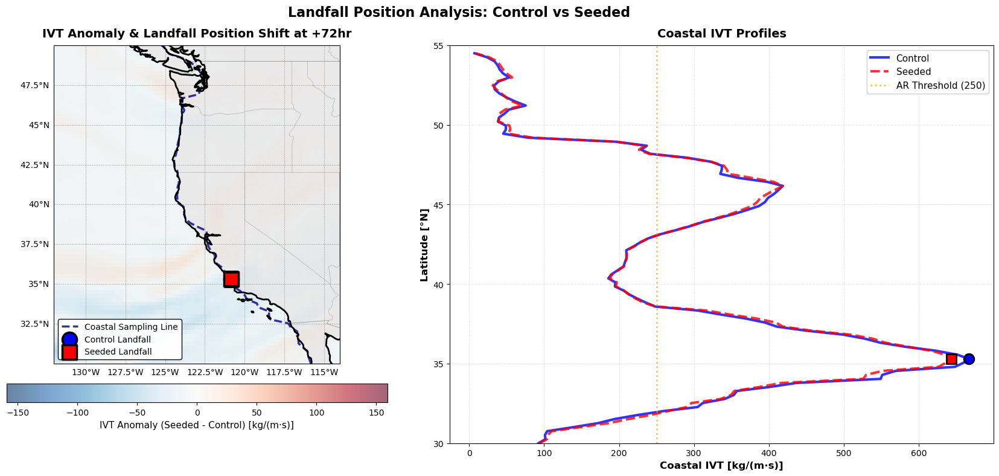

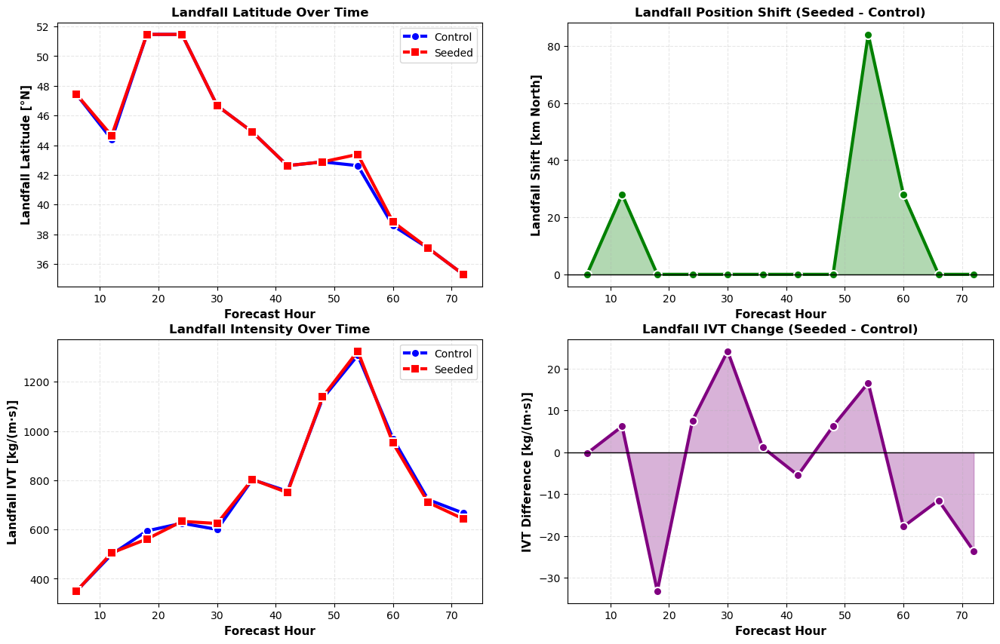

In [45]:
# ========== VISUALIZE LANDFALL SHIFT ==========
if len(landfall_control) > 0:
    print("📊 Creating landfall visualization...")

    # Select which timestep to visualize
    if VISUALIZATION_HOUR == -1:
        # Use final timestep
        viz_idx = -1
        viz_control = landfall_control[-1]
        viz_seeded = landfall_seeded[-1]
    else:
        # Find timestep closest to requested hour
        hours_list = [lf['hours'] for lf in landfall_control]
        viz_idx = min(range(len(hours_list)), key=lambda i: abs(hours_list[i] - VISUALIZATION_HOUR))
        viz_control = landfall_control[viz_idx]
        viz_seeded = landfall_seeded[viz_idx]

    viz_hours = viz_control['hours']
    print(f"  Visualizing forecast hour: +{viz_hours}hr")
    print()

    # Calculate shift at visualization timestep
    viz_lat_shift = viz_seeded['lat'] - viz_control['lat']
    viz_lon_shift = viz_seeded['lon'] - viz_control['lon']
    viz_distance_shift = np.sqrt(
        (viz_lat_shift * 111)**2 +
        (viz_lon_shift * 111 * np.cos(np.radians(viz_control['lat'])))**2
    )

    # ========== FIGURE 1: LANDFALL MAP ==========
    fig = plt.figure(figsize=(18, 8))

    # Panel 1: Map
    ax1 = plt.subplot(1, 2, 1, projection=ccrs.PlateCarree())

    # Plot IVT anomaly (seeded - control) as background for the selected timestep
    lon_grid, lat_grid = np.meshgrid(lons, lats)
    ivt_anomaly = ivt_seeded[viz_idx] - ivt_control[viz_idx]
    max_abs_anomaly = np.max(np.abs(ivt_anomaly))
    im = ax1.pcolormesh(lon_grid, lat_grid, ivt_anomaly,
                       cmap='RdBu_r', vmin=-max_abs_anomaly, vmax=max_abs_anomaly,
                       transform=ccrs.PlateCarree(), alpha=0.6, shading='auto')

    # Add map features
    ax1.add_feature(cfeature.COASTLINE, linewidth=2, edgecolor='black', zorder=5)
    ax1.add_feature(cfeature.BORDERS, linewidth=0.5, edgecolor='gray', alpha=0.7)
    ax1.add_feature(cfeature.LAND, facecolor='lightgray', alpha=0.4, zorder=1)
    ax1.add_feature(cfeature.STATES, linewidth=0.3, edgecolor='gray', alpha=0.5)
    ax1.add_feature(cfeature.OCEAN, facecolor='lightblue', alpha=0.3)

    # Draw coastal sampling line
    ax1.plot(coastal_lon_at_lat, coastal_lat_samples,
             color='darkblue', linestyle='--', linewidth=2.5,
             transform=ccrs.PlateCarree(),
             label='Coastal Sampling Line', zorder=4, alpha=0.8)

    # Plot landfall positions for selected timestep
    ax1.scatter(viz_control['lon'], viz_control['lat'],
               marker='o', s=300, c='blue', edgecolors='black', linewidths=2.5,
               transform=ccrs.PlateCarree(), label='Control Landfall', zorder=10)

    ax1.scatter(viz_seeded['lon'], viz_seeded['lat'],
               marker='s', s=300, c='red', edgecolors='black', linewidths=2.5,
               transform=ccrs.PlateCarree(), label='Seeded Landfall', zorder=10)

    # Draw arrow showing landfall shift
    ax1.annotate('',
                xy=(viz_seeded['lon'], viz_seeded['lat']),
                xytext=(viz_control['lon'], viz_control['lat']),
                arrowprops=dict(arrowstyle='->', lw=4, color='green'),
                transform=ccrs.PlateCarree(), zorder=9)

    # Set extent to West Coast
    ax1.set_extent([228, 246, 30, 50], crs=ccrs.PlateCarree())
    ax1.set_title(f'IVT Anomaly & Landfall Position Shift at +{viz_hours}hr',
                 fontsize=14, fontweight='bold', pad=10)

    # Gridlines
    gl = ax1.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.7, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False

    # Legend
    ax1.legend(loc='lower left', fontsize=10, framealpha=0.95, edgecolor='black')

    # Colorbar
    cbar = plt.colorbar(im, ax=ax1, orientation='horizontal', pad=0.05, shrink=0.7)
    cbar.set_label('IVT Anomaly (Seeded - Control) [kg/(m·s)]', fontsize=11)

    # Panel 2: Coastal IVT Profiles
    ax2 = plt.subplot(1, 2, 2)

    ax2.plot(viz_control['coastal_profile'], coastal_lat_samples,
            'b-', linewidth=3, label='Control', alpha=0.8)
    ax2.plot(viz_seeded['coastal_profile'], coastal_lat_samples,
            'r--', linewidth=3, label='Seeded', alpha=0.8)

    # Mark landfall positions
    ax2.plot(viz_control['ivt'], viz_control['lat'],
            'o', markersize=12, color='blue', markeredgecolor='black',
            markeredgewidth=2, zorder=5)
    ax2.plot(viz_seeded['ivt'], viz_seeded['lat'],
            's', markersize=12, color='red', markeredgecolor='black',
            markeredgewidth=2, zorder=5)

    # AR threshold line
    ax2.axvline(250, color='orange', linestyle=':', linewidth=2,
               alpha=0.7, label='AR Threshold (250)')

    ax2.set_xlabel('Coastal IVT [kg/(m·s)]', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Latitude [°N]', fontsize=12, fontweight='bold')
    ax2.set_title('Coastal IVT Profiles', fontsize=14, fontweight='bold', pad=10)
    ax2.grid(True, alpha=0.3, linestyle='--')
    ax2.legend(loc='best', fontsize=11, framealpha=0.95)
    ax2.set_ylim(lat_range)

    plt.suptitle(f'Landfall Position Analysis: Control vs Seeded',
                fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout()
    # plt.savefig('/scratch/moyanliu/Aurora Model/Perturbation/landfall_shift_map.png',
    #             dpi=300, bbox_inches='tight', facecolor='white')
    # print("  ✅ Saved: landfall_shift_map.png")

    # ========== FIGURE 2: LANDFALL SHIFT TIME SERIES ==========
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))

    hours_list = [lf['hours'] for lf in landfall_control]
    control_lats = [lf['lat'] for lf in landfall_control]
    seeded_lats = [lf['lat'] for lf in landfall_seeded]
    control_ivts = [lf['ivt'] for lf in landfall_control]
    seeded_ivts = [lf['ivt'] for lf in landfall_seeded]
    lat_shifts = [seeded_lats[i] - control_lats[i] for i in range(len(control_lats))]
    lat_shifts_km = [shift * 111 for shift in lat_shifts]

    # Plot 2a: Landfall latitude over time
    ax = axes[0, 0]
    ax.plot(hours_list, control_lats, 'o-', color='blue', linewidth=3,
            label='Control', markersize=8, markeredgecolor='white', markeredgewidth=1.5)
    ax.plot(hours_list, seeded_lats, 's-', color='red', linewidth=3,
            label='Seeded', markersize=8, markeredgecolor='white', markeredgewidth=1.5)
    ax.set_xlabel('Forecast Hour', fontsize=11, fontweight='bold')
    ax.set_ylabel('Landfall Latitude [°N]', fontsize=11, fontweight='bold')
    ax.set_title('Landfall Latitude Over Time', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3, linestyle='--')
    ax.legend(fontsize=10)

    # Plot 2b: Latitude shift over time
    ax = axes[0, 1]
    ax.plot(hours_list, lat_shifts_km, 'o-', color='green', linewidth=3,
            markersize=8, markeredgecolor='white', markeredgewidth=1.5)
    ax.axhline(0, color='black', linestyle='-', linewidth=1)
    ax.fill_between(hours_list, 0, lat_shifts_km, alpha=0.3, color='green')
    ax.set_xlabel('Forecast Hour', fontsize=11, fontweight='bold')
    ax.set_ylabel('Landfall Shift [km North]', fontsize=11, fontweight='bold')
    ax.set_title('Landfall Position Shift (Seeded - Control)', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3, linestyle='--')

    # Plot 2c: Landfall IVT intensity
    ax = axes[1, 0]
    ax.plot(hours_list, control_ivts, 'o-', color='blue', linewidth=3,
            label='Control', markersize=8, markeredgecolor='white', markeredgewidth=1.5)
    ax.plot(hours_list, seeded_ivts, 's-', color='red', linewidth=3,
            label='Seeded', markersize=8, markeredgecolor='white', markeredgewidth=1.5)
    ax.set_xlabel('Forecast Hour', fontsize=11, fontweight='bold')
    ax.set_ylabel('Landfall IVT [kg/(m·s)]', fontsize=11, fontweight='bold')
    ax.set_title('Landfall Intensity Over Time', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3, linestyle='--')
    ax.legend(fontsize=10)

    # Plot 2d: IVT difference
    ax = axes[1, 1]
    ivt_diffs = [seeded_ivts[i] - control_ivts[i] for i in range(len(control_ivts))]
    ax.plot(hours_list, ivt_diffs, 'o-', color='purple', linewidth=3,
            markersize=8, markeredgecolor='white', markeredgewidth=1.5)
    ax.axhline(0, color='black', linestyle='-', linewidth=1)
    ax.fill_between(hours_list, 0, ivt_diffs, alpha=0.3, color='purple')
    ax.set_xlabel('Forecast Hour', fontsize=11, fontweight='bold')
    ax.set_ylabel('IVT Difference [kg/(m·s)]', fontsize=11, fontweight='bold')
    ax.set_title('Landfall IVT Change (Seeded - Control)', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3, linestyle='--')

    # plt.tight_layout()
    # # plt.savefig('/scratch/moyanliu/Aurora Model/Perturbation/landfall_shift_timeseries.png',
    # #             dpi=300, bbox_inches='tight', facecolor='white')
    # print("  ✅ Saved: landfall_shift_timeseries.png")

    # ========== PRINT SUMMARY TABLE ==========
    print()
    print("=" * 80)
    print("📋 Landfall Shift Summary")
    print("=" * 80)
    print(f"{'Time':<8} {'Control Lat':<14} {'Seeded Lat':<14} {'Shift':<12} {'Control IVT':<14} {'Seeded IVT':<14}")
    print(f"{'(hr)':<8} {'[°N]':<14} {'[°N]':<14} {'[km]':<12} {'[kg/m/s]':<14} {'[kg/m/s]':<14}")
    print("-" * 80)

    for i in range(len(landfall_control)):
        print(f"{hours_list[i]:<8} {control_lats[i]:<14.2f} {seeded_lats[i]:<14.2f} "
              f"{lat_shifts_km[i]:<+12.0f} {control_ivts[i]:<14.0f} {seeded_ivts[i]:<14.0f}")

    print("=" * 80)

    # Show both final timestep and visualized timestep summaries
    final_control = landfall_control[-1]
    final_seeded = landfall_seeded[-1]
    final_hours = final_control['hours']
    final_lat_shift = final_seeded['lat'] - final_control['lat']
    final_distance_shift = np.sqrt(
        (final_lat_shift * 111)**2 +
        ((final_seeded['lon'] - final_control['lon']) * 111 * np.cos(np.radians(final_control['lat'])))**2
    )

    print(f"\n📊 Final Landfall (+{final_hours}hr):")
    print(f"  Control position: {final_control['lat']:.2f}°N, {final_control['lon']:.2f}°E")
    print(f"  Seeded position:  {final_seeded['lat']:.2f}°N, {final_seeded['lon']:.2f}°E")
    print(f"  Landfall shift:   {final_lat_shift:+.2f}° ({final_distance_shift:+.0f} km)")
    print(f"  Direction:        {'NORTH' if final_lat_shift > 0 else 'SOUTH'}")

    if viz_hours != final_hours:
        print(f"\n📊 Visualized Timestep (+{viz_hours}hr):")
        print(f"  Control position: {viz_control['lat']:.2f}°N, {viz_control['lon']:.2f}°E")
        print(f"  Seeded position:  {viz_seeded['lat']:.2f}°N, {viz_seeded['lon']:.2f}°E")
        print(f"  Landfall shift:   {viz_lat_shift:+.2f}° ({viz_distance_shift:+.0f} km)")
        print(f"  Direction:        {'NORTH' if viz_lat_shift > 0 else 'SOUTH'}")

    print()

else:
    print("⚠️  No AR landfall detected at the coast for these timesteps")

print("=" * 80)
print("✅ Landfall Analysis Complete!")
print("=" * 80)